# Ecommerce Capstone - Market Mix Modelling & Budget_Optimization

### Objective
    ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. Over the last year, they had spent a significant amount of money on marketing. Occasionally, they had also offered big-ticket promotions (similar to the Big Billion Day). They are about to create a marketing budget for the next year, which includes spending on commercials, online campaigns, and pricing & promotion strategies.
    Now they are in marketing budget planning for next year and need is to make investment this year impactful, for this market mix modelling will be used to identify different marketing levers against each product sub-category (Camera Accessory, Home Audio, Gaming Accessory) where investments need to be done in current year.

In [1]:
# importing required libraries
import pandas as pd
import numpy as np

# importing libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('ConsumerElectronics.csv')

In [3]:
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [4]:
# attributes of dataset
data.shape

(1648824, 20)

In [5]:
# attributes of dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
fsn_id                             1648824 non-null object
order_date                         1648824 non-null object
Year                               1648824 non-null int64
Month                              1648824 non-null int64
order_id                           1648824 non-null float64
order_item_id                      1648824 non-null float64
gmv                                1648824 non-null object
units                              1648824 non-null int64
deliverybdays                      1648824 non-null object
deliverycdays                      1648824 non-null object
s1_fact.order_payment_type         1648824 non-null object
sla                                1648824 non-null int64
cust_id                            1648824 non-null object
pincode                            1648824 non-null object
product_analytic_super_category    1648824 non-null object
prod

In [6]:
# attributes of dataset
data.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


In [7]:
# checking sample records
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


#### We notice few \N values which does not resonate with the data, hence we will convert these to NULL values

In [8]:
# converting \N to NULL values
data.replace([' ','\\N'], np.nan, inplace=True)

In [9]:
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,NaN,NaN,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,NaN,NaN,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,NaN,NaN,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,NaN,NaN,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,NaN,NaN,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


### Checking duplicates

In [10]:
# duplicate record check
data.duplicated().sum()

104843

#### We have around 104843 records

In [11]:
data.drop_duplicates(keep='first', inplace=True)

In [12]:
data.shape

(1543981, 20)

#### Updated record count 1543981

### Checking each column of dataframe

#### Column - fsn_id
Unique Identification of SKU

In [13]:
data['fsn_id'].describe()

count              1543981
unique               21219
top       ACCE6VGHYKYFX4WB
freq                 35896
Name: fsn_id, dtype: object

#### Total record count is same as number of 'fsn_id', hence we don't have any NULL values
#### Weekly sales and impact of marketing, hence we won't be considering SKU level for the same, hence this column can be dropped

In [14]:
data.drop('fsn_id', axis=1, inplace = True)

In [15]:
data.head()

,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,NaN,NaN,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,NaN,NaN,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,NaN,NaN,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,NaN,NaN,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,NaN,NaN,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


### Column - order_date, Year, Month
Date on which the order was placed

In [16]:
data['order_date'].dtype

dtype('O')

#### Changing datatype of order_date to datatime

In [17]:
data['order_date'] = pd.to_datetime(data['order_date'])

In [18]:
# Checking integrity of order_date with year and month
print("Number of records which are not integrated with year : ", (data['order_date'].dt.year != data['Year']).sum())
print("Number of records which are not integrated with month : ", (data['order_date'].dt.month != data['Month']).sum())

Number of records which are not integrated with year :  0
Number of records which are not integrated with month :  0


#### We don't have any record which are not integrated in terms of order_data, year, month

In [19]:
data['order_date'].describe()

count                 1543981
unique                1155192
top       2016-04-27 00:19:27
freq                      294
first     2015-05-19 13:42:09
last      2016-07-25 01:19:45
Name: order_date, dtype: object

#### Since total records we have 1648824, hence we don't have any NULL values
#### We have data from May 5th 2015 to July 25 2016
#### Hence we will filter records from July 2015 to June 2016, which is needed for the analysis

In [20]:
data = data[(data['order_date']>'2015-06-30') & (data['order_date']<'2016-07-01')]

In [21]:
data.order_date.describe()

count                 1543372
unique                1154612
top       2016-04-27 00:19:27
freq                      294
first     2015-07-01 00:36:11
last      2016-06-30 23:59:55
Name: order_date, dtype: object

In [22]:
data.shape

(1543372, 19)

#### Record count is reduced to 1543372

### Column - order_id, order_item_id
    Order ID: The unique identification number of each order
    Order item ID: Suppose you order 2 different products under the same order, it generates 2 different order Item IDs under the same order ID; orders are tracked by the Order Item ID.

In [23]:
data[['order_id','order_item_id']].describe()

,order_id,order_item_id
count,1.543372e+06,1.543372e+06
mean,2.836891e+15,9.203862e+15
std,1.286464e+15,4.307677e+16
min,7.633152e+07,1.080165e+08
25%,1.596843e+15,1.599346e+15
50%,2.610039e+15,2.612855e+15
75%,3.615600e+15,3.641464e+15
max,5.395077e+15,3.000373e+17


In [24]:
data[['order_id','order_item_id']].dtypes

order_id         float64
order_item_id    float64
dtype: object

#### Formatting order_id and order_item_id to represent data in correct format

In [25]:
data['order_id'] = data['order_id'].map(lambda x : '{:.0f}'.format(x))
data['order_item_id'] = data['order_item_id'].map(lambda x : '{:.0f}'.format(x))

In [26]:
data[['order_id','order_item_id']].describe()

,order_id,order_item_id
count,1543372,1543372
unique,1500594,1480182
top,1560046710174700,1560046710174700
freq,34,34


In [27]:
data[['order_id','order_item_id']].head()

,order_id,order_item_id
0,3419300926147000,3419300926147000
1,1420830839915200,1420830839915200
2,2421912925714800,2421912925714800
3,4416592101738400,4416592101738400
4,4419525153426400,4419525153426400


#### order_id and order_item_id are not relevant for our problem statement, hence we can drop these columns

In [28]:
data.drop(['order_id','order_item_id'], axis = 1, inplace = True)

In [29]:
data.head()

,order_date,Year,Month,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400,1,NaN,NaN,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,2015-10-19 10:07:22,2015,10,6900,1,NaN,NaN,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,2015-10-20 15:45:56,2015,10,1990,1,NaN,NaN,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,2015-10-14 12:05:15,2015,10,1690,1,NaN,NaN,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,2015-10-17 21:25:03,2015,10,1618,1,NaN,NaN,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


### Column - gmv
Gross Merchandise Value or Revenue

In [30]:
data['gmv'].dtype

dtype('O')

#### Converting GMV to numeric datafield

In [31]:
# converting GMV to numeric
data['gmv'] = pd.to_numeric(data['gmv'])

In [32]:
data['gmv'].dtype

dtype('float64')

In [33]:
data['gmv'].describe().apply(lambda x: format(x, 'f'))

count    1539334.000000
mean        2489.931826
std         5661.260519
min            0.000000
25%          340.000000
50%          750.000000
75%         1999.000000
max       226947.000000
Name: gmv, dtype: object

In [34]:
# check for NULL values
data['gmv'].isnull().sum()

4038

In [35]:
round(data['gmv'].isnull().sum()/len(data)*100,2)

0.26

#### GMV is target variable which we will be using to define marketing spends, hence records with NULL value can be dropped. Records with NULL value in GMV accounts for only 0.26% of total records.

In [36]:
# Dropping records with NULL value in GMV
data.dropna(subset = ['gmv'], inplace = True)

In [37]:
# NULL value check after dropping
data['gmv'].isnull().sum()

0

In [38]:
# we notice couple of records with GMV as 0
data[data['gmv']==0]

,order_date,Year,Month,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
18616,2015-10-07 11:01:47,2015,10,0.0,3,NaN,NaN,COD,3,-5.55097920234365E+017,-2.93946633495511E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1
18617,2015-10-09 07:49:25,2015,10,0.0,1,NaN,NaN,Prepaid,4,-1.04428229967324E+018,-7.38933916597627E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1
18618,2015-10-09 14:58:23,2015,10,0.0,1,NaN,NaN,Prepaid,3,-3.08692157173323E+018,-1.78050760490657E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1
18619,2015-10-10 02:53:51,2015,10,0.0,1,NaN,NaN,Prepaid,6,3.65029921721333E+018,3.77409195986788E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1
18620,2015-10-10 10:45:57,2015,10,0.0,1,NaN,NaN,Prepaid,4,-6.99912930188138E+018,-3.45219200008432E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1540960,2015-09-05 00:02:05,2015,9,0.0,1,NaN,NaN,COD,5,2.64324313032555E+018,1.72300809944106E+018,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,100,5
1540961,2015-09-02 00:52:01,2015,9,0.0,1,NaN,NaN,COD,4,-6.60221277789276E+018,8.52187537057233E+017,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,100,5
1540962,2015-09-03 10:35:16,2015,9,0.0,1,NaN,NaN,COD,4,8.92158787619567E+018,8.47428509045771E+018,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,100,5
1540963,2015-09-05 16:39:49,2015,9,0.0,1,NaN,NaN,COD,7,-3.34593149679409E+018,1.02145984955955E+018,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,100,5


#### We notice around 1349 records with GMV as 0, which is not logically correct, let us check what is product_mrp for these records

In [39]:
data[data['gmv']==0]['product_mrp'].describe()

count    1313.000000
mean     1195.310739
std      1129.434878
min         0.000000
25%         0.000000
50%       999.000000
75%      1999.000000
max      9990.000000
Name: product_mrp, dtype: float64

#### For the columns for which we have gmv as 0 has value in product_mrp, we will update (product_mrp x units ) value in these columns
#### For the columns which has both GMV and MRP as 0 we will delete those.

In [40]:
data['gmv'] = np.where(data['gmv'].eq(0), data['product_mrp']*data['units'], data['gmv'])

In [41]:
data = data[data['gmv']>0]

In [42]:
data['gmv'].describe().apply(lambda x: format(x, 'f'))

count    1538993.000000
mean        2491.505716
std         5661.521002
min           10.000000
25%          340.000000
50%          758.000000
75%         1999.000000
max       226947.000000
Name: gmv, dtype: object

In [43]:
# current record count
len(data)

1538993

#### Current record count is 1538993

### Column - units
Number of units of the specific product sold

In [44]:
data['units'].describe().apply(lambda x: format(x, 'f'))

count    1538993.000000
mean           1.021999
std            0.255233
min            1.000000
25%            1.000000
50%            1.000000
75%            1.000000
max           50.000000
Name: units, dtype: object

#### We observe no NULL values, no negative values
#### Mean and median almost conincide

### Column - deliverybdays, deliverycdays

In [45]:
data[['deliverybdays', 'deliverycdays']].describe()

,deliverybdays,deliverycdays
count,335293,335294
unique,142,170
top,4,5
freq,61957,56326


In [46]:
# check on NULL values
print("Deliverybdays has %2d records with NULL values accounts for %5.2f percent of total" %(data['deliverybdays'].isnull().sum(),
      (data['deliverybdays'].isnull().sum()/len(data)*100)))

print("Deliverycdays has %2d records with NULL values accounts for %5.2f percent of total" %(data['deliverycdays'].isnull().sum(),
      (data['deliverycdays'].isnull().sum()/len(data)*100)))


Deliverybdays has 1203700 records with NULL values accounts for 78.21 percent of total
Deliverycdays has 1203699 records with NULL values accounts for 78.21 percent of total


#### Since these fields have nearly 80% NULL records, hence these do not add much value to the dataset and can be dropped.

In [47]:
data.drop(['deliverybdays','deliverycdays'],axis=1, inplace=True)

In [48]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538993 entries, 0 to 1543996
Data columns (total 15 columns):
order_date                         1538993 non-null datetime64[ns]
Year                               1538993 non-null int64
Month                              1538993 non-null int64
gmv                                1538993 non-null float64
units                              1538993 non-null int64
s1_fact.order_payment_type         1538993 non-null object
sla                                1538993 non-null int64
cust_id                            1538993 non-null object
pincode                            1538993 non-null object
product_analytic_super_category    1538993 non-null object
product_analytic_category          1538993 non-null object
product_analytic_sub_category      1538993 non-null object
product_analytic_vertical          1533207 non-null object
product_mrp                        1538993 non-null int64
product_procurement_sla            1538993 non-null int64

### Column - order_payment_type
How the order was paid – prepaid or cash on delivery

#### First lets rename column to display correct name

In [49]:
# renaming column
data.rename(columns={"s1_fact.order_payment_type": "order_payment_type"}, inplace=True)

In [50]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538993 entries, 0 to 1543996
Data columns (total 15 columns):
order_date                         1538993 non-null datetime64[ns]
Year                               1538993 non-null int64
Month                              1538993 non-null int64
gmv                                1538993 non-null float64
units                              1538993 non-null int64
order_payment_type                 1538993 non-null object
sla                                1538993 non-null int64
cust_id                            1538993 non-null object
pincode                            1538993 non-null object
product_analytic_super_category    1538993 non-null object
product_analytic_category          1538993 non-null object
product_analytic_sub_category      1538993 non-null object
product_analytic_vertical          1533207 non-null object
product_mrp                        1538993 non-null int64
product_procurement_sla            1538993 non-null int64

In [51]:
data['order_payment_type'].describe()

count     1538993
unique          2
top           COD
freq      1110832
Name: order_payment_type, dtype: object

In [52]:
data['order_payment_type'].value_counts()

COD        1110832
Prepaid     428161
Name: order_payment_type, dtype: int64

#### Only 2 types of Order Payment Type are reported - COD & Prepaid, we can convert this to binary column with COD as 1 and Prepaid as 0

In [53]:
data['order_payment_type'] = np.where(data['order_payment_type'] == 'COD', 1, 0)

In [54]:
data['order_payment_type'].value_counts()

1    1110832
0     428161
Name: order_payment_type, dtype: int64

### Column - sla
Number of days it typically takes to deliver the product

In [55]:
data['sla'].describe().apply(lambda x: format(x, 'f'))

count    1538993.000000
mean           5.683839
std            2.993531
min            0.000000
25%            4.000000
50%            6.000000
75%            7.000000
max         1006.000000
Name: sla, dtype: object

#### SLA count is same as total count that we are having and does not seem to have NULL values and no negative values. We see max count of SLA to be 1006 which is pretty high which we will explore later on.

### Column - cust_id, pincode
    cust_id - Unique identification of a customer
    pincode - to which delivery needs to be done

In [56]:
data['cust_id'].describe().apply(lambda x: format(x, 'f'))

count                  1538993.000000
unique                 1253036.000000
top       -2971516803444340224.000000
freq                       114.000000
Name: cust_id, dtype: object

In [57]:
data['pincode'].describe().apply(lambda x: format(x, 'f'))

count                  1538993.000000
unique                   12970.000000
top       -9031043207091489792.000000
freq                      7736.000000
Name: pincode, dtype: object

#### cust_id and pincode are category data which are not helping in any way to decide marketing promotion effectiveness, hence can be dropped

In [58]:
# dropping cust_id and pincode
data.drop(['cust_id','pincode'],axis=1, inplace=True)

In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538993 entries, 0 to 1543996
Data columns (total 13 columns):
order_date                         1538993 non-null datetime64[ns]
Year                               1538993 non-null int64
Month                              1538993 non-null int64
gmv                                1538993 non-null float64
units                              1538993 non-null int64
order_payment_type                 1538993 non-null int64
sla                                1538993 non-null int64
product_analytic_super_category    1538993 non-null object
product_analytic_category          1538993 non-null object
product_analytic_sub_category      1538993 non-null object
product_analytic_vertical          1533207 non-null object
product_mrp                        1538993 non-null int64
product_procurement_sla            1538993 non-null int64
dtypes: datetime64[ns](1), float64(1), int64(7), object(4)
memory usage: 164.4+ MB


### Column - product_analytic_super_category

In [60]:
data['product_analytic_super_category'].describe()

count     1538993
unique          1
top            CE
freq      1538993
Name: product_analytic_super_category, dtype: object

#### Since product_analytic_super_category just have only one value 'CE' in all records hence have no variance and can be dropped

In [61]:
# dropping product_analytic_super_category
data.drop(['product_analytic_super_category'],axis=1, inplace=True)

In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1538993 entries, 0 to 1543996
Data columns (total 12 columns):
order_date                       1538993 non-null datetime64[ns]
Year                             1538993 non-null int64
Month                            1538993 non-null int64
gmv                              1538993 non-null float64
units                            1538993 non-null int64
order_payment_type               1538993 non-null int64
sla                              1538993 non-null int64
product_analytic_category        1538993 non-null object
product_analytic_sub_category    1538993 non-null object
product_analytic_vertical        1533207 non-null object
product_mrp                      1538993 non-null int64
product_procurement_sla          1538993 non-null int64
dtypes: datetime64[ns](1), float64(1), int64(7), object(3)
memory usage: 152.6+ MB


### Column - product_analytic_category

In [63]:
data['product_analytic_category'].describe()

count                1538993
unique                     5
top       EntertainmentSmall
freq                  879096
Name: product_analytic_category, dtype: object

In [64]:
data['product_analytic_category'].value_counts()

EntertainmentSmall    879096
CameraAccessory       239099
GamingHardware        216825
GameCDDVD             107684
Camera                 96289
Name: product_analytic_category, dtype: int64

#### Since this field is not inline to our analysis and won't be contributing anything to analysis, hence we can drop the same.

In [65]:
data.drop('product_analytic_category', axis=1, inplace=True)

In [66]:
data.head()

,order_date,Year,Month,gmv,units,order_payment_type,sla,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,1,1,5,CameraAccessory,CameraTripod,7190,0
1,2015-10-19 10:07:22,2015,10,6900.0,1,1,7,CameraAccessory,CameraTripod,7190,0
2,2015-10-20 15:45:56,2015,10,1990.0,1,1,10,CameraAccessory,CameraTripod,2099,3
3,2015-10-14 12:05:15,2015,10,1690.0,1,0,4,CameraAccessory,CameraTripod,2099,3
4,2015-10-17 21:25:03,2015,10,1618.0,1,0,6,CameraAccessory,CameraTripod,2099,3


### Column - product_analytic_sub_category

In [67]:
data['product_analytic_sub_category'].describe()

count     1538993
unique         14
top       Speaker
freq       507767
Name: product_analytic_sub_category, dtype: object

In [68]:
data['product_analytic_sub_category'].value_counts()

Speaker                507767
CameraAccessory        222404
GamingAccessory        189112
TVVideoSmall           133274
HomeAudio              115223
Game                   107587
AudioMP3Player         104439
Camera                  96289
GamingConsole           27713
CameraStorage           16695
AudioAccessory          10737
HomeTheatre              4197
AmplifierReceiver        3459
GameMembershipCards        97
Name: product_analytic_sub_category, dtype: int64

#### Since we need to create model only for following three product sub-categories, rest we can drop
    camera accessory
    home audio
    gaming accessory

In [69]:
data = data[data['product_analytic_sub_category'].isin(['CameraAccessory','GamingAccessory','HomeAudio'])]

In [70]:
data['product_analytic_sub_category'].value_counts()

CameraAccessory    222404
GamingAccessory    189112
HomeAudio          115223
Name: product_analytic_sub_category, dtype: int64

In [71]:
data.shape

(526739, 11)

#### Now the record count has reduced to 526739

### Column - product_analytic_vertical

In [72]:
data['product_analytic_vertical'].describe()

count               526739
unique                  51
top       HomeAudioSpeaker
freq                 79936
Name: product_analytic_vertical, dtype: object

#### There are total 51 different verticals, and we don't see and NULL values here, since our analysis is only focused till product sub category, we can drop this field as well.

In [73]:
data.drop('product_analytic_vertical', axis=1, inplace = True)

In [74]:
data.head()

,order_date,Year,Month,gmv,units,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,1,1,5,CameraAccessory,7190,0
1,2015-10-19 10:07:22,2015,10,6900.0,1,1,7,CameraAccessory,7190,0
2,2015-10-20 15:45:56,2015,10,1990.0,1,1,10,CameraAccessory,2099,3
3,2015-10-14 12:05:15,2015,10,1690.0,1,0,4,CameraAccessory,2099,3
4,2015-10-17 21:25:03,2015,10,1618.0,1,0,6,CameraAccessory,2099,3


### Column - product_mrp
Maximum retail price of the product

In [75]:
data['product_mrp'].describe()

count    526739.000000
mean       2460.796685
std        4652.859296
min           0.000000
25%         700.000000
50%        1199.000000
75%        2750.000000
max      180000.000000
Name: product_mrp, dtype: float64

#### Analyse records with 0 MRP

In [76]:
data[data['product_mrp']==0]

,order_date,Year,Month,gmv,units,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
12807,2015-10-23 19:26:01,2015,10,3500.0,1,1,5,GamingAccessory,0,-1
15031,2015-10-20 21:27:29,2015,10,690.0,1,0,6,CameraAccessory,0,-1
15032,2015-10-28 23:49:41,2015,10,690.0,1,1,8,CameraAccessory,0,-1
15529,2015-10-27 01:05:20,2015,10,1050.0,1,1,7,CameraAccessory,0,-1
16980,2015-10-28 18:36:07,2015,10,1099.0,1,0,6,HomeAudio,0,-1
...,...,...,...,...,...,...,...,...,...,...
1474734,2015-09-13 19:24:37,2015,9,299.0,1,1,4,GamingAccessory,0,-1
1477985,2015-09-19 14:45:49,2015,9,495.0,1,1,12,CameraAccessory,0,-1
1477986,2015-09-26 12:42:05,2015,9,650.0,1,1,6,CameraAccessory,0,-1
1478053,2015-09-05 13:08:03,2015,9,290.0,1,1,6,CameraAccessory,0,-1


In [77]:
print("Number of records with MRP 0 is ", len(data[data['product_mrp']==0]))
print("This accounts for %5.2f percent of total records" %(len(data[data['product_mrp']==0])/len(data)*100))

Number of records with MRP 0 is  2895
This accounts for  0.55 percent of total records


#### Since MRP 0 does not make and logical sense and also accounts for only 0.54% of total records hence we can drop these records

In [78]:
data = data[data['product_mrp']>0]

In [79]:
data.shape

(523844, 10)

#### Total records have reduced to 523844

### Column - product_procurement_sla
Time typically taken to procure the product

In [80]:
data['product_procurement_sla'].describe()

count    523844.000000
mean          2.559831
std           1.714809
min          -1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          15.000000
Name: product_procurement_sla, dtype: float64

#### Analysing records with negative SLA

In [81]:
data[data['product_procurement_sla']==0]

,order_date,Year,Month,gmv,units,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,1,1,5,CameraAccessory,7190,0
1,2015-10-19 10:07:22,2015,10,6900.0,1,1,7,CameraAccessory,7190,0
11,2015-10-06 23:22:41,2015,10,6750.0,1,0,4,CameraAccessory,7150,0
12,2015-10-10 22:10:51,2015,10,6750.0,1,0,5,CameraAccessory,7150,0
13,2015-10-13 23:08:11,2015,10,6675.0,1,0,7,CameraAccessory,7150,0
...,...,...,...,...,...,...,...,...,...,...
1520176,2015-09-18 11:43:45,2015,9,899.0,1,1,2,HomeAudio,2900,0
1520177,2015-09-20 22:30:02,2015,9,899.0,1,1,4,HomeAudio,2900,0
1520178,2015-09-22 10:47:34,2015,9,899.0,1,0,2,HomeAudio,2900,0
1520179,2015-09-24 20:06:11,2015,9,899.0,1,1,3,HomeAudio,2900,0


In [82]:
print("Number of records with negative procurement SLA is ", len(data[data['product_procurement_sla']<0]))
print("This accounts for %5.2f percent of total records" %(len(data[data['product_procurement_sla']<0])/len(data)*100))

Number of records with negative procurement SLA is  10902
This accounts for  2.08 percent of total records


#### Since negative SLA does not make any logical sense and also accounts for only 2.09% of total records hence we can drop these records

In [83]:
data = data[~data['product_procurement_sla']<0]

In [84]:
data.shape

(512942, 10)

#### Total records have reduced to 512942

### NULL check
We already treated NULL values, just a quick check to make sure NULL values are handled

In [85]:
data.isnull().sum()

order_date                       0
Year                             0
Month                            0
gmv                              0
units                            0
order_payment_type               0
sla                              0
product_analytic_sub_category    0
product_mrp                      0
product_procurement_sla          0
dtype: int64

#### No NULL values in dataset, we are good to go

## New columns/features

### Adding Week number to dataset
we will use strftime function in python with argument '%V' which indicates ISO 8601 week as a decimal number with Monday as the first day of the week. Week 01 is the week containing Jan 4

In [86]:
# For consistency we will add this column after month, for that first we need to find index of month column
month_index = data.columns.get_loc('Month') + 1
data.insert(loc = month_index, column = 'Week', value = data['order_date'].dt.strftime("%V"))
data.head()

,order_date,Year,Month,Week,gmv,units,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,1,5,CameraAccessory,7190,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,1,7,CameraAccessory,7190,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,1,10,CameraAccessory,2099,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0,4,CameraAccessory,2099,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0,6,CameraAccessory,2099,3


In [87]:
data[['Year','Month','Week']].sort_values(by = ['Year','Month','Week']).head()

,Year,Month,Week
1352235,2015,7,27
1352274,2015,7,27
1352606,2015,7,27
1354867,2015,7,27
1354928,2015,7,27


In [88]:
data[['Year','Month','Week']].sort_values(by = ['Year','Month','Week']).tail()

,Year,Month,Week
1348688,2016,6,26
1348700,2016,6,26
1348701,2016,6,26
1348715,2016,6,26
1348742,2016,6,26


### Adding list_price to dataset
    list_price is price per unit, this will be calculated based on gmv and units
    list_price = gmv / units
    List price help in determining per unit price at which item is sold

In [89]:
# For consistency we will add this column after units, for that first we need to find index of units column
units_index = data.columns.get_loc('units') + 1
data.insert(loc = units_index, column = 'list_price', value = data['gmv']/data['units'])
data.head()

,order_date,Year,Month,Week,gmv,units,list_price,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,6400.0,1,5,CameraAccessory,7190,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,6900.0,1,7,CameraAccessory,7190,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,1990.0,1,10,CameraAccessory,2099,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,1690.0,0,4,CameraAccessory,2099,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,1618.0,0,6,CameraAccessory,2099,3


In [90]:
data[['gmv','units','list_price']].sort_values(by='units')

,gmv,units,list_price
0,6400.0,1,6400.0
1000620,349.0,1,349.0
1000619,699.0,1,699.0
1000607,225.0,1,225.0
1000606,225.0,1,225.0
...,...,...,...
21140,17680.0,17,1040.0
1069751,13932.0,18,774.0
1069856,14611.0,19,769.0
17942,18530.0,34,545.0


In [91]:
# checking whether list_price is greater than product_mrp
data[data['list_price']>data['product_mrp']]

,order_date,Year,Month,Week,gmv,units,list_price,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
511,2015-10-06 04:41:01,2015,10,41,38839.0,1,38839.0,0,6,CameraAccessory,34980,0
512,2015-10-16 05:36:04,2015,10,42,30155.0,1,30155.0,0,4,CameraAccessory,24696,1
818,2015-10-08 23:12:54,2015,10,41,450.0,1,450.0,1,7,CameraAccessory,405,0
819,2015-10-22 11:23:26,2015,10,43,900.0,2,450.0,0,8,CameraAccessory,405,0
1412,2015-10-28 13:26:01,2015,10,44,16102.0,1,16102.0,0,6,CameraAccessory,15775,2
...,...,...,...,...,...,...,...,...,...,...,...,...
1534221,2015-09-03 12:22:36,2015,9,36,215.0,1,215.0,1,3,CameraAccessory,200,3
1534222,2015-09-02 16:52:59,2015,9,36,235.0,1,235.0,1,4,CameraAccessory,200,3
1534255,2015-09-11 12:58:34,2015,9,37,140.0,1,140.0,1,4,CameraAccessory,130,1
1534258,2015-09-29 15:08:09,2015,9,40,210.0,1,210.0,0,6,CameraAccessory,180,2


#### We have 11996 records where list_price is greater than product_mrp, which is not right since sale can't be done on price more than product_mrp. This type of issue happens when product_mrp is updated on price and register but not updated in records for analysis. For the sake of this analysis we will update product_mrp with list_price.

In [92]:
# updating product_mrp with list_price wherever list_price was greater than product_mrp
data['product_mrp'] = np.where(data['list_price'] > data['product_mrp'], data['list_price'], data['product_mrp'])

In [93]:
print("Any record with list_price greater than product_mrp : ", len(data[data['list_price'] > data['product_mrp']]))

Any record with list_price greater than product_mrp :  0


### Adding discount to dataset
    discount is percentage off the mrp, this will be calculated based on list_price and product_mrp
    discount = (product_mrp - list_price)
    Discount helps us understand discount promotion on MRP

In [94]:
# For consistency we will add this column after list_price, for that first we need to find index of list_price column
list_price_index = data.columns.get_loc('list_price') + 1
data.insert(loc = list_price_index, column = 'discount%', 
            value = round(100*((data['product_mrp'] - data['list_price']) / data['product_mrp']),2))
data.head()

,order_date,Year,Month,Week,gmv,units,list_price,discount%,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,6400.0,10.99,1,5,CameraAccessory,7190.0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,6900.0,4.03,1,7,CameraAccessory,7190.0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,1990.0,5.19,1,10,CameraAccessory,2099.0,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,1690.0,19.49,0,4,CameraAccessory,2099.0,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,1618.0,22.92,0,6,CameraAccessory,2099.0,3


In [95]:
data[['gmv','list_price','discount%','product_mrp']]

,gmv,list_price,discount%,product_mrp
0,6400.0,6400.0,10.99,7190.0
1,6900.0,6900.0,4.03,7190.0
2,1990.0,1990.0,5.19,2099.0
3,1690.0,1690.0,19.49,2099.0
4,1618.0,1618.0,22.92,2099.0
...,...,...,...,...
1542374,5200.0,5200.0,50.48,10500.0
1542375,5200.0,5200.0,50.48,10500.0
1542376,4299.0,4299.0,59.06,10500.0
1542377,4599.0,4599.0,56.20,10500.0


### Adding product_segment flag to dataset
    product_segment flag will basically be defining whether a particular product belongs to luxury segment or mass market. To derive this KPI we will take high product MRP as Luxury while rest as mass market.
    We will convert this field to binary where Luxury will correspond to 1 and Mass Market to 0

In [96]:
data['product_mrp'].describe(percentiles=[.25,.50,.60,.70,.75,.80,.85,.90,.95])

count    512942.000000
mean       2459.493325
std        4653.929721
min          79.000000
25%         749.000000
50%        1199.000000
60%        1599.000000
70%        1999.000000
75%        2699.000000
80%        3001.000000
85%        3999.000000
90%        5399.000000
95%        6990.000000
max      180000.000000
Name: product_mrp, dtype: float64

#### We will consider 75 percentile (2699) for Luxury products, any product which has product mrp as 2699 or more will be considered luxury

In [97]:
# creating column product_segment and updating values, luxury - 1 and mass market 0
data['product_segment'] = data['product_mrp'].apply(lambda x: 1 if x >= 2699 else 0)
data.head()

,order_date,Year,Month,Week,gmv,units,list_price,discount%,order_payment_type,sla,product_analytic_sub_category,product_mrp,product_procurement_sla,product_segment
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,6400.0,10.99,1,5,CameraAccessory,7190.0,0,1
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,6900.0,4.03,1,7,CameraAccessory,7190.0,0,1
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,1990.0,5.19,1,10,CameraAccessory,2099.0,3,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,1690.0,19.49,0,4,CameraAccessory,2099.0,3,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,1618.0,22.92,0,6,CameraAccessory,2099.0,3,0


In [98]:
data['product_segment'].value_counts()

0    383845
1    129097
Name: product_segment, dtype: int64

#### Based on this we 383871 records corresponding to Mass Market items and 129071 to Luxury items

### Adding payday flag to dataset
    payday_flag will be show whether a particular day is pay day or not. 1st and 15th of every month are considered as pay day.
    Payday flag helps us determine whether a particular sale was done on payday

In [99]:
data['payday_flag'] = np.where(data['order_date'].dt.day.isin(['1','15']),1,0)

In [100]:
data['payday_flag'].value_counts()

0    479980
1     32962
Name: payday_flag, dtype: int64

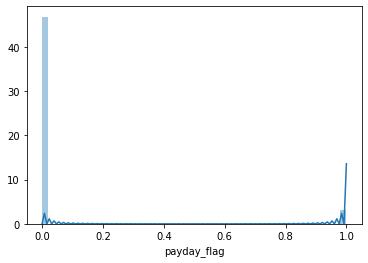

In [101]:
sns.distplot(data['payday_flag'])

### Adding holiday flag to dataset
    holiday_flag will show whether a particular day is holiday/special sale or not. This data has been provided in seperate text file which we will import to us.
    Holiday flag helps us determine whether a particular sale was done on holiday

In [102]:
holiday_dates = pd.read_csv('List of Holiday.txt', sep=',', header = None).T

In [103]:
holiday_dates.rename(columns = {0 : 'Holiday'}, inplace = True)

In [104]:
holiday_dates['Holiday'] = pd.to_datetime(holiday_dates['Holiday'])

In [105]:
holiday_dates

,Holiday
0,2015-07-18
1,2015-07-19
2,2015-08-15
3,2015-08-16
4,2015-08-17
5,2015-08-28
6,2015-08-29
7,2015-08-30
8,2015-10-15
9,2015-10-16


#### Adding holiday flag to our dataset

In [106]:
data['holiday_flag'] = np.where(data['order_date'].dt.date.isin(holiday_dates['Holiday'].dt.date), 1, 0 )

In [107]:
data['holiday_flag'].value_counts()

0    427579
1     85363
Name: holiday_flag, dtype: int64

#### We have 85363 records which corresponds to holiday

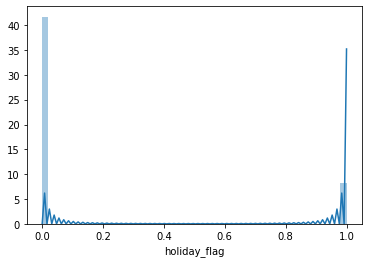

In [108]:
sns.distplot(data['holiday_flag'])

## Data rollup at week level

In [109]:
data.columns

Index(['order_date', 'Year', 'Month', 'Week', 'gmv', 'units', 'list_price',
       'discount%', 'order_payment_type', 'sla',
       'product_analytic_sub_category', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag'],
      dtype='object')

#### How fields are rolled up at week level
    'order_date' - not considered
    'Year' - mode
    'Month' - mode
    'Week' - groupby field
    'gmv' - sum for all days to get total for week
    'units' - sum for all days to get total for week
    'list_price' - mean for all days of week
    'discount%' - mean for all days of week
    'order_payment_type' - mode
    'sla' - mean for the week
    'product_analytic_sub_category' - groupby field, will be used to split dataset into three product sub-categories
    'product_mrp' - mean for the week
    'product_procurement_sla' - mean for the week
    'product_segment' - mode
    'payday_flag' - max for the week, if week has any day as payday it will be 1
    'holiday_flag' - max for the week, if week has any holiday it will be 1

In [110]:
data_week = data.groupby(['Week','product_analytic_sub_category'], as_index=False).agg({'Year' : pd.Series.mode, 'Month' : pd.Series.mode, \
                        'gmv' : 'sum', 'units' : 'sum', 'list_price' : 'mean', 'discount%' : 'mean', \
                        'order_payment_type' : pd.Series.mode, 'sla' : 'mean', 'product_mrp' : 'mean', \
                        'product_procurement_sla' : 'mean', 'product_segment' : pd.Series.mode, \
                        'payday_flag' : 'max', 'holiday_flag' : 'max'})

In [111]:
# checking columns where we took mode
print("Year Column :\n",data_week.Year.value_counts())
print("Month Column :\n",data_week.Month.value_counts())
print("order_payment_type Column :\n",data_week.order_payment_type.value_counts())
print("product_segment Column :\n",data_week.product_segment.value_counts())

Year Column :
 2016    78
2015    77
Name: Year, dtype: int64
Month Column :
 12    15
7     15
6     15
10    14
3     14
9     13
4     13
11    12
5     12
2     12
1     12
8      8
Name: Month, dtype: int64
order_payment_type Column :
 1    134
0     21
Name: order_payment_type, dtype: int64
product_segment Column :
 0         110
1          44
[0, 1]      1
Name: product_segment, dtype: int64


#### We notice issue with mode value in column product_segment, we have tie here hence a value of [0, 1] is updated. We will update this value with 0 considering mass market product segment.

In [112]:
# updating value
data_week.loc[data_week.product_segment.str.len()>1,['product_segment']]=0

In [113]:
# checking value counts of product_segment
data_week.product_segment.value_counts()

0    111
1     44
Name: product_segment, dtype: int64

In [114]:
data_week.head()

,Week,product_analytic_sub_category,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag
0,01,CameraAccessory,2016,1,5077831.0,5404,947.753316,49.228778,1,5.934824,1772.414172,2.881394,0,0,0
1,01,GamingAccessory,2016,1,3437122.0,4542,762.236413,46.901508,1,5.874321,2590.163723,2.675498,0,0,0
2,01,HomeAudio,2016,1,7097928.0,3355,2117.199821,44.578453,1,4.838468,4435.291654,2.867185,1,0,0
3,02,CameraAccessory,2016,1,4372114.0,3897,1134.104396,48.386792,1,6.630822,2037.649398,2.663004,0,1,0
4,02,GamingAccessory,2016,1,3070351.0,4044,765.915504,44.452908,1,5.874397,2331.839635,2.606191,0,1,0


In [115]:
data_week.shape

(155, 15)

In [116]:
data_week.describe()

,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag
count,155.000000,155.000000,1.550000e+02,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000
mean,2015.503226,6.567742,4.186205e+06,3393.567742,1361.006023,42.916900,0.864516,5.860183,2570.899100,2.639498,0.283871,0.432258,0.270968
std,0.501610,3.475367,2.276524e+06,1913.089726,592.697887,8.163194,0.343349,0.945764,951.836407,0.301813,0.452336,0.496996,0.445900
min,2015.000000,1.000000,2.990000e+02,1.000000,299.000000,12.947500,0.000000,2.000000,599.000000,1.000000,0.000000,0.000000,0.000000
25%,2015.000000,4.000000,3.050764e+06,2155.500000,906.731974,37.121602,1.000000,5.553112,1812.999994,2.515601,0.000000,0.000000,0.000000
50%,2016.000000,6.000000,4.006622e+06,3182.000000,1202.932413,43.469701,1.000000,5.874321,2331.839635,2.624675,0.000000,0.000000,0.000000
75%,2016.000000,10.000000,5.076079e+06,4502.000000,2054.392063,47.569497,1.000000,6.294555,3409.313253,2.797370,1.000000,1.000000,1.000000
max,2016.000000,12.000000,1.939041e+07,11487.000000,2809.368421,84.970000,1.000000,10.333333,5126.751858,4.000000,1.000000,1.000000,1.000000


In [117]:
data_week.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155 entries, 0 to 154
Data columns (total 15 columns):
Week                             155 non-null object
product_analytic_sub_category    155 non-null object
Year                             155 non-null int64
Month                            155 non-null int64
gmv                              155 non-null float64
units                            155 non-null int64
list_price                       155 non-null float64
discount%                        155 non-null float64
order_payment_type               155 non-null int64
sla                              155 non-null float64
product_mrp                      155 non-null float64
product_procurement_sla          155 non-null float64
product_segment                  155 non-null int64
payday_flag                      155 non-null int64
holiday_flag                     155 non-null int64
dtypes: float64(6), int64(7), object(2)
memory usage: 19.4+ KB


## Media Investment

In [118]:
Media_Investment_data=pd.read_excel("Media data and other information.xlsx", sheet_name="Media Investment",skiprows=2, header=0,usecols="B:M" )
Media_Investment_data

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,2015.0,12.0,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,NaN,NaN
6,2016.0,1.0,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,2016.0,2.0,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN
8,2016.0,3.0,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,2016.0,4.0,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,NaN,NaN


In [119]:
# Removing NULL rows towards the end
Media_Investment_data = Media_Investment_data[0:12]

In [120]:
# changing datatype of Year and Month
Media_Investment_data['Year'] = Media_Investment_data['Year'].astype('int64')
Media_Investment_data['Month'] = Media_Investment_data['Month'].astype('int64')

In [121]:
Media_Investment_data

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,2015,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,NaN,NaN
6,2016,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,2016,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN
8,2016,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,2016,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,NaN,NaN


### Merging Media Investment data to master dataset

#### Since Total Invenstment is total of all different types of marketing expenditure, hence we won't be merging with master dataset. We want to see individual marketing segments role on revenue.

In [122]:
Media_Investment_data.columns

Index(['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio',
       'Other'],
      dtype='object')

In [123]:
data_week = pd.merge(data_week,Media_Investment_data[['Year', 'Month', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio',
       'Other']], how='left', on=['Year','Month'])

In [124]:
data_week.shape

(155, 24)

In [125]:
data_week.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155 entries, 0 to 154
Data columns (total 24 columns):
Week                             155 non-null object
product_analytic_sub_category    155 non-null object
Year                             155 non-null int64
Month                            155 non-null int64
gmv                              155 non-null float64
units                            155 non-null int64
list_price                       155 non-null float64
discount%                        155 non-null float64
order_payment_type               155 non-null int64
sla                              155 non-null float64
product_mrp                      155 non-null float64
product_procurement_sla          155 non-null float64
product_segment                  155 non-null int64
payday_flag                      155 non-null int64
holiday_flag                     155 non-null int64
TV                               155 non-null float64
Digital                          155 non-null f

In [126]:
# remove space from column name Affiliates
data_week.rename(columns={' Affiliates':'Affiliates'}, inplace = True)

In [127]:
data_week.columns

Index(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'gmv',
       'units', 'list_price', 'discount%', 'order_payment_type', 'sla',
       'product_mrp', 'product_procurement_sla', 'product_segment',
       'payday_flag', 'holiday_flag', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio',
       'Other'],
      dtype='object')

In [128]:
data_week.head()

,Week,product_analytic_sub_category,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,...,holiday_flag,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,01,CameraAccessory,2016,1,5077831.0,5404,947.753316,49.228778,1,5.934824,...,0,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09
1,01,GamingAccessory,2016,1,3437122.0,4542,762.236413,46.901508,1,5.874321,...,0,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09
2,01,HomeAudio,2016,1,7097928.0,3355,2117.199821,44.578453,1,4.838468,...,0,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09
3,02,CameraAccessory,2016,1,4372114.0,3897,1134.104396,48.386792,1,6.630822,...,0,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09
4,02,GamingAccessory,2016,1,3070351.0,4044,765.915504,44.452908,1,5.874397,...,0,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09


## NPS Data

In [129]:
Monthly_NPS_Score_data=pd.read_excel("Media data and other information.xlsx", sheet_name="Monthly NPS Score",skiprows=1,index_col=0, header=0 )
Monthly_NPS_Score_data.head()

,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [130]:
# Transposing dataframe
Monthly_NPS_Score_data = Monthly_NPS_Score_data.T
Monthly_NPS_Score_data['Month_Year'] = Monthly_NPS_Score_data.index
Monthly_NPS_Score_data.reset_index(drop = True, inplace = True)

In [131]:
Monthly_NPS_Score_data

,NPS,Stock Index,Month_Year
0,54.599588,1177.0,July'15
1,59.987101,1206.0,Aug'15
2,46.925419,1101.0,Sept'15
3,44.398389,1210.0,Oct'15
4,47.000000,1233.0,Nov'15
5,45.800000,1038.0,Dec'15
6,47.093031,1052.0,Jan'16
7,50.327406,1222.0,Feb'16
8,49.020550,1015.0,Mar'16
9,51.827605,1242.0,Apr'16


In [132]:
Monthly_NPS_Score_data[['Month','Year']] = Monthly_NPS_Score_data['Month_Year'].str.split('\'',expand=True)

# Dropping Month_Year column since it is not needed
Monthly_NPS_Score_data.drop('Month_Year', axis = 1, inplace = True)

In [133]:
Monthly_NPS_Score_data

,NPS,Stock Index,Month,Year
0,54.599588,1177.0,July,15
1,59.987101,1206.0,Aug,15
2,46.925419,1101.0,Sept,15
3,44.398389,1210.0,Oct,15
4,47.000000,1233.0,Nov,15
5,45.800000,1038.0,Dec,15
6,47.093031,1052.0,Jan,16
7,50.327406,1222.0,Feb,16
8,49.020550,1015.0,Mar,16
9,51.827605,1242.0,Apr,16


In [134]:
# replace 15 with 2015 and 16 with 2016
Monthly_NPS_Score_data['Year'].replace('15','2015', inplace=True)
Monthly_NPS_Score_data['Year'].replace('16','2016', inplace=True)

In [135]:
Monthly_NPS_Score_data

,NPS,Stock Index,Month,Year
0,54.599588,1177.0,July,2015
1,59.987101,1206.0,Aug,2015
2,46.925419,1101.0,Sept,2015
3,44.398389,1210.0,Oct,2015
4,47.000000,1233.0,Nov,2015
5,45.800000,1038.0,Dec,2015
6,47.093031,1052.0,Jan,2016
7,50.327406,1222.0,Feb,2016
8,49.020550,1015.0,Mar,2016
9,51.827605,1242.0,Apr,2016


In [136]:
# updating month to numeric value
Monthly_NPS_Score_data['Month'] = Monthly_NPS_Score_data['Month'].str[0:3]
Monthly_NPS_Score_data['Month'] = pd.to_datetime(Monthly_NPS_Score_data['Month'], format='%b').dt.month

In [137]:
# updating datatypes of Year and Month
Monthly_NPS_Score_data['Year'] = Monthly_NPS_Score_data['Year'].astype('int64')
Monthly_NPS_Score_data['Month'] = Monthly_NPS_Score_data['Month'].astype('int64')

In [138]:
Monthly_NPS_Score_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 4 columns):
NPS            12 non-null float64
Stock Index    12 non-null float64
Month          12 non-null int64
Year           12 non-null int64
dtypes: float64(2), int64(2)
memory usage: 512.0 bytes


In [139]:
Monthly_NPS_Score_data

,NPS,Stock Index,Month,Year
0,54.599588,1177.0,7,2015
1,59.987101,1206.0,8,2015
2,46.925419,1101.0,9,2015
3,44.398389,1210.0,10,2015
4,47.000000,1233.0,11,2015
5,45.800000,1038.0,12,2015
6,47.093031,1052.0,1,2016
7,50.327406,1222.0,2,2016
8,49.020550,1015.0,3,2016
9,51.827605,1242.0,4,2016


### Merging NPS data to master dataset

In [140]:
data_week = pd.merge(data_week,Monthly_NPS_Score_data, how='left', on=['Year','Month'])

In [141]:
data_week.shape

(155, 26)

In [142]:
data_week.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155 entries, 0 to 154
Data columns (total 26 columns):
Week                             155 non-null object
product_analytic_sub_category    155 non-null object
Year                             155 non-null int64
Month                            155 non-null int64
gmv                              155 non-null float64
units                            155 non-null int64
list_price                       155 non-null float64
discount%                        155 non-null float64
order_payment_type               155 non-null int64
sla                              155 non-null float64
product_mrp                      155 non-null float64
product_procurement_sla          155 non-null float64
product_segment                  155 non-null int64
payday_flag                      155 non-null int64
holiday_flag                     155 non-null int64
TV                               155 non-null float64
Digital                          155 non-null f

## Climate Data

In [143]:
# read the data
ontario_2015_data = pd.read_csv("ONTARIO-2015.csv", sep=",", encoding="ISO-8859-1", skiprows=24, header=0)
ontario_2015_data.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (Â°C),Max Temp Flag,Min Temp (Â°C),Min Temp Flag,Mean Temp (Â°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,â,0.0,NaN,-8.5,NaN,-4.3,...,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,â,3.0,NaN,-3.0,NaN,0.0,...,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,â,2.5,NaN,-4.0,NaN,-0.8,...,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,â,2.5,NaN,0.0,NaN,1.3,...,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,â,-10.0,NaN,-13.5,NaN,-11.8,...,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [144]:
# attributes of dataset
print(ontario_2015_data.shape)
print(ontario_2015_data.info())

(365, 27)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
Date/Time                    365 non-null object
Year                         365 non-null int64
Month                        365 non-null int64
Day                          365 non-null int64
Data Quality                 229 non-null object
Max Temp (Â°C)               216 non-null float64
Max Temp Flag                13 non-null object
Min Temp (Â°C)               190 non-null float64
Min Temp Flag                39 non-null object
Mean Temp (Â°C)              190 non-null float64
Mean Temp Flag               39 non-null object
Heat Deg Days (Â°C)          190 non-null float64
Heat Deg Days Flag           39 non-null object
Cool Deg Days (Â°C)          190 non-null float64
Cool Deg Days Flag           39 non-null object
Total Rain (mm)              229 non-null float64
Total Rain Flag              7 non-null object
Total Snow (cm)              229 non-null float64
Total 

In [145]:
#FIltering columns with more than 70% null values
col_null_2015 = ontario_2015_data.loc[:,list(((ontario_2015_data.isnull().sum()/len(ontario_2015_data)*100).round(2)>70))].columns
col_null_2015

Index(['Max Temp Flag', 'Min Temp Flag', 'Mean Temp Flag',
       'Heat Deg Days Flag', 'Cool Deg Days Flag', 'Total Rain Flag',
       'Total Snow Flag', 'Total Precip Flag', 'Snow on Grnd Flag',
       'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag',
       'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'],
      dtype='object')

#### Since these fields have more than 70% NULL records,  these do not add value to the dataset and should be dropped.

In [146]:
ontario_2015_data.drop(col_null_2015,axis=1, inplace=True)

In [147]:
print(ontario_2015_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 14 columns):
Date/Time              365 non-null object
Year                   365 non-null int64
Month                  365 non-null int64
Day                    365 non-null int64
Data Quality           229 non-null object
Max Temp (Â°C)         216 non-null float64
Min Temp (Â°C)         190 non-null float64
Mean Temp (Â°C)        190 non-null float64
Heat Deg Days (Â°C)    190 non-null float64
Cool Deg Days (Â°C)    190 non-null float64
Total Rain (mm)        229 non-null float64
Total Snow (cm)        229 non-null float64
Total Precip (mm)      229 non-null float64
Snow on Grnd (cm)      229 non-null float64
dtypes: float64(9), int64(3), object(2)
memory usage: 40.0+ KB
None


In [148]:
ontario_2015_data['Date/Time'] = pd.to_datetime(ontario_2015_data['Date/Time'])

In [149]:
ontario_2015_data['Date/Time'].describe()

count                     365
unique                    365
top       2015-07-19 00:00:00
freq                        1
first     2015-01-01 00:00:00
last      2015-12-31 00:00:00
Name: Date/Time, dtype: object

In [150]:
#Filtering only relevant data
ontario_2015_data = ontario_2015_data[(ontario_2015_data['Date/Time']>'2015-06-30')]

In [151]:
ontario_2015_data.describe()

,Year,Month,Day,Max Temp (Â°C),Min Temp (Â°C),Mean Temp (Â°C),Heat Deg Days (Â°C),Cool Deg Days (Â°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,184.0,184.000000,184.000000,109.000000,98.000000,98.000000,98.000000,98.000000,115.000000,115.000000,115.000000,115.000000
mean,2015.0,9.494565,15.836957,22.087156,12.571429,17.627551,2.963265,2.590816,2.560870,0.086957,2.647826,0.060870
std,0.0,1.717786,8.878386,8.193223,6.683570,7.037847,5.034446,2.944962,7.198217,0.932505,7.246746,0.652753
min,2015.0,7.000000,1.000000,1.500000,-5.000000,-1.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2015.0,8.000000,8.000000,16.000000,10.000000,14.075000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2015.0,9.500000,16.000000,24.000000,14.000000,19.250000,0.000000,1.250000,0.000000,0.000000,0.000000,0.000000
75%,2015.0,11.000000,23.250000,29.000000,18.000000,23.225000,3.925000,5.225000,1.300000,0.000000,1.300000,0.000000
max,2015.0,12.000000,31.000000,33.500000,22.000000,27.300000,19.300000,9.300000,57.200000,10.000000,57.200000,7.000000


In [152]:
# read the data
ontario_2016_data = pd.read_csv("ONTARIO-2016.csv", sep=",", encoding="ISO-8859-1", skiprows=24, header=0)
ontario_2016_data.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (Â°C),Max Temp Flag,Min Temp (Â°C),Min Temp Flag,Mean Temp (Â°C),...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [153]:
# attributes of dataset
print(ontario_2016_data.shape)
print(ontario_2016_data.info())

(366, 27)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
Date/Time                    366 non-null object
Year                         366 non-null int64
Month                        366 non-null int64
Day                          366 non-null int64
Data Quality                 227 non-null object
Max Temp (Â°C)               226 non-null float64
Max Temp Flag                1 non-null object
Min Temp (Â°C)               219 non-null float64
Min Temp Flag                8 non-null object
Mean Temp (Â°C)              219 non-null float64
Mean Temp Flag               8 non-null object
Heat Deg Days (Â°C)          219 non-null float64
Heat Deg Days Flag           8 non-null object
Cool Deg Days (Â°C)          219 non-null float64
Cool Deg Days Flag           8 non-null object
Total Rain (mm)              227 non-null float64
Total Rain Flag              3 non-null object
Total Snow (cm)              227 non-null float64
Total Snow 

In [154]:
#FIltering columns with more than 70% null values
col_null_2016 = ontario_2016_data.loc[:,list(((ontario_2016_data.isnull().sum()/len(ontario_2016_data)*100).round(2)>70))].columns
col_null_2016

Index(['Max Temp Flag', 'Min Temp Flag', 'Mean Temp Flag',
       'Heat Deg Days Flag', 'Cool Deg Days Flag', 'Total Rain Flag',
       'Total Snow Flag', 'Total Precip Flag', 'Snow on Grnd Flag',
       'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag',
       'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'],
      dtype='object')

#### Since these fields have more than 70% NULL records,  these do not add value to the dataset and should be dropped.

In [155]:
ontario_2016_data.drop(col_null_2016,axis=1, inplace=True)

In [156]:
print(ontario_2016_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 14 columns):
Date/Time              366 non-null object
Year                   366 non-null int64
Month                  366 non-null int64
Day                    366 non-null int64
Data Quality           227 non-null object
Max Temp (Â°C)         226 non-null float64
Min Temp (Â°C)         219 non-null float64
Mean Temp (Â°C)        219 non-null float64
Heat Deg Days (Â°C)    219 non-null float64
Cool Deg Days (Â°C)    219 non-null float64
Total Rain (mm)        227 non-null float64
Total Snow (cm)        227 non-null float64
Total Precip (mm)      227 non-null float64
Snow on Grnd (cm)      227 non-null float64
dtypes: float64(9), int64(3), object(2)
memory usage: 40.2+ KB
None


In [157]:
ontario_2016_data['Date/Time'] = pd.to_datetime(ontario_2016_data['Date/Time'])

In [158]:
ontario_2016_data['Date/Time'].describe()

count                     366
unique                    366
top       2016-09-08 00:00:00
freq                        1
first     2016-01-01 00:00:00
last      2016-12-31 00:00:00
Name: Date/Time, dtype: object

In [159]:
#Filtering only relevant data
ontario_2016_data = ontario_2016_data[(ontario_2016_data['Date/Time']<'2016-07-01')]

In [160]:
ontario_2016_data.describe()

,Year,Month,Day,Max Temp (Â°C),Min Temp (Â°C),Mean Temp (Â°C),Heat Deg Days (Â°C),Cool Deg Days (Â°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,182.0,182.000000,182.000000,99.000000,93.000000,93.000000,93.000000,93.000000,100.000000,100.000000,100.000000,100.000000
mean,2016.0,3.500000,15.675824,15.974747,4.612903,10.673118,8.608602,1.281720,2.610000,0.340000,2.950000,0.550000
std,0.0,1.713611,8.791594,10.554372,8.857608,9.370759,7.693838,2.511666,6.075975,1.317021,6.343588,2.056647
min,2016.0,1.000000,1.000000,-8.500000,-18.000000,-12.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2016.0,2.000000,8.000000,8.500000,-2.000000,4.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2016.0,3.500000,16.000000,15.000000,5.000000,10.800000,7.200000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2016.0,5.000000,23.000000,25.000000,11.000000,18.300000,13.700000,0.300000,1.550000,0.000000,3.200000,0.000000
max,2016.0,6.000000,31.000000,35.000000,20.500000,27.500000,30.300000,9.500000,32.600000,7.000000,32.600000,12.000000


In [161]:
print(ontario_2015_data.columns)
print(ontario_2016_data.columns)

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (Â°C)',
       'Min Temp (Â°C)', 'Mean Temp (Â°C)', 'Heat Deg Days (Â°C)',
       'Cool Deg Days (Â°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')
Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (Â°C)',
       'Min Temp (Â°C)', 'Mean Temp (Â°C)', 'Heat Deg Days (Â°C)',
       'Cool Deg Days (Â°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


In [162]:
if (ontario_2015_data.columns[0] == ontario_2016_data.columns[0]) :
    print("We will merge both the data")
else:
    print("We will have to manually check")

We will merge both the data


In [163]:
ontario_climate = pd.concat([ontario_2015_data, ontario_2016_data])

In [164]:
ontario_climate

,Date/Time,Year,Month,Day,Data Quality,Max Temp (Â°C),Min Temp (Â°C),Mean Temp (Â°C),Heat Deg Days (Â°C),Cool Deg Days (Â°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
181,2015-07-01,2015,7,1,â,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0
182,2015-07-02,2015,7,2,â,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0
183,2015-07-03,2015,7,3,â,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0
184,2015-07-04,2015,7,4,â,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0
185,2015-07-05,2015,7,5,â,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,2016-06-26,2016,6,26,â,34.0,18.5,26.3,0.0,8.3,3.2,0.0,3.2,0.0
178,2016-06-27,2016,6,27,â,34.5,20.0,27.3,0.0,9.3,0.0,0.0,0.0,0.0
179,2016-06-28,2016,6,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180,2016-06-29,2016,6,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [165]:
# cleansing column names
ontario_climate.rename(columns={'Max Temp (Â°C)':'Max Temp', 'Min Temp (Â°C)':'Min Temp', 'Mean Temp (Â°C)':'Mean Temp',
                                'Heat Deg Days (Â°C)':'Heat Deg Days', 'Cool Deg Days (Â°C)':'Cool Deg Days'}, inplace = True)

In [166]:
ontario_climate

,Date/Time,Year,Month,Day,Data Quality,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
181,2015-07-01,2015,7,1,â,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0
182,2015-07-02,2015,7,2,â,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0
183,2015-07-03,2015,7,3,â,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0
184,2015-07-04,2015,7,4,â,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0
185,2015-07-05,2015,7,5,â,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,2016-06-26,2016,6,26,â,34.0,18.5,26.3,0.0,8.3,3.2,0.0,3.2,0.0
178,2016-06-27,2016,6,27,â,34.5,20.0,27.3,0.0,9.3,0.0,0.0,0.0,0.0
179,2016-06-28,2016,6,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180,2016-06-29,2016,6,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Data Quality column does not resonate with rest of the data and can be dropped

In [167]:
ontario_climate.drop('Data Quality', axis=1, inplace = True)

In [168]:
ontario_climate.shape

(366, 13)

#### Duplicate record check in climate data

In [169]:
ontario_climate.duplicated().sum()

0

#### No duplicate records found
#### Adding week column in climate data

In [170]:
# For consistency we will add this column after month, for that first we need to find index of month column
month_ix = ontario_climate.columns.get_loc('Month') + 1
ontario_climate.insert(loc = month_ix, column = 'Week', value = ontario_climate['Date/Time'].dt.strftime("%V"))
ontario_climate.head()

,Date/Time,Year,Month,Week,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
181,2015-07-01,2015,7,27,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0
182,2015-07-02,2015,7,27,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0
183,2015-07-03,2015,7,27,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0
184,2015-07-04,2015,7,27,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0
185,2015-07-05,2015,7,27,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0


#### Rolling up data to week level
#### as part of this we won't be considering 'Date/Time' and 'Day', will be taking mode of 'Year' and 'Month' and mean of rest of the columns

In [171]:
ontario_climate.columns

Index(['Date/Time', 'Year', 'Month', 'Week', 'Day', 'Max Temp', 'Min Temp',
       'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)',
       'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

In [172]:
climate_week = ontario_climate.groupby(['Week'], as_index=False).agg({'Year' : pd.Series.mode, 'Month' : pd.Series.mode, \
                        'Max Temp' : 'mean', 'Min Temp' : 'mean', 'Mean Temp' : 'mean', \
                        'Heat Deg Days' : 'mean', 'Cool Deg Days' : 'mean', 'Total Rain (mm)' : 'mean', \
                        'Total Snow (cm)' : 'mean', 'Total Precip (mm)' : 'mean', 'Snow on Grnd (cm)' : 'mean'})

In [173]:
climate_week.head()

,Week,Year,Month,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,01,2016,1,5.500000,-5.333333,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
1,02,2016,1,0.666667,-8.166667,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333
2,03,2016,1,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000
3,04,2016,1,5.750000,-9.000000,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000
4,05,2016,2,8.125000,-1.666667,3.200000,14.800000,0.0,2.650000,0.000000,2.650000,0.000000


In [174]:
climate_week.shape

(53, 12)

In [175]:
climate_week.describe()

,Year,Month,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,53.000000,53.000000,53.000000,52.000000,52.000000,52.000000,52.000000,53.000000,53.000000,53.000000,53.000000
mean,2015.490566,6.603774,17.452516,7.077679,12.529835,7.055037,1.584872,2.599344,0.251752,2.851096,0.385220
std,0.504695,3.471530,9.656809,8.559434,8.869965,7.163412,2.268594,3.225234,0.735189,3.500945,1.523869
min,2015.000000,1.000000,-2.833333,-11.666667,-7.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2015.000000,4.000000,8.500000,0.525000,5.986250,0.075000,0.000000,0.280000,0.000000,0.300000,0.000000
50%,2015.000000,7.000000,17.600000,6.100000,12.512500,5.487500,0.000000,1.100000,0.000000,1.720000,0.000000
75%,2016.000000,10.000000,26.000000,15.416667,20.587500,12.013750,3.066667,4.200000,0.000000,4.250000,0.000000
max,2016.000000,12.000000,32.250000,18.700000,24.566667,25.266667,6.566667,12.800000,3.000000,15.700000,10.333333


### Merging climate data with main dataset

In [176]:
data_week = pd.merge(data_week,climate_week[['Week','Max Temp', 'Min Temp', 'Mean Temp','Heat Deg Days', 
                                            'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
                                             'Total Precip (mm)', 'Snow on Grnd (cm)']], how='left', on='Week')

In [177]:
data_week.head()

,Week,product_analytic_sub_category,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,01,CameraAccessory,2016,1,5077831.0,5404,947.753316,49.228778,1,5.934824,...,1052.0,5.500000,-5.333333,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
1,01,GamingAccessory,2016,1,3437122.0,4542,762.236413,46.901508,1,5.874321,...,1052.0,5.500000,-5.333333,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
2,01,HomeAudio,2016,1,7097928.0,3355,2117.199821,44.578453,1,4.838468,...,1052.0,5.500000,-5.333333,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
3,02,CameraAccessory,2016,1,4372114.0,3897,1134.104396,48.386792,1,6.630822,...,1052.0,0.666667,-8.166667,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333
4,02,GamingAccessory,2016,1,3070351.0,4044,765.915504,44.452908,1,5.874397,...,1052.0,0.666667,-8.166667,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333


In [178]:
data_week.shape

(155, 35)

In [179]:
data_week.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155 entries, 0 to 154
Data columns (total 35 columns):
Week                             155 non-null object
product_analytic_sub_category    155 non-null object
Year                             155 non-null int64
Month                            155 non-null int64
gmv                              155 non-null float64
units                            155 non-null int64
list_price                       155 non-null float64
discount%                        155 non-null float64
order_payment_type               155 non-null int64
sla                              155 non-null float64
product_mrp                      155 non-null float64
product_procurement_sla          155 non-null float64
product_segment                  155 non-null int64
payday_flag                      155 non-null int64
holiday_flag                     155 non-null int64
TV                               155 non-null float64
Digital                          155 non-null f

In [180]:
data_week.describe()

,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,155.000000,155.000000,1.550000e+02,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,...,155.000000,155.000000,152.000000,152.000000,152.000000,152.000000,155.000000,155.000000,155.000000,155.000000
mean,2015.503226,6.567742,4.186205e+06,3393.567742,1361.006023,42.916900,0.864516,5.860183,2570.899100,2.639498,...,1156.206452,17.190269,6.792990,12.260226,7.235761,1.495987,2.581478,0.258249,2.839727,0.395161
std,0.501610,3.475367,2.276524e+06,1913.089726,592.697887,8.163194,0.343349,0.945764,951.836407,0.301813,...,81.670044,9.570482,8.428237,8.763977,7.121033,2.206675,3.226307,0.738806,3.506454,1.532443
min,2015.000000,1.000000,2.990000e+02,1.000000,299.000000,12.947500,0.000000,2.000000,599.000000,1.000000,...,1015.000000,-2.833333,-11.666667,-7.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2015.000000,4.000000,3.050764e+06,2155.500000,906.731974,37.121602,1.000000,5.553112,1812.999994,2.515601,...,1052.000000,8.375000,-1.200000,5.720000,0.100000,0.000000,0.280000,0.000000,0.300000,0.000000
50%,2016.000000,6.000000,4.006622e+06,3182.000000,1202.932413,43.469701,1.000000,5.874321,2331.839635,2.624675,...,1194.000000,17.250000,6.000000,12.400000,5.600000,0.000000,1.100000,0.000000,1.720000,0.000000
75%,2016.000000,10.000000,5.076079e+06,4502.000000,2054.392063,47.569497,1.000000,6.294555,3409.313253,2.797370,...,1222.000000,25.750000,15.008333,20.550000,12.280000,2.662500,4.200000,0.000000,4.250000,0.000000
max,2016.000000,12.000000,1.939041e+07,11487.000000,2809.368421,84.970000,1.000000,10.333333,5126.751858,4.000000,...,1242.000000,32.250000,18.700000,24.566667,25.266667,6.566667,12.800000,3.000000,15.700000,10.333333


In [181]:
# sorting data_week by year and month
data_week = data_week.sort_values(['Year','Month'])

In [182]:
data_week.head()

,Week,product_analytic_sub_category,Year,Month,gmv,units,list_price,discount%,order_payment_type,sla,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
78,27,CameraAccessory,2015,7,15731.0,26,605.038462,50.620769,0,2.230769,...,1177.0,25.500000,13.200000,19.36,0.100000,1.460000,0.000000,0.0,0.000000,0.0
79,27,GamingAccessory,2015,7,37887.0,30,1262.900000,27.514667,0,2.933333,...,1177.0,25.500000,13.200000,19.36,0.100000,1.460000,0.000000,0.0,0.000000,0.0
80,27,HomeAudio,2015,7,106756.0,38,2809.368421,35.559474,0,2.789474,...,1177.0,25.500000,13.200000,19.36,0.100000,1.460000,0.000000,0.0,0.000000,0.0
81,28,CameraAccessory,2015,7,3975505.0,2996,1369.572775,43.971082,1,7.067365,...,1177.0,24.833333,15.333333,20.10,0.283333,2.383333,4.416667,0.0,4.416667,0.0
82,28,GamingAccessory,2015,7,2688958.0,3032,898.804031,40.174910,1,5.460737,...,1177.0,24.833333,15.333333,20.10,0.283333,2.383333,4.416667,0.0,4.416667,0.0


## EDA

### Analysis of GMV, list_price, discount%, product_mrp

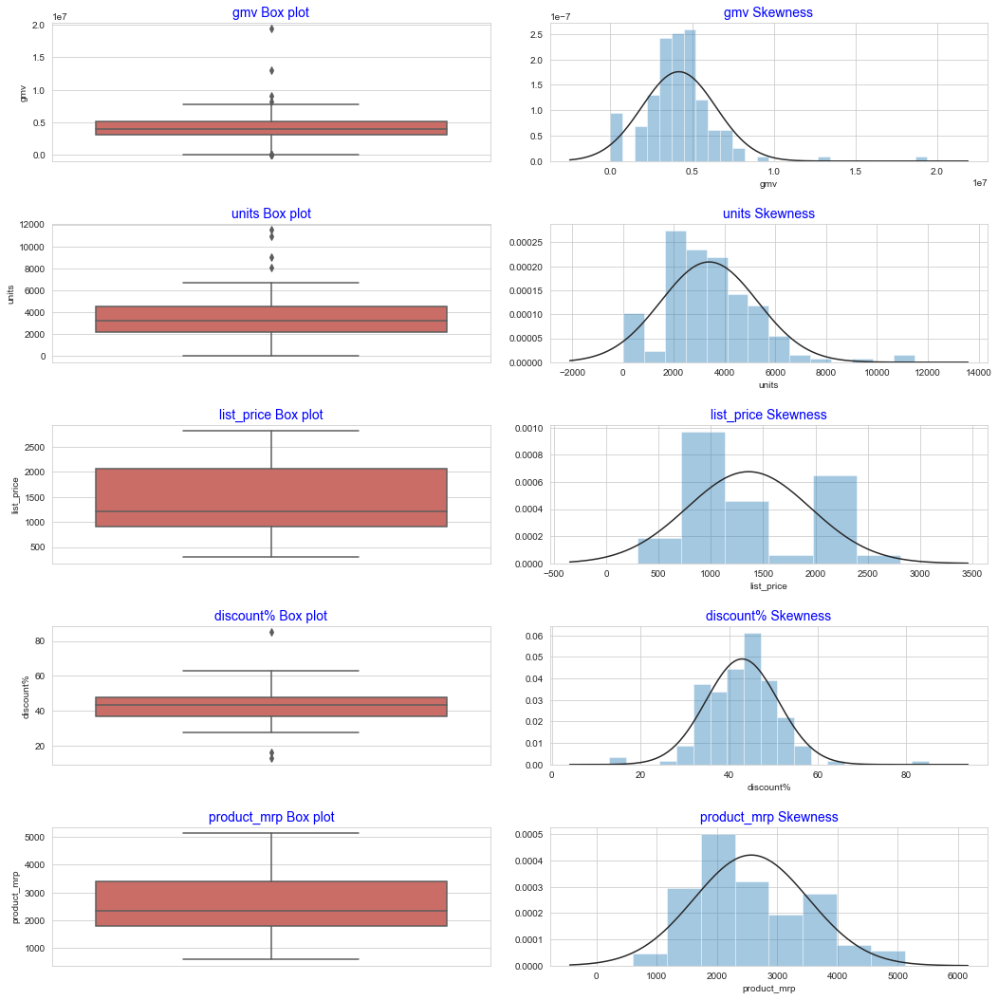

In [183]:
from scipy import stats
plot_col = ['gmv','units','list_price','discount%','product_mrp']

plt.figure(figsize=(15,15))
cnt = 1
sns.set_style("whitegrid")
for col in plot_col:
    ax = plt.subplot(5,2,cnt)
    cnt+= 1
    sns.boxplot(y = col,palette = 'hls', data = data_week)
    ax.set_title(col + ' Box plot', fontsize=14, color='b')
    ax = plt.subplot(5,2,cnt)
    cnt+= 1
    sns.distplot(data_week[col], fit=stats.norm, kde=False)
    ax.set_title(col + ' Skewness', fontsize=14, color='b')
plt.tight_layout(pad = 2.0)
plt.show()

#### We notice couple of outliers with gmv and discount%, lets us deep dive to explore these in detail

In [184]:
# checking spread of data
round(data_week[['gmv','units','list_price','discount%','product_mrp']].describe(percentiles=[.25,.5,.75,.8,.85,.9,.95,.99]),2)

,gmv,units,list_price,discount%,product_mrp
count,155.00,155.00,155.00,155.00,155.00
mean,4186205.39,3393.57,1361.01,42.92,2570.90
std,2276524.40,1913.09,592.70,8.16,951.84
min,299.00,1.00,299.00,12.95,599.00
25%,3050763.50,2155.50,906.73,37.12,1813.00
50%,4006622.00,3182.00,1202.93,43.47,2331.84
75%,5076078.50,4502.00,2054.39,47.57,3409.31
80%,5361297.80,4775.20,2097.38,48.39,3498.92
85%,5750547.83,5312.20,2123.48,50.08,3668.73
90%,6439965.00,5640.60,2166.01,52.60,3894.70


In [185]:
# checking skewness of data
data_week[['gmv','units','list_price','discount%','product_mrp']].skew()

gmv            2.108251
units          0.957222
list_price     0.436333
discount%      0.433285
product_mrp    0.518046
dtype: float64

### Observation
    We notice outliers in gmv, units and discount% which can be attributed to normal sales. Some orders might shoot in high item quantity. Discount% can be due to sales or special promotions. List_price and product_mrp shows usual trend.
    In terms of skewness all fields are positively skewed.

### Analysis of sla, product_procurement_sla

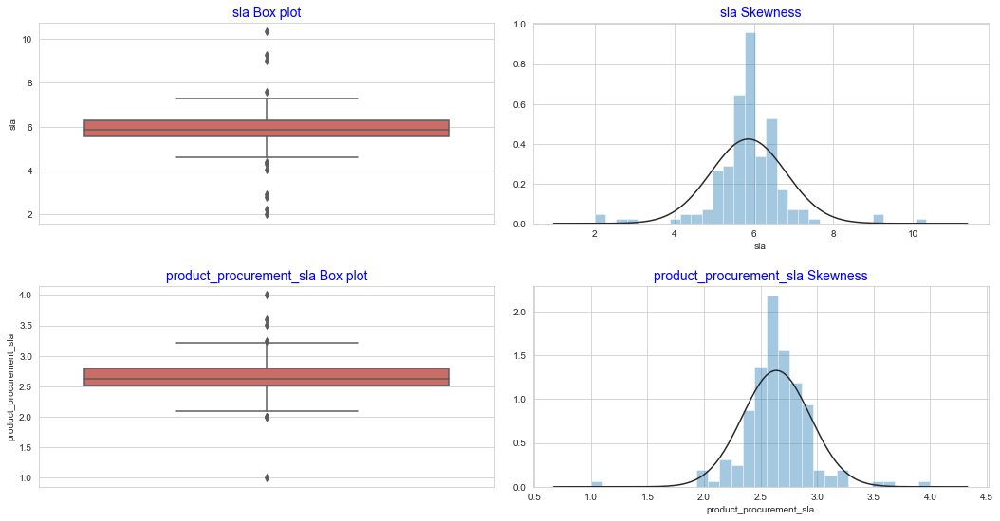

In [186]:
plot_col = ['sla','product_procurement_sla']

plt.figure(figsize=(15,8))
cnt = 1
sns.set_style("whitegrid")
for col in plot_col:
    ax = plt.subplot(2,2,cnt)
    cnt+= 1
    sns.boxplot(y = col,palette = 'hls', data = data_week)
    ax.set_title(col + ' Box plot', fontsize=14, color='b')
    ax = plt.subplot(2,2,cnt)
    cnt+= 1
    sns.distplot(data_week[col], fit=stats.norm, kde=False)
    ax.set_title(col + ' Skewness', fontsize=14, color='b')
plt.tight_layout(pad = 2.0)
plt.show()

#### We notice great number of outliers in sla and product_procurement_sla, let us analyse in detail

In [187]:
round(data_week[['sla','product_procurement_sla']].describe(percentiles=[.25,.5,.75,.8,.85,.9,.95,.99]),2)

,sla,product_procurement_sla
count,155.00,155.00
mean,5.86,2.64
std,0.95,0.30
min,2.00,1.00
25%,5.55,2.52
50%,5.87,2.62
75%,6.29,2.80
80%,6.38,2.82
85%,6.45,2.87
90%,6.59,2.90


In [188]:
# checking skewness of data
data_week[['sla','product_procurement_sla']].skew()

sla                       -0.001442
product_procurement_sla   -0.213536
dtype: float64

### Observation
    Outliers are found in dataset but still it looks to be homogenous, mean and median values conincide. For this analysis we can proceed with dataset as it is.
    Both fields are slightly negatively skewed

### Spread of Gross Merchandise Value (GMV) over weeks

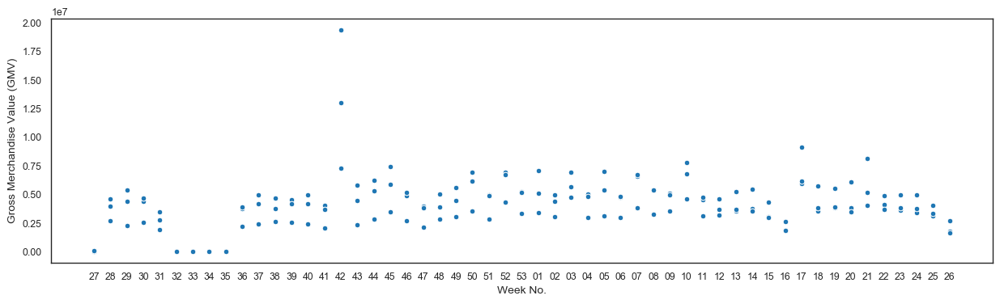

In [189]:
# creating scatter plot to see spread of GMV over weeeks
plt.figure(figsize=(15, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")

sns.scatterplot(x="Week", y="gmv", data = data_week)

plt.xlabel('Week No.', fontsize=10);
plt.ylabel('Gross Merchandise Value (GMV)', fontsize=10);

plt.show()

#### Observation
    We can notice revenue is more or less evenly distributed across weeks, with some peak in week 42

### Trend of various marketing investment over week

In [190]:
data_week.columns

Index(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'gmv',
       'units', 'list_price', 'discount%', 'order_payment_type', 'sla',
       'product_mrp', 'product_procurement_sla', 'product_segment',
       'payday_flag', 'holiday_flag', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio',
       'Other', 'NPS', 'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp',
       'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

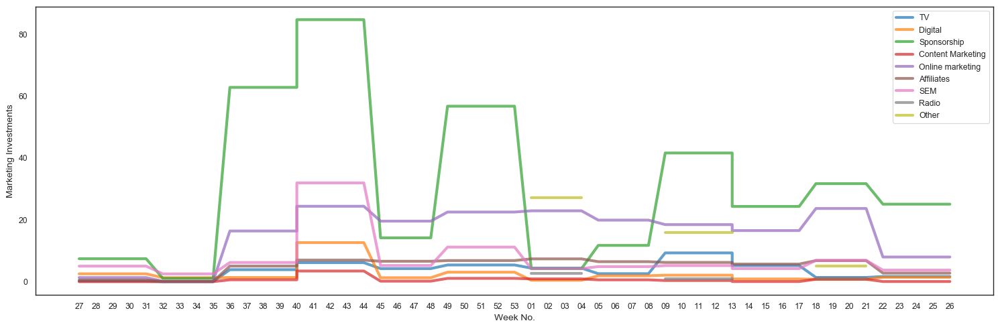

In [191]:
plt.figure(figsize=(15, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")

plt.plot(data_week['Week'], data_week[['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       'Affiliates', 'SEM', 'Radio', 'Other']], linewidth=3, alpha = 0.7)
plt.xlabel('Week No.', fontsize=10)
plt.ylabel('Marketing Investments', fontsize=10)
plt.legend(data_week[['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       'Affiliates', 'SEM', 'Radio', 'Other']])
ax.set_title('All products Trend Line', fontsize=12)

plt.tight_layout()

plt.show()

#### Observation
    

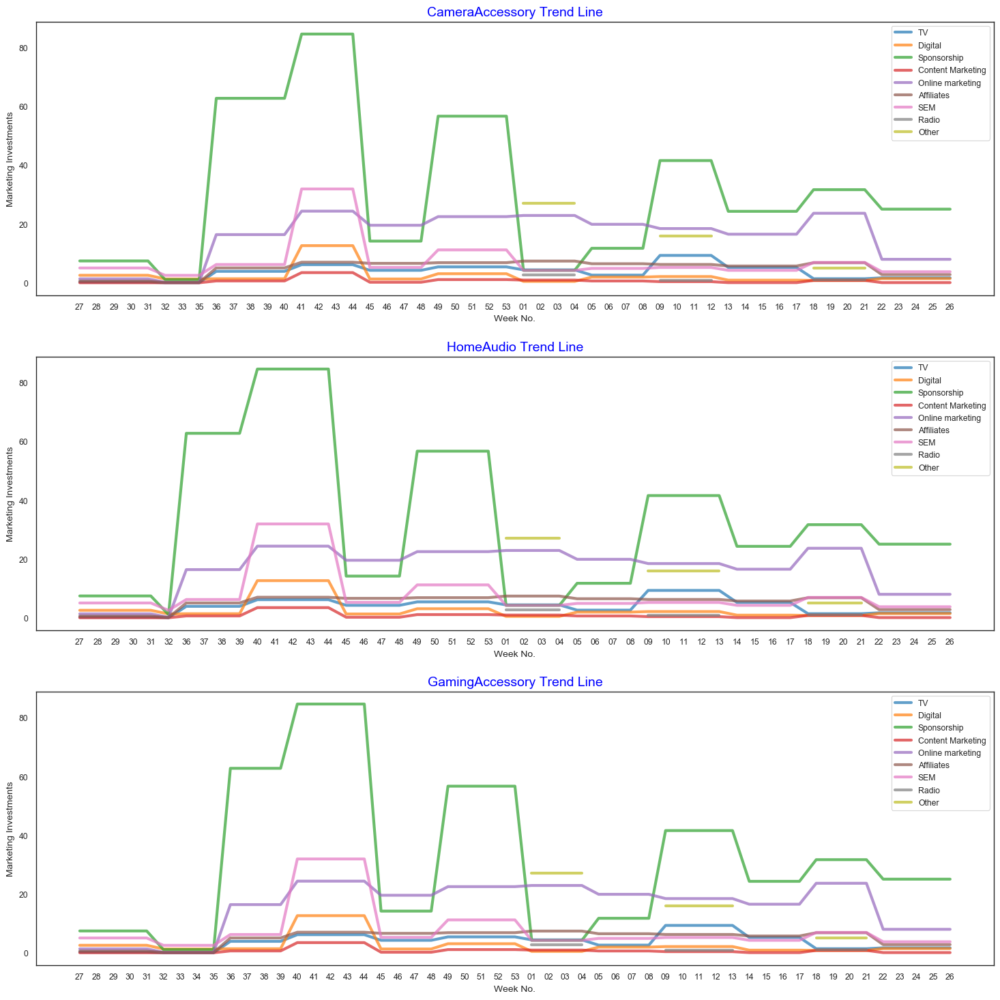

In [192]:
plot_col = ['CameraAccessory','HomeAudio','GamingAccessory']

plt.figure(figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")

cnt = 1
for col in plot_col:
    ax = plt.subplot(3,1,cnt)
    cnt+= 1
    
    data_plot = data_week[data_week['product_analytic_sub_category'] == col]

    plt.plot(data_plot['Week'], data_plot[['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
           'Affiliates', 'SEM', 'Radio', 'Other']], linewidth=3, alpha = 0.7)
    plt.xlabel('Week No.', fontsize=10)
    plt.ylabel('Marketing Investments', fontsize=10)
    ax.set_title(col + ' Trend Line', fontsize=14, color='b')
    plt.legend(data_week[['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
           'Affiliates', 'SEM', 'Radio', 'Other']])

plt.tight_layout(pad = 2.0)

plt.show()

### Luxury and Mass Market - spread of GMV, Discount%

In [193]:
data_week.columns

Index(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'gmv',
       'units', 'list_price', 'discount%', 'order_payment_type', 'sla',
       'product_mrp', 'product_procurement_sla', 'product_segment',
       'payday_flag', 'holiday_flag', 'TV', 'Digital', 'Sponsorship',
       'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio',
       'Other', 'NPS', 'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp',
       'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

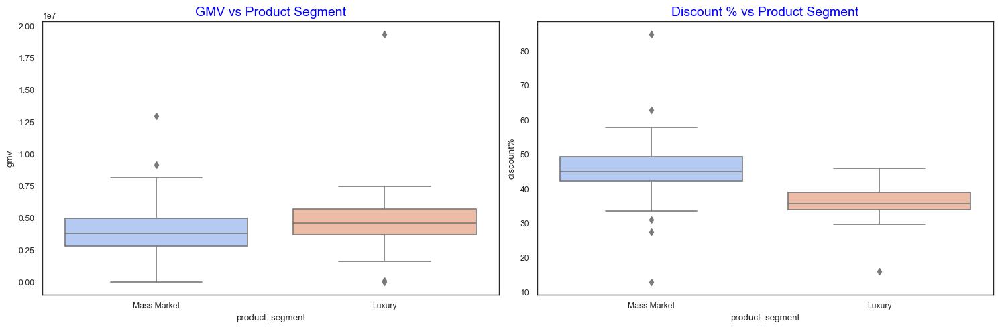

In [194]:
plt.figure(figsize=(15, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")

ax = plt.subplot(1,2,1)
sns.boxplot(x = 'product_segment', y = 'gmv', palette = 'coolwarm', data = data_week)
plt.xticks([0,1],["Mass Market", "Luxury"])
plt.title("GMV vs Product Segment", fontsize=14, color='b')

ax = plt.subplot(1,2,2)
sns.boxplot(x = 'product_segment', y = 'discount%', palette = 'coolwarm', data = data_week)
plt.xticks([0,1],["Mass Market", "Luxury"])
plt.title("Discount % vs Product Segment", fontsize=14, color='b')

plt.tight_layout()

plt.show()

#### The above graph shows the distribution of GMV and Discount% for Mass Market and Luxury Product segmentation.

In [195]:
# Validating the data type and values of column order_payment_type
data_week.order_payment_type.value_counts()

1    134
0     21
Name: order_payment_type, dtype: int64

In [196]:
## Validating the data type and values of column product_analytic_sub_category
data_week.product_analytic_sub_category.value_counts()

GamingAccessory    53
CameraAccessory    52
HomeAudio          50
Name: product_analytic_sub_category, dtype: int64

<Figure size 1500x1000 with 0 Axes>

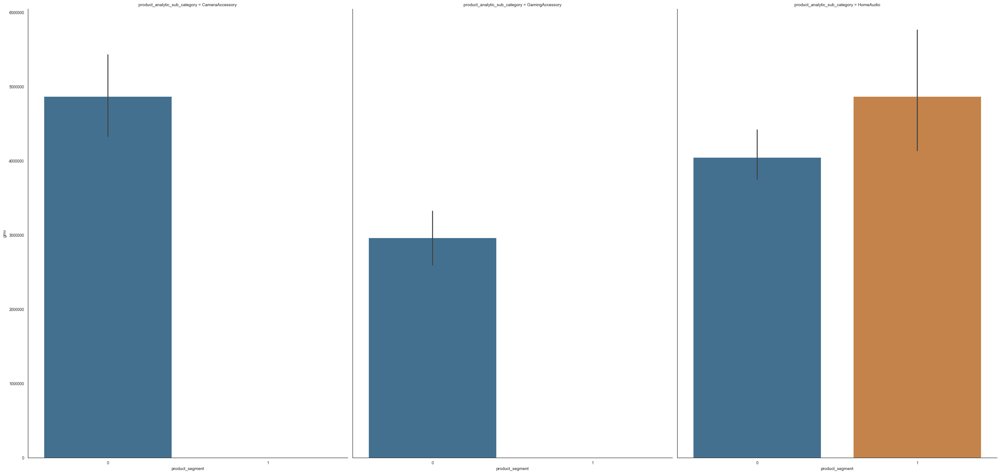

In [197]:
### Plot - revenue for different product segment for all three sub-products by grouping product sub category
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",col="product_segment",data=data_week)
sns.catplot(y="gmv",x="product_segment", col="product_analytic_sub_category",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7,saturation=.5 )

#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Most of the records in 'Home Audio' sub category are in Luxury product segment.

<Figure size 1500x1000 with 0 Axes>

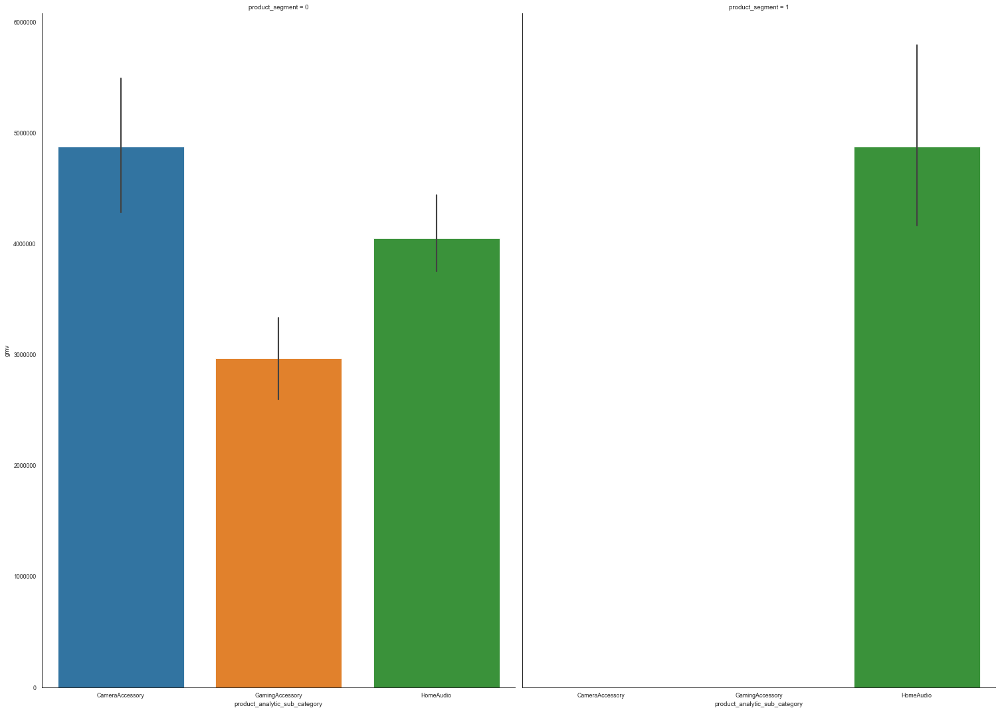

In [198]:
### Plot - revenue for different product segment for all three sub-products by grouping product segment
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",col="product_segment",data=data_week)
sns.catplot(y="gmv", x="product_analytic_sub_category",col="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Plot - revenue for different product segment for all three sub-products by grouping product segment

<Figure size 1500x1000 with 0 Axes>

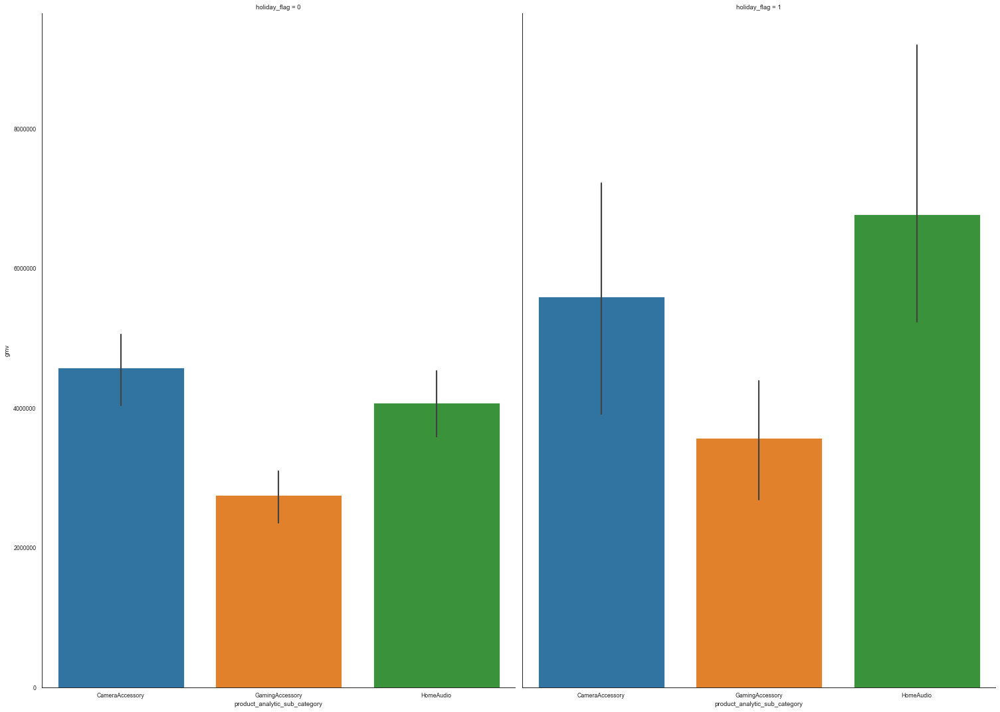

In [199]:
### Plot - revenue for all three sub-products category grouped by Holiday Sale
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.catplot(y="gmv", x="product_analytic_sub_category",col="holiday_flag",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### There is clear increase in revenue on Holiday vs rest of the days for all of the sub-categories. 
#### Home audio is showing Maximum difference between Holiday and non-holiday sale.

<Figure size 1500x1000 with 0 Axes>

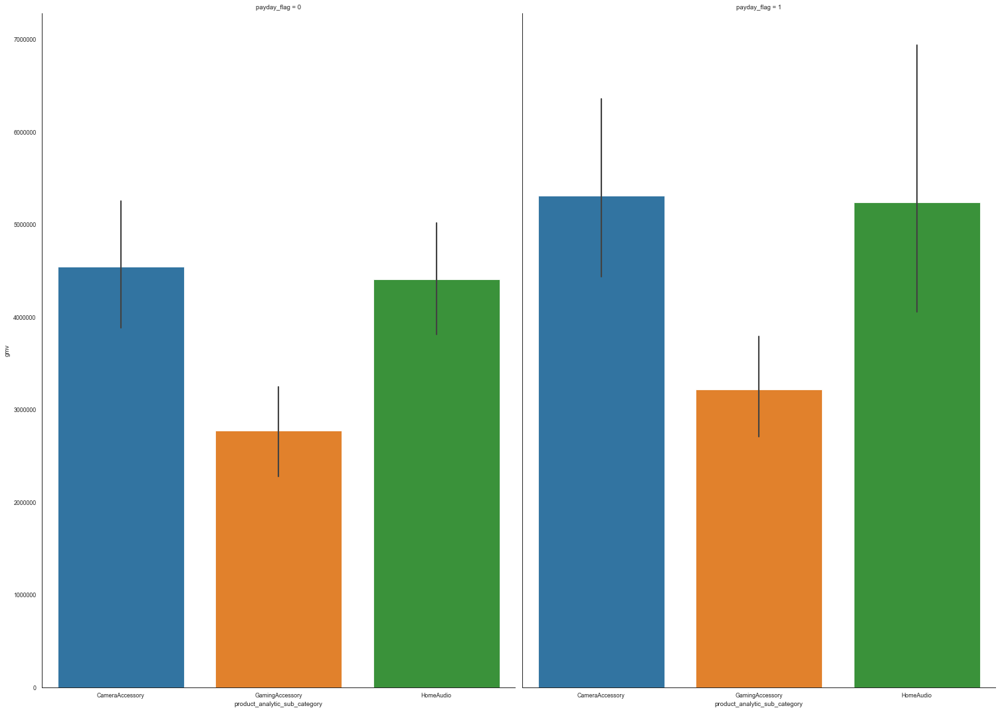

In [200]:
### Plot - revenue vs Pay day for all three sub-products
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.catplot(y="gmv", x="product_analytic_sub_category",col="payday_flag",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### There is slight increase in revenue on Pay-day for all of the sub-categories. 
#### All three sub-categories show similar growth of revenue on a pay day.

<Figure size 1500x1000 with 0 Axes>

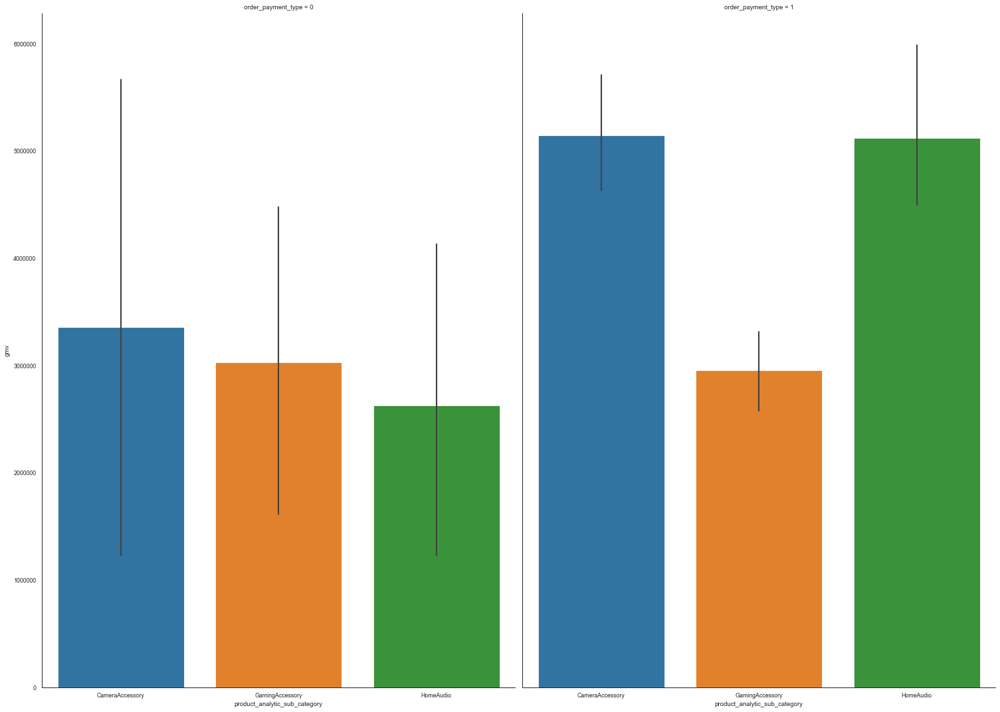

In [201]:
### Plot - revenue vs Payment type  for all three sub-products
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.catplot(y="gmv", x="product_analytic_sub_category",col="order_payment_type",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### revenue vs order Payment type (COD as 1 and Prepaid as 0)  for all three sub-products 
#### Order Payment type has almost zero impact on revenue for Gaming Accessory.  
#### Rest of the two category products show high values for COD vs Pre-paid

<Figure size 1500x1000 with 0 Axes>

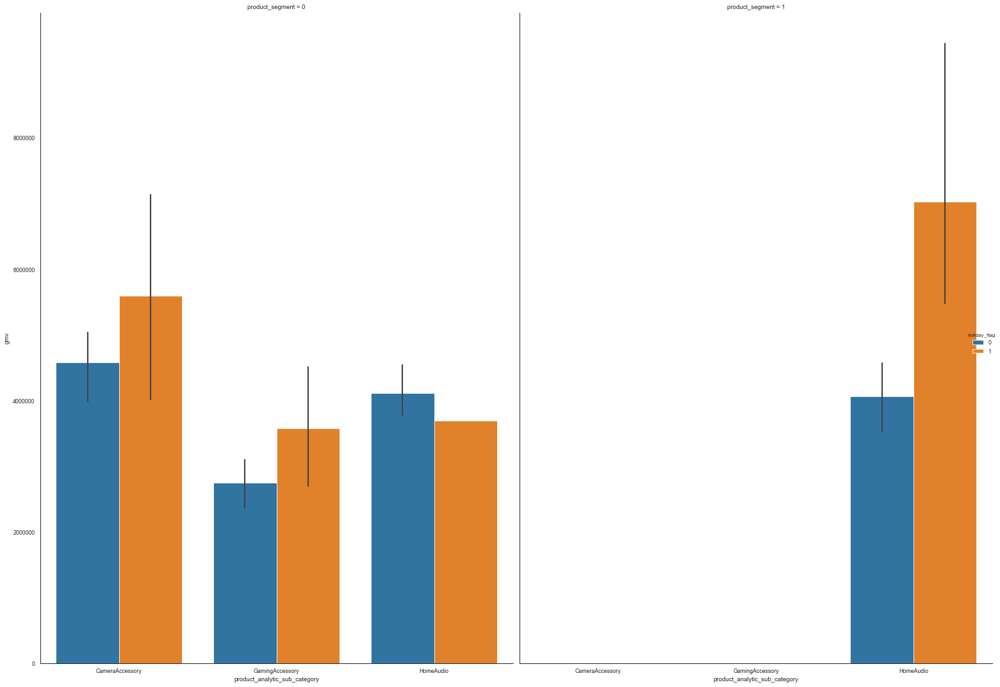

In [202]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
sns.catplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",col="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Compare to other sub-category only Home Audio features in Luxury product segment.
#### Holiday is showing huge increase in revenue for product actegory  'Home Audio'  in Luxury product segment

<Figure size 1500x1000 with 0 Axes>

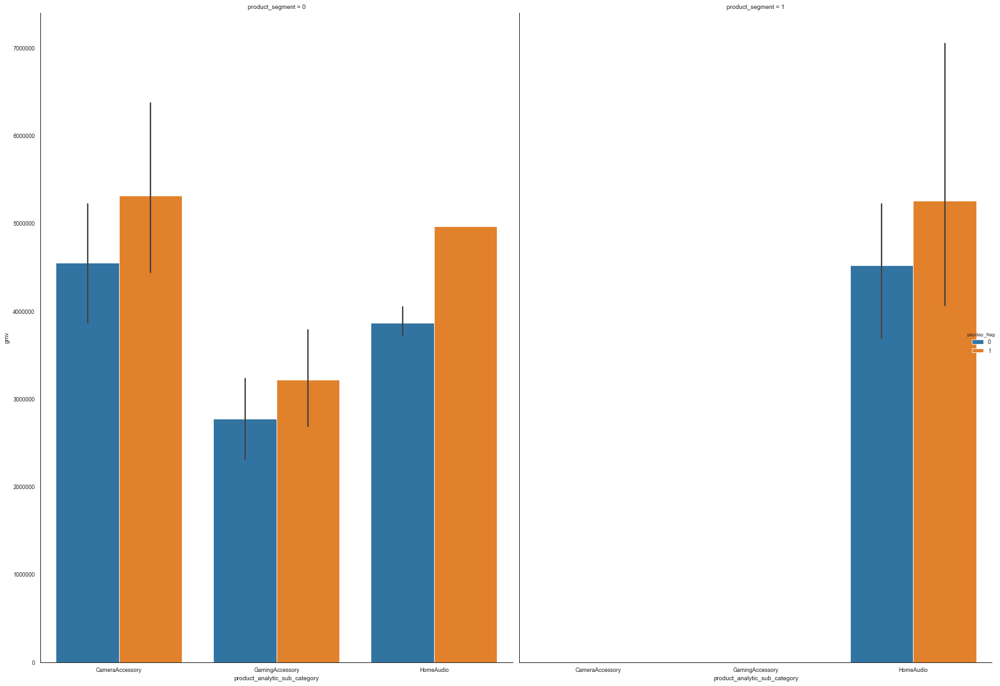

In [203]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
sns.catplot(y="gmv", x="product_analytic_sub_category",hue="payday_flag",col="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Plot to show revenue distribution for each of the product categories grouped by product segement grouped for pay and non-pay day

<Figure size 1500x1000 with 0 Axes>

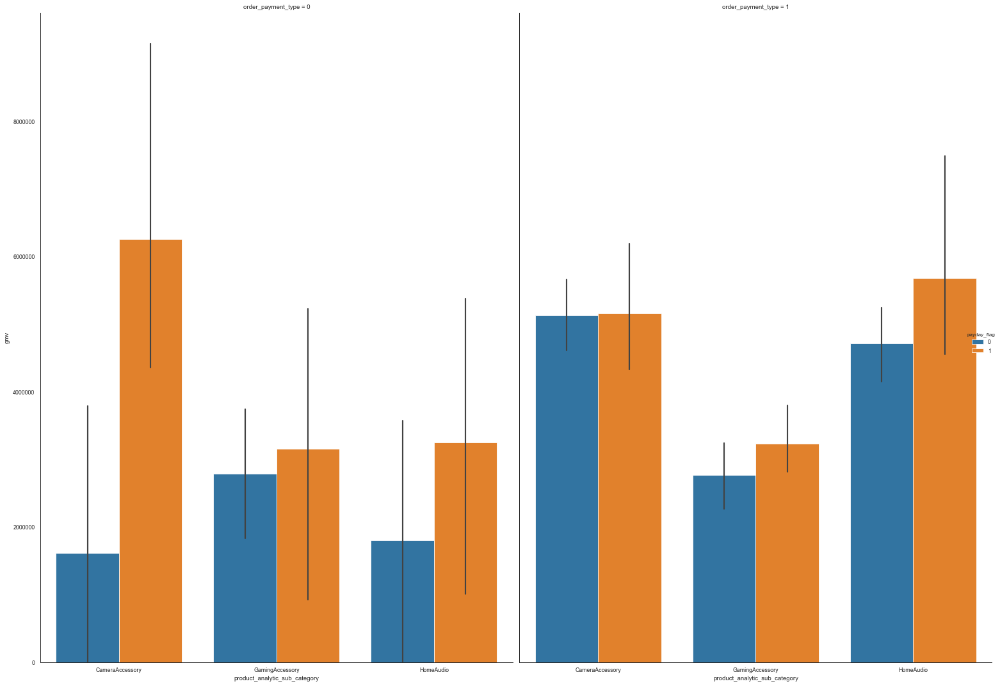

In [204]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
sns.catplot(y="gmv", x="product_analytic_sub_category",hue="payday_flag",col="order_payment_type",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7)
#plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Plot to show revenue distribution for each of the product categories grouped by different order payment type grouped for pay and non-pay day

<Figure size 1500x1000 with 0 Axes>

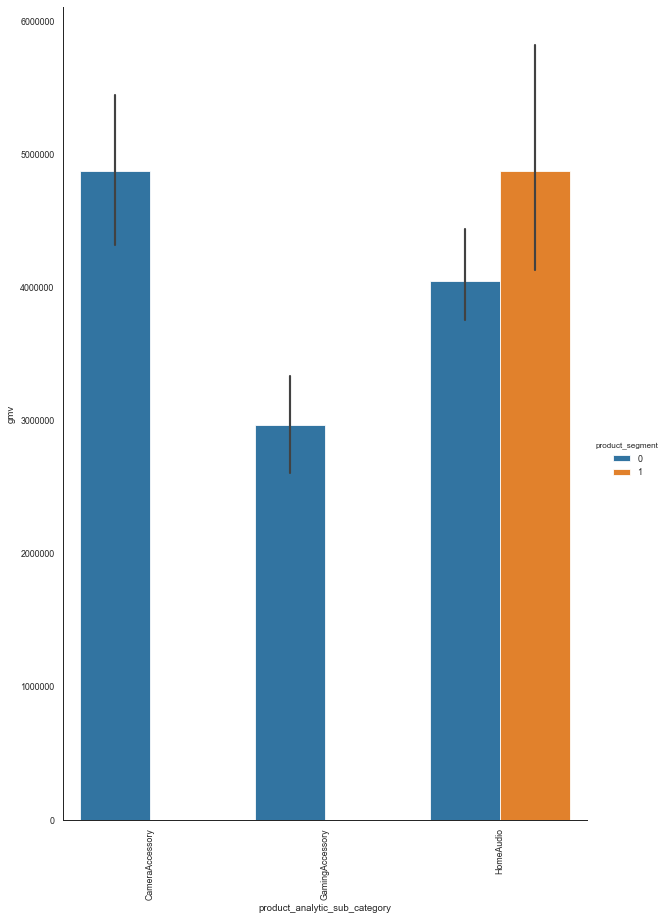

In [205]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",col="product_segment",data=data_week)
sns.catplot(y="gmv", x="product_analytic_sub_category", hue="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
#plt.tight_layout()

plt.show()

#### Plot to show revenue distribution for each of the product categories for  product segment 

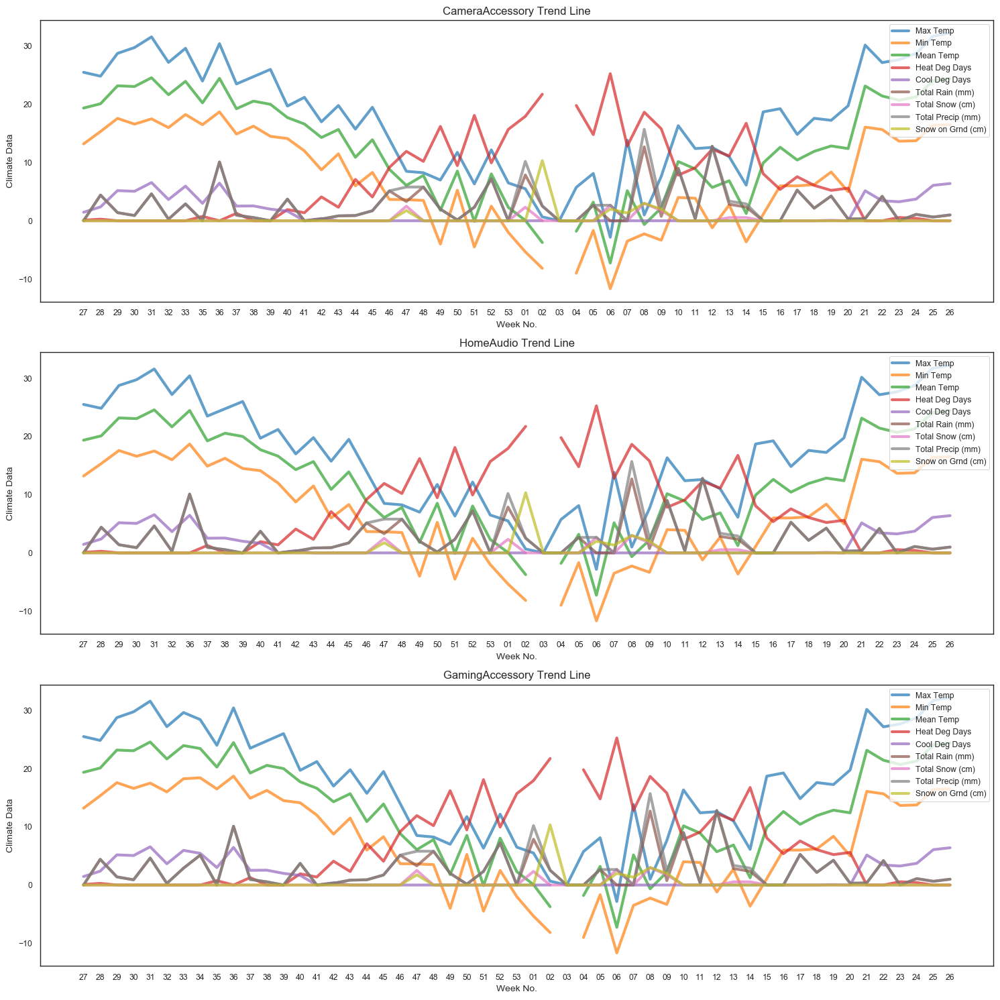

In [206]:
#Plot - Climate data for all three sub-products week wise
plot_col = ['CameraAccessory','HomeAudio','GamingAccessory']

plt.figure(figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")

cnt = 1
for col in plot_col:
    ax = plt.subplot(3,1,cnt)
    cnt+= 1
    
    data_plot = data_week[data_week['product_analytic_sub_category'] == col]

    plt.plot(data_plot['Week'], data_plot[['Max Temp', 'Min Temp', 'Mean Temp',
       'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)']], linewidth=3, alpha = 0.7)
    plt.xlabel('Week No.', fontsize=10)
    plt.ylabel('Climate Data', fontsize=10)
    ax.set_title(col + ' Trend Line', fontsize=12)
    plt.legend(data_week[['Max Temp', 'Min Temp', 'Mean Temp',
       'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)']],loc=1)

plt.tight_layout()

plt.show()

#### plot to show Trend line for climate date for each of the week

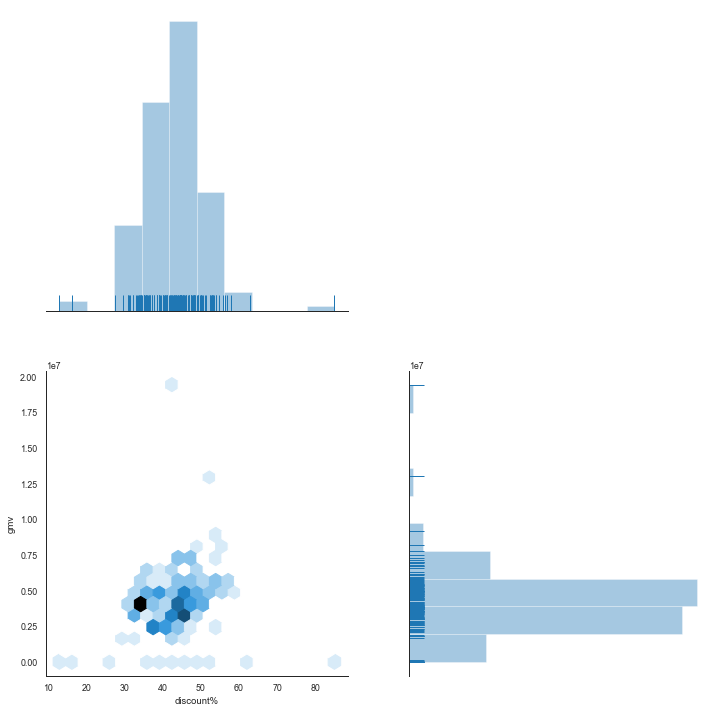

In [207]:
#Plot - Discount bins vs GMV, discount bins at 10
sns.jointplot(x="discount%", y="gmv", data=data_week,
              kind="hex", height=10, ratio=1,marginal_kws=dict(bins=10, rug=True))

#### Joint plot  to show relationship between  gmv and discount%

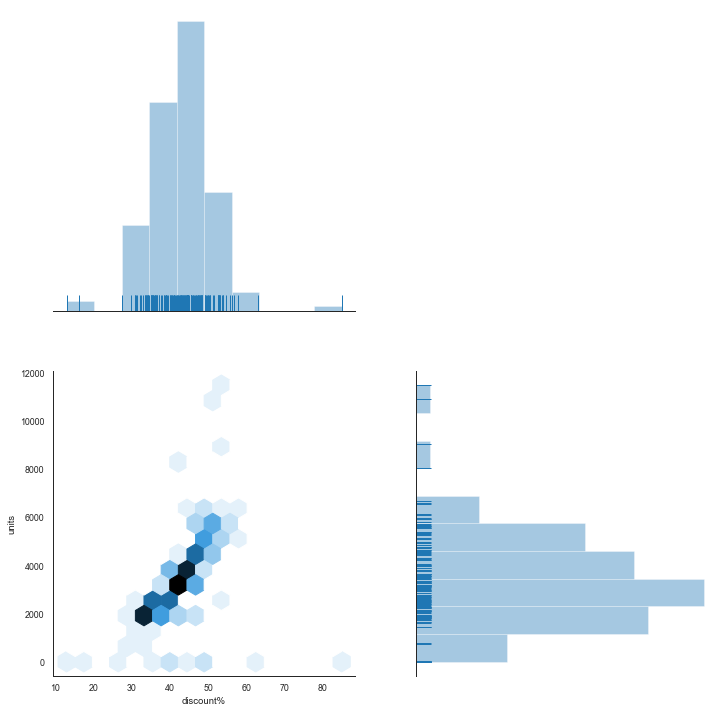

In [208]:
#Plot - Number of items sold in different discount rates
sns.jointplot(x="discount%", y="units", data=data_week,
              kind="hex", height=10, ratio=1,marginal_kws=dict(bins=10, rug=True))

#### Joint plot  to show relationship between  Number of units ordered and discount%

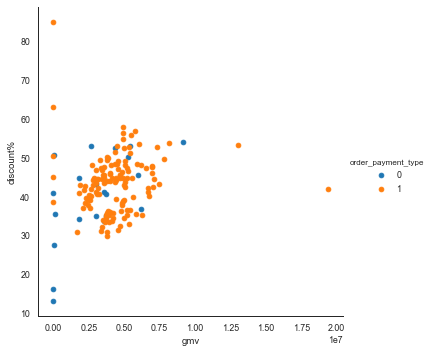

In [209]:
sns.FacetGrid(data_week,hue='order_payment_type',size=5).map(plt.scatter,"gmv","discount%").add_legend()

####  scatter plot to see spread of GMV vs discount% for different order payment type

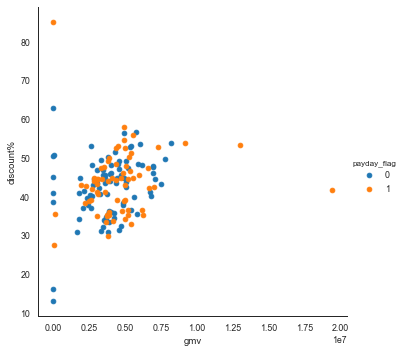

In [210]:
sns.FacetGrid(data_week,hue='payday_flag',size=5).map(plt.scatter,"gmv","discount%").add_legend()

####  scatter plot to see spread of GMV vs discount% for  payday and non-pay day

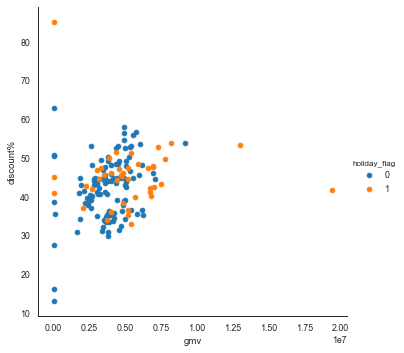

In [211]:
sns.FacetGrid(data_week,hue='holiday_flag',size=5).map(plt.scatter,"gmv","discount%").add_legend()

####  scatter plot to see spread of GMV vs discount% for  Holiday and normal working day

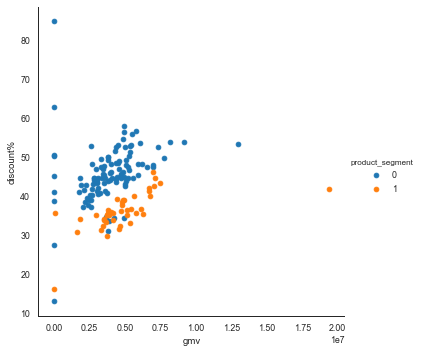

In [212]:
sns.FacetGrid(data_week,hue='product_segment',size=5).map(plt.scatter,"gmv","discount%").add_legend()

####  scatter plot to see spread of GMV vs discount% for different product segment

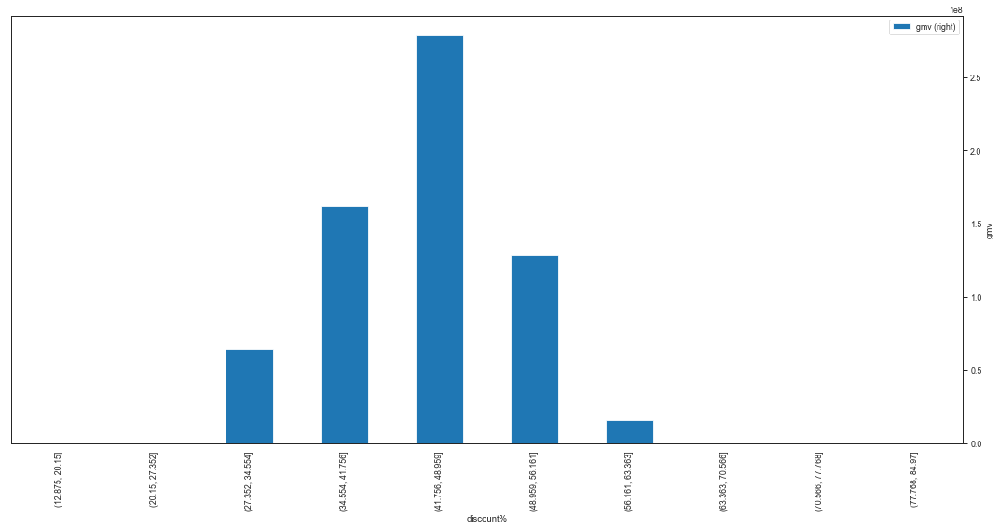

In [213]:
### Plot - discount bins vs gmv 
data_week.groupby(pd.cut(data_week["discount%"], bins =10)).sum().plot(y=['gmv',],kind='bar',figsize=(15, 8),secondary_y=True)
plt.ylabel('gmv')
plt.xticks(rotation=90)
plt.tight_layout()
#
plt.show()

####  Bar plot to show spread of GMV over discount% binned into 10 bins

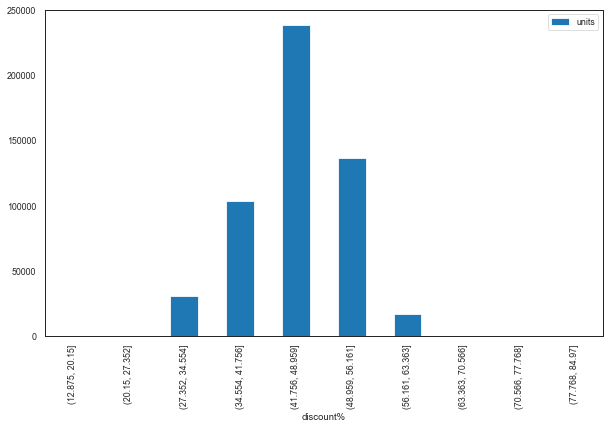

In [214]:
data_week.groupby(pd.cut(data_week["discount%"], bins =10)).sum().plot(y='units',kind='bar', stacked=True
                                                   ,legend=True
                                                   ,use_index=True
                                                   ,figsize=(10, 6))

####  Bar plot to show spread of 'No of units' over 'discount%' binned into 10 bins

<Figure size 1500x1000 with 0 Axes>

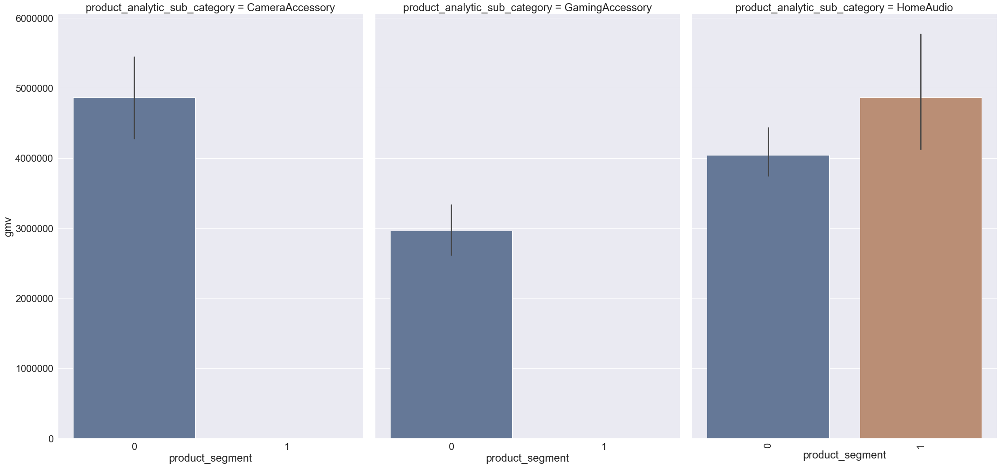

In [215]:
### Plot - revenue for different product segment for all three sub-products
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
#sns.barplot(y="gmv", x="product_analytic_sub_category",col="product_segment",data=data_week)
sns.catplot(y="gmv",x="product_segment", col="product_analytic_sub_category",data=data_week,kind="bar",legend=True,legend_out=True,
           height=15, aspect=.7,saturation=.5 )
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Most of the records in Luxury product segment belong to 'Home Audio' product sub category.

<Figure size 1500x800 with 0 Axes>

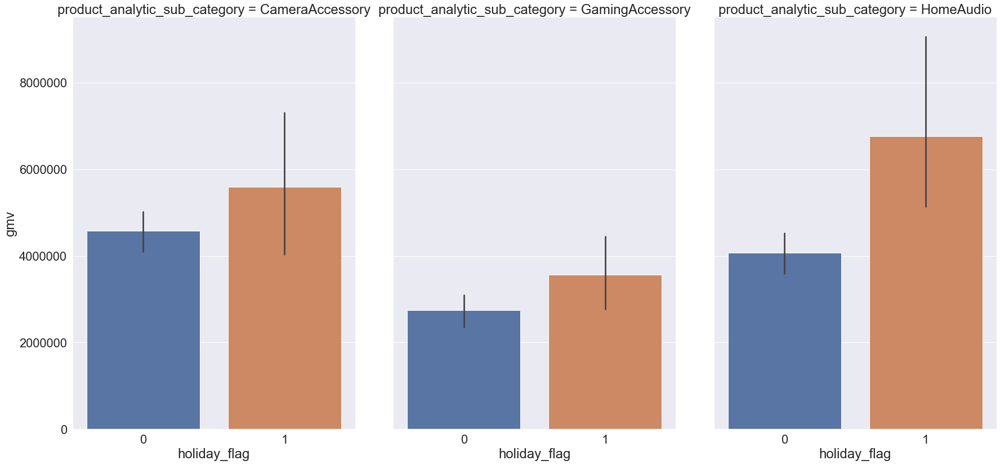

In [216]:
### Plot - revenue from holiday and non-holiday sale for all three sub-products
plt.figure(figsize=(15, 8), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.set(font_scale = 2)
sns.catplot(y="gmv",x="holiday_flag", col="product_analytic_sub_category",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)

plt.tight_layout()

plt.show()

#### There is clear increase in revenue on Holiday vs rest of the days for all of the sub-categories. 
#### Home audio is showing Maximum difference between Holiday and non-holiday sale.

<Figure size 1500x1000 with 0 Axes>

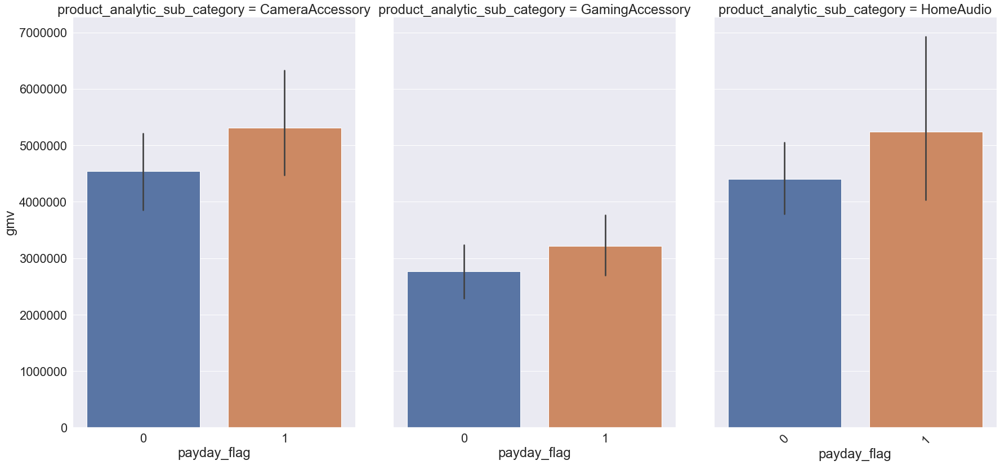

In [217]:
### Plot - revenue vs Pay day for all three sub-products
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
#ax.set_title('product sub category' + ' Trend Line', fontsize=12)
sns.set(font_scale = 2)
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.catplot(y="gmv", col="product_analytic_sub_category",x="payday_flag",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

#### There is slight increase in revenue on Pay-day for all of the sub-categories. 
#### All three sub-categories show similar growth of revenue on a pay day.

<Figure size 1500x1000 with 0 Axes>

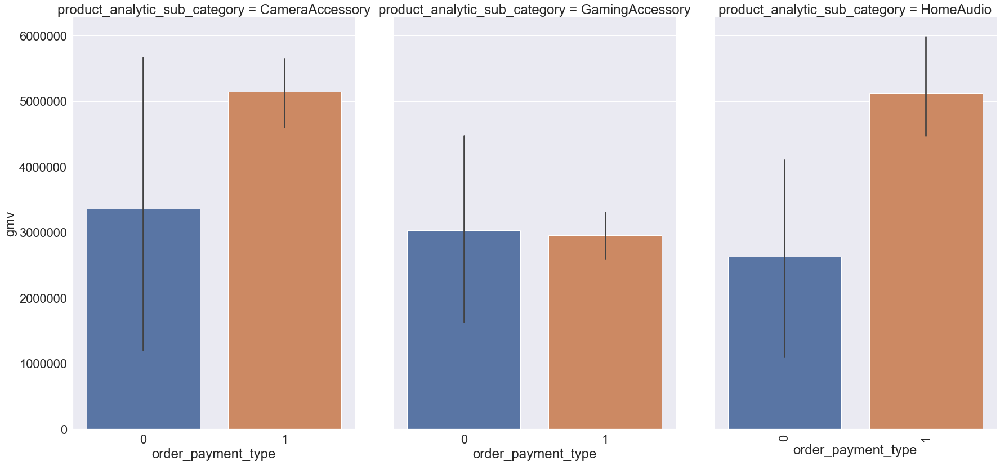

In [218]:
### Plot - revenue vs Payment type  for all three sub-products
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
#sns.barplot(y="gmv", x="product_analytic_sub_category",hue="holiday_flag",data=data_week)
sns.catplot(y="gmv", col="product_analytic_sub_category",x="order_payment_type",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### revenue vs order Payment type (COD as 1 and Prepaid as 0)  for all three sub-products 
#### Order Payment type has almost zero impact on revenue for Gaming Accessory.  
#### Rest of the two category products show high values for COD vs Pre-paid

<Figure size 1500x1000 with 0 Axes>

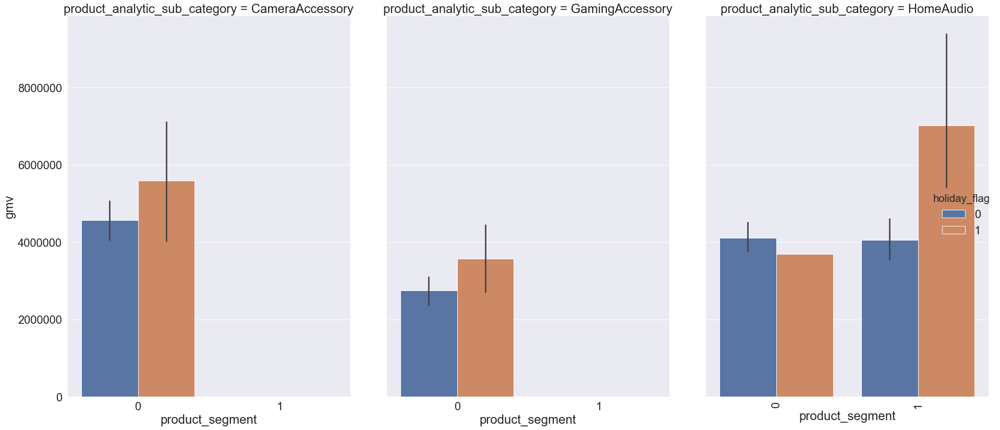

In [219]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
sns.catplot(y="gmv", col="product_analytic_sub_category",hue="holiday_flag",x="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Compare to other sub-category only Home Audio features in Luxury product segment.
#### Holiday is showing huge increase in revenue for product actegory  'Home Audio'  in Luxury product segment

<Figure size 1500x1000 with 0 Axes>

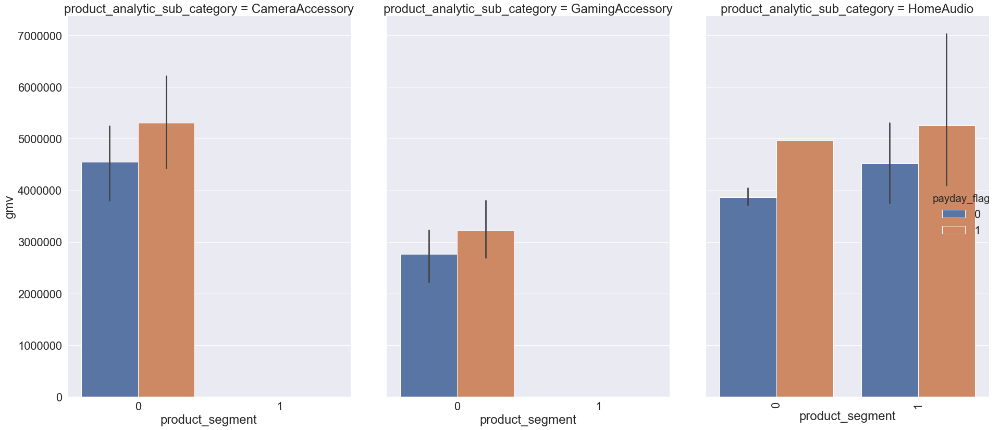

In [220]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
sns.catplot(y="gmv", col="product_analytic_sub_category",hue="payday_flag",x="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Plot to show revenue distribution for each of the product categories grouped by product segment grouped for pay and non-pay day

<Figure size 1500x1000 with 0 Axes>

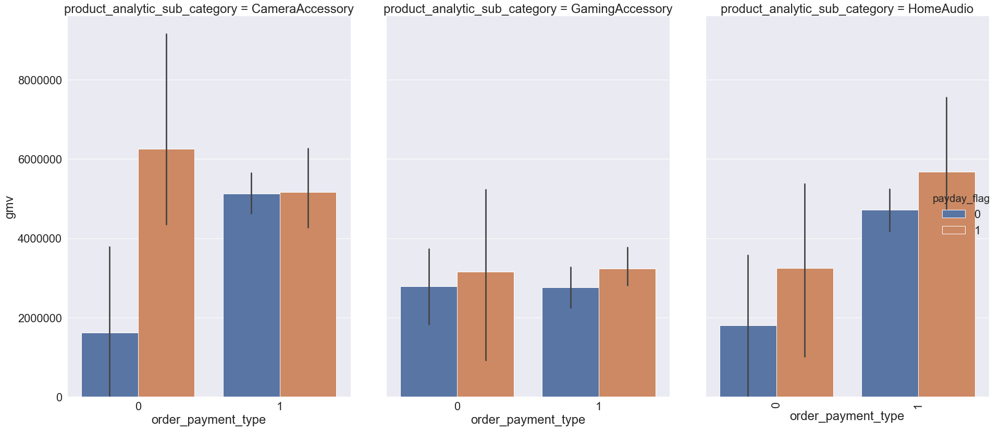

In [221]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')
#sns.set(font_scale = 2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
sns.catplot(y="gmv", col="product_analytic_sub_category",hue="payday_flag",x="order_payment_type",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

#### Plot to show revenue distribution for each of the product categories grouped by different order payment type grouped for pay and non-pay day

<Figure size 1500x1000 with 0 Axes>

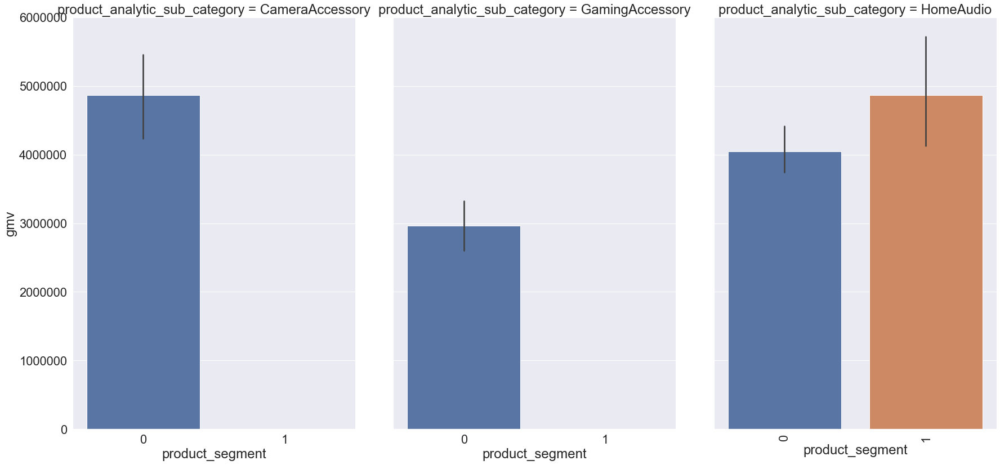

In [222]:
plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
sns.catplot(y="gmv", col="product_analytic_sub_category", x="product_segment",data=data_week,kind="bar",legend=True,legend_out=True,
           height=12, aspect=.7)
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

####  Cat plot to see spread of GMV and product segment for each of the product sub category

<Figure size 1500x800 with 0 Axes>

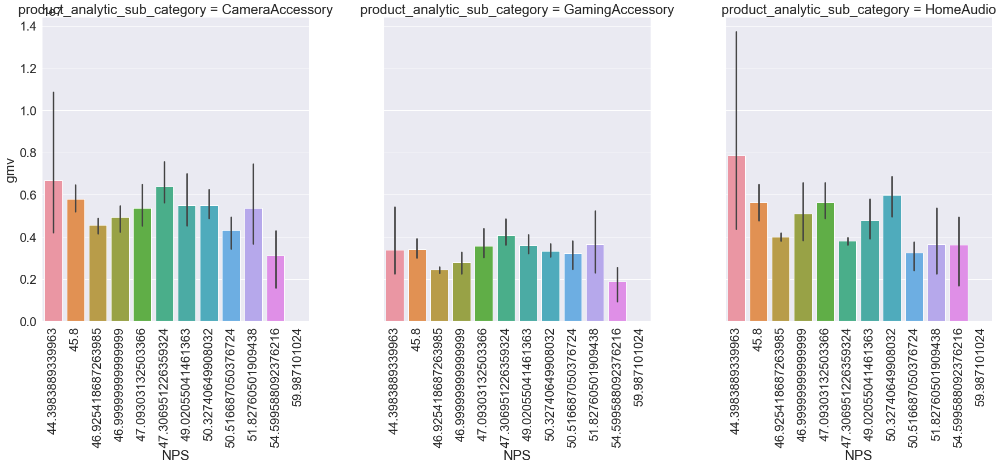

In [223]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="NPS",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and NPS for each of the product sub category

<Figure size 1500x800 with 0 Axes>

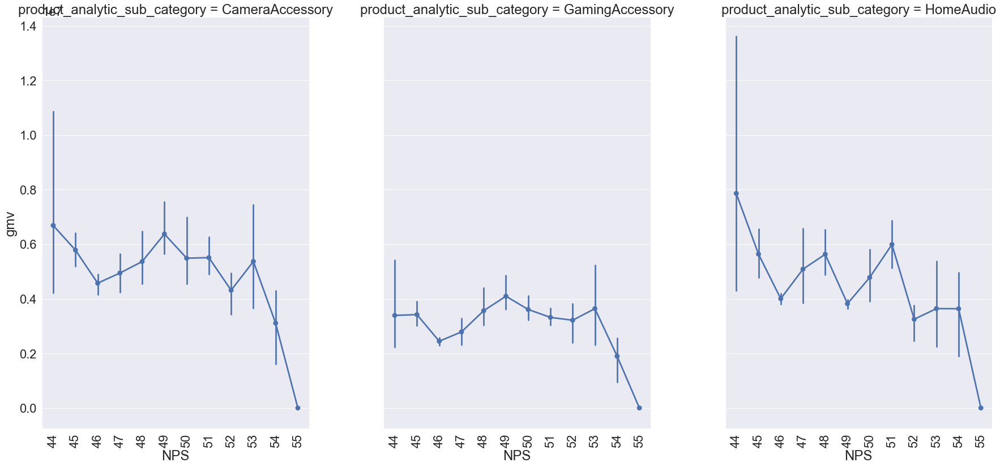

In [224]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
max_col=int(data_week.NPS.max())
min_col=int(data_week.NPS.min())
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="NPS",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.7)
ax = ax.set_xticklabels(range(min_col,max_col), rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and NPS for each of the product sub category

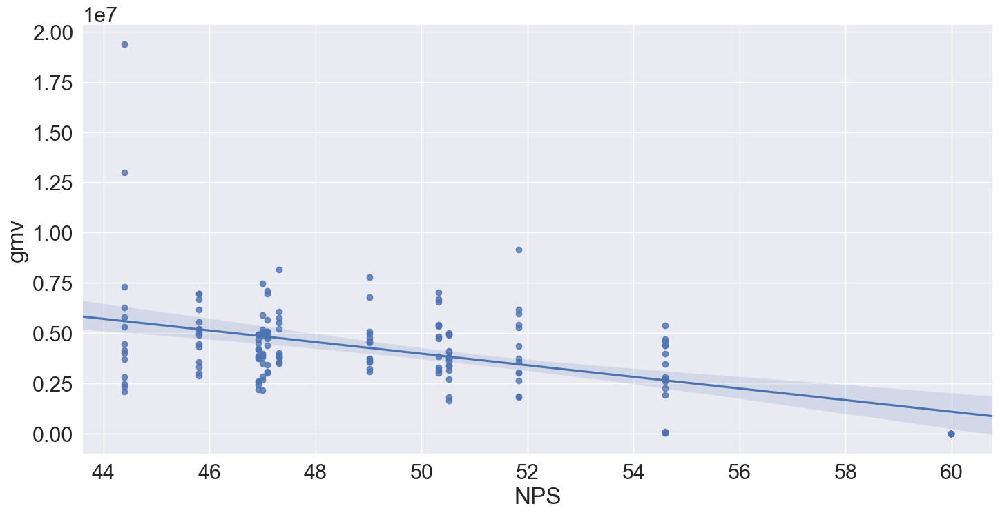

In [225]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.regplot(y="gmv", x="NPS",
            data=data_week)
#ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  reg plot to see spread of GMV and NPS 

<Figure size 1500x800 with 0 Axes>

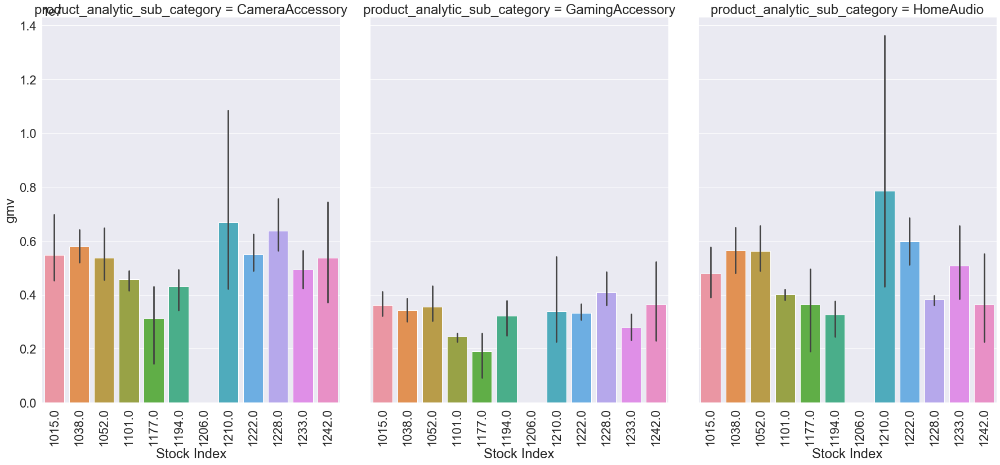

In [226]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Stock Index",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Stock Index for each of the product sub category

<Figure size 1500x800 with 0 Axes>

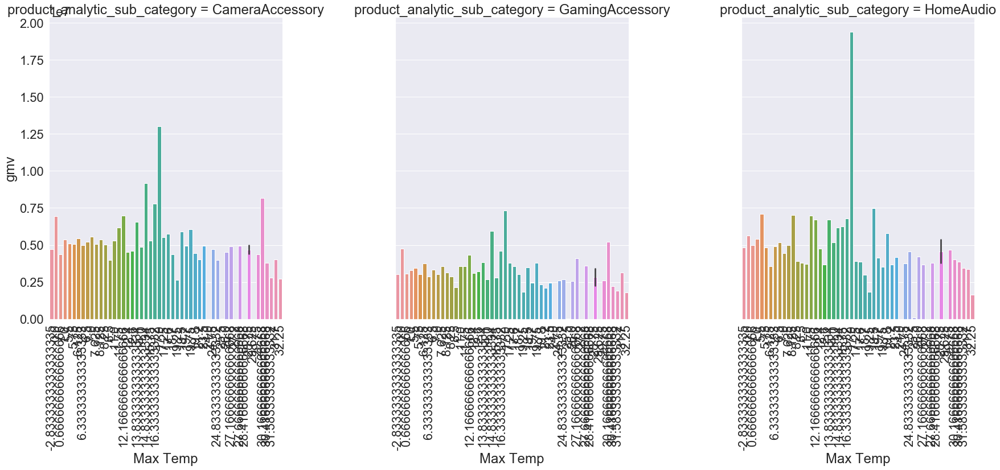

In [227]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Max Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Max Temp for each of the product sub category

<Figure size 1500x800 with 0 Axes>

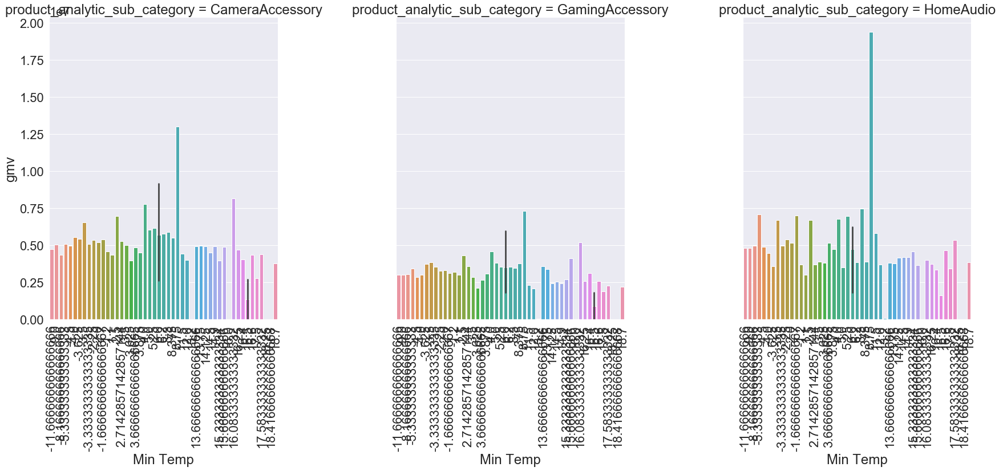

In [228]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Min Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Min Temp for each of the product sub category

<Figure size 1500x800 with 0 Axes>

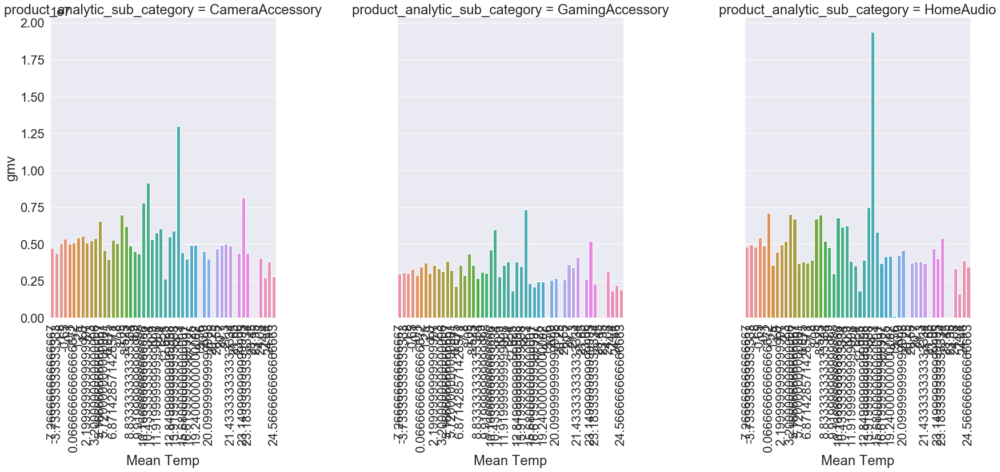

In [229]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Mean Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Mean Temp for each of the product sub category

<Figure size 1500x800 with 0 Axes>

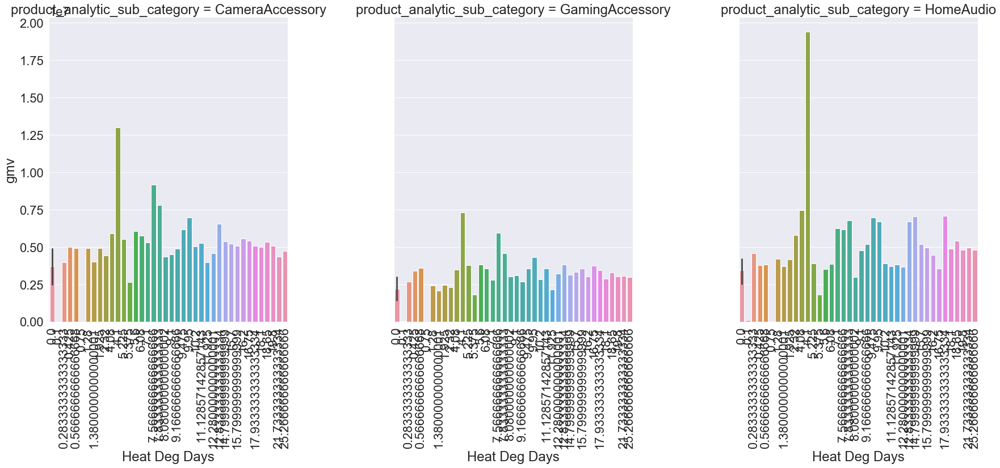

In [230]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Heat Deg Days",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Heat Deg Days for each of the product sub category

<Figure size 1500x800 with 0 Axes>

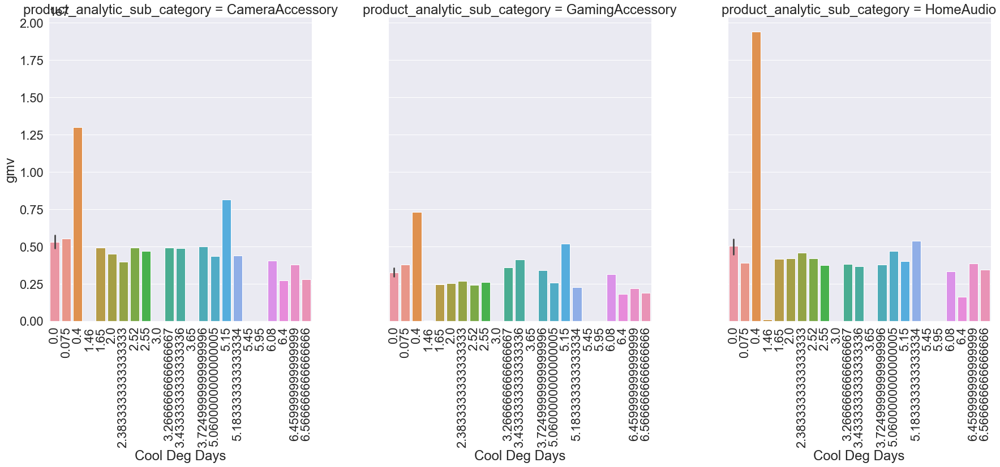

In [231]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Cool Deg Days",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Cool Deg Days for each of the product sub category

<Figure size 1500x800 with 0 Axes>

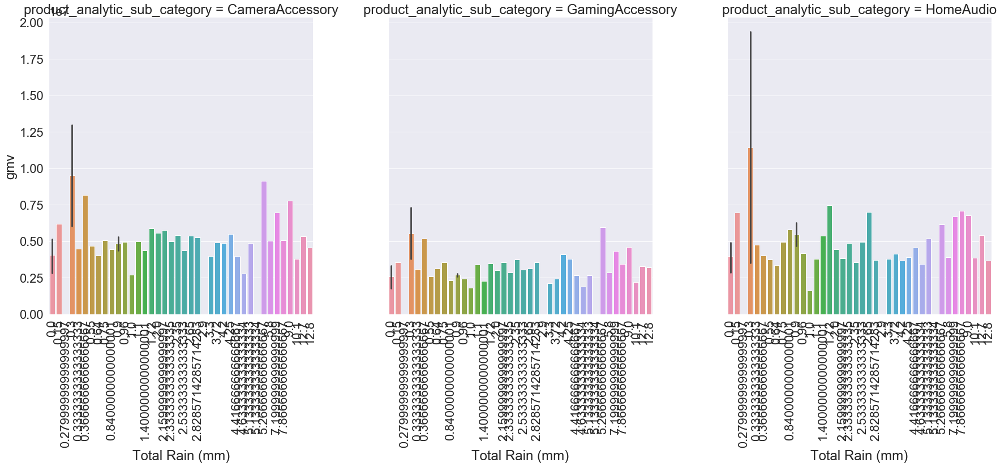

In [232]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Rain (mm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Total Rain (mm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

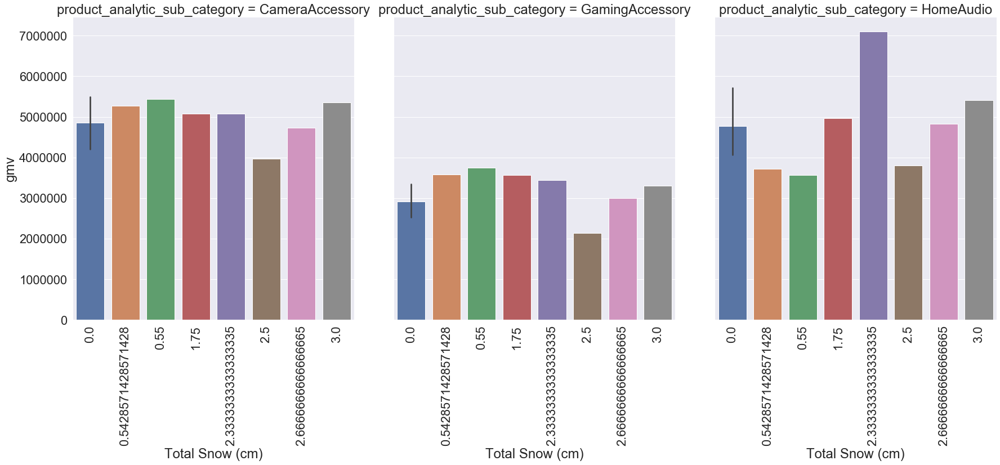

In [233]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Snow (cm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Total Snow (cm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

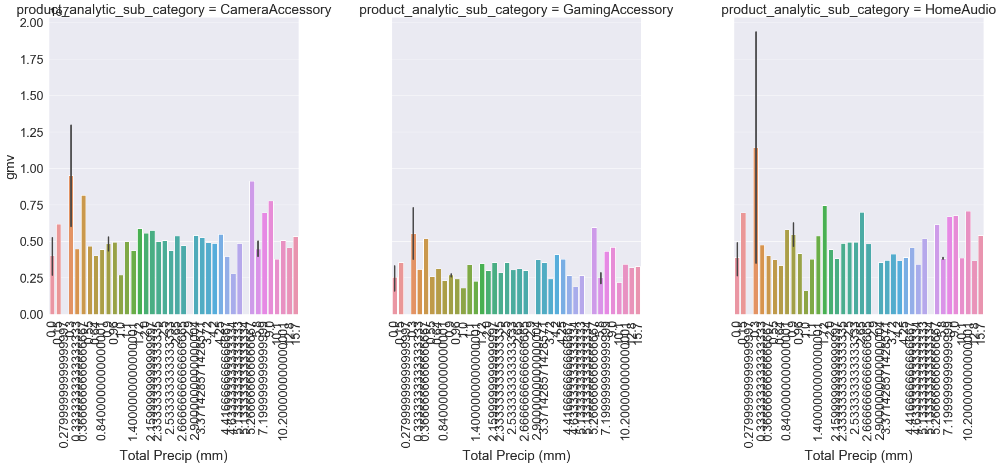

In [234]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Precip (mm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Total Precip (mm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

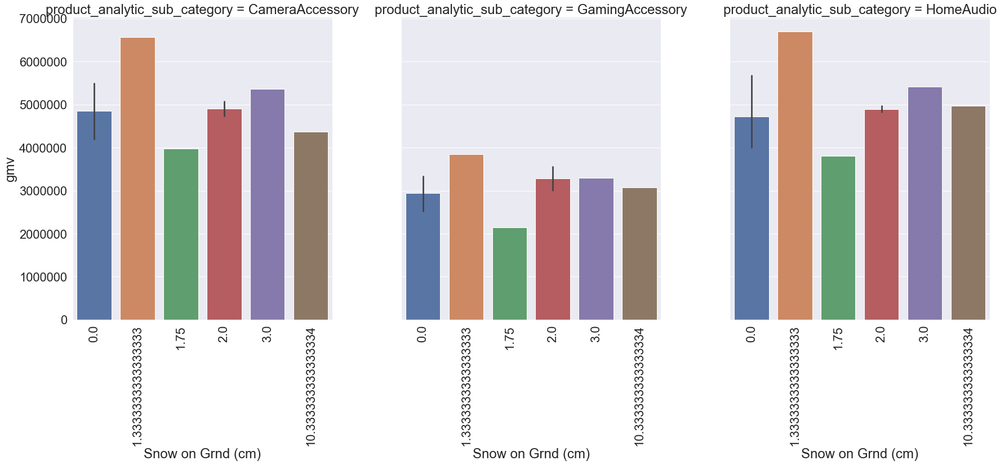

In [235]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Snow on Grnd (cm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="bar",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels(['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Bar plot to see spread of GMV and Snow on Grnd (cm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

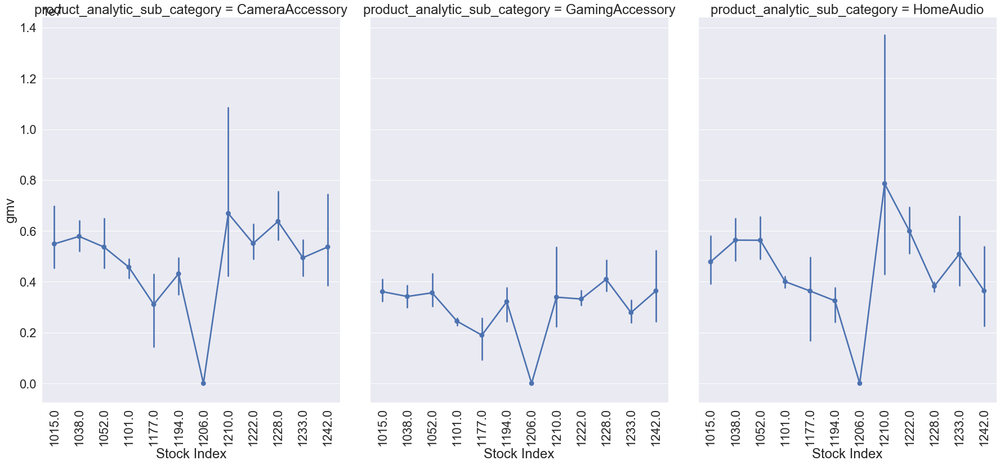

In [236]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=int(data_week["Stock Index"].max())
#min_col=int(data_week["Stock Index"].min())
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Stock Index",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Stock Index for each of the product sub category

<Figure size 1500x800 with 0 Axes>

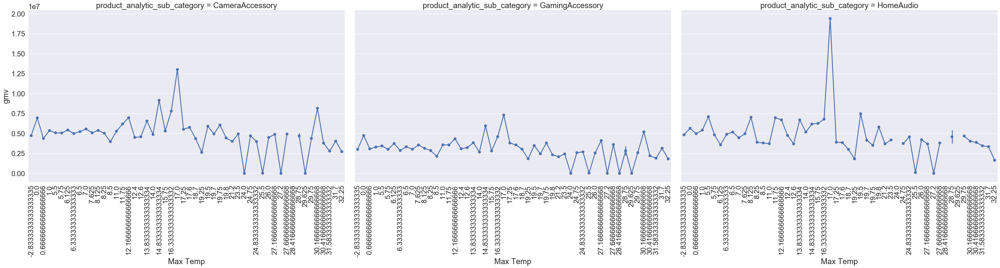

In [237]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Max Temp"].max(),2)
#min_col=round(data_week["Max Temp"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Max Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=1.2)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
#ax = ax.set(xticks= (['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()]))
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Max Temp for each of the product sub category

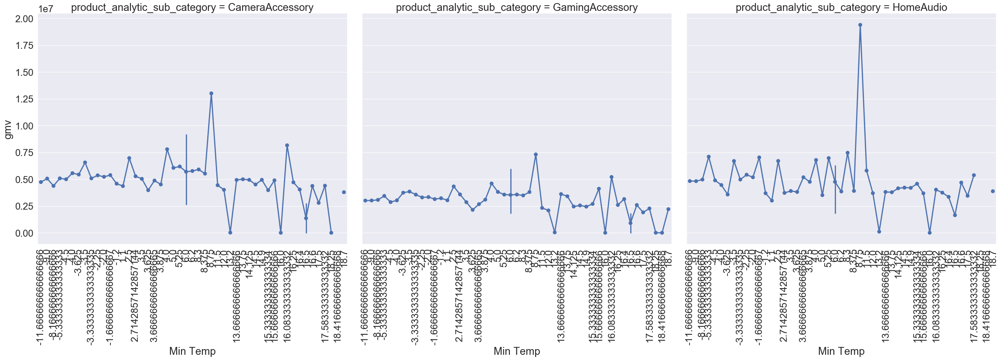

In [238]:
#plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Min Temp"].max(),2)
#min_col=round(data_week["Min Temp"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Min Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",height=12,
            aspect=0.9)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
#ax = ax.set_xticklabels(  rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Min Temp for each of the product sub category

<Figure size 1500x800 with 0 Axes>

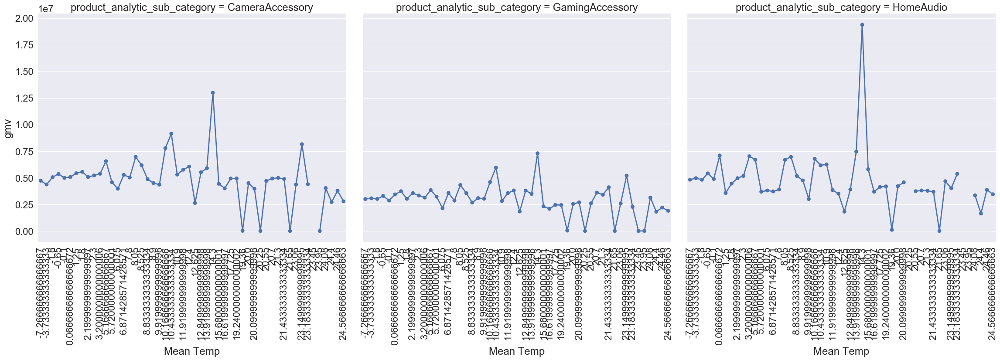

In [239]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Mean Temp"].max(),2)
#min_col=round(data_week["Mean Temp"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Mean Temp",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.9)
ax = ax.set_xticklabels( rotation=90)
#ax = ax.set(xlim=(min_col, max_col))

#ax = ax.set_xticklabels(  rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Mean Temp for each of the product sub category.

<Figure size 1500x800 with 0 Axes>

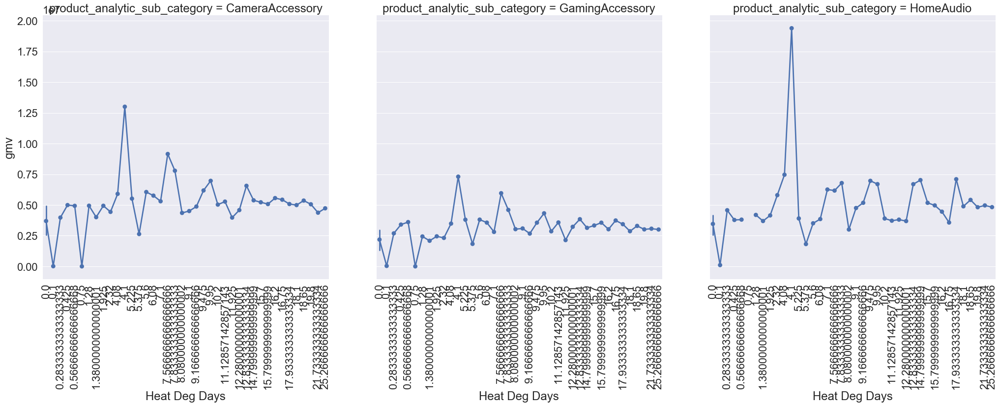

In [240]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Heat Deg Days"].max(),2)
#min_col=round(data_week["Heat Deg Days"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Heat Deg Days",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.8)

ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
#ax = ax.set_xticklabels(  rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Heat Deg Days for each of the product sub category

<Figure size 1500x800 with 0 Axes>

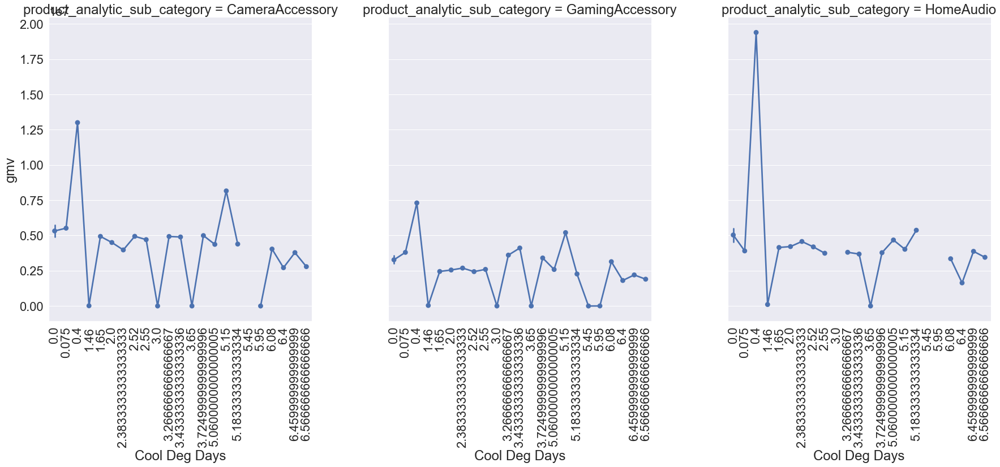

In [241]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Cool Deg Days"].max(),2)
#min_col=round(data_week["Cool Deg Days"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Cool Deg Days",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
##ax = ax.set_xticklabels(  rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Cool Deg Days for each of the product sub category

<Figure size 1500x800 with 0 Axes>

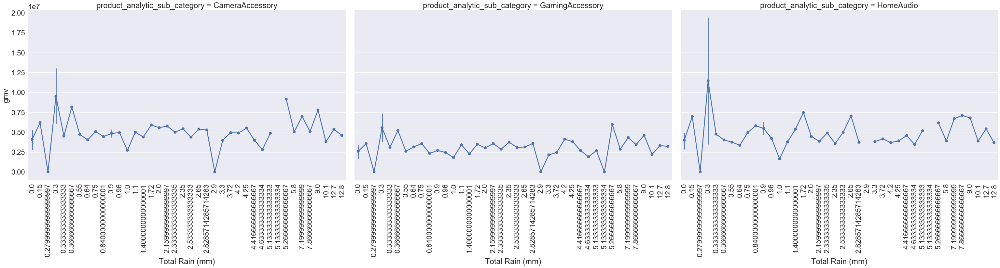

In [242]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Total Rain (mm)"].max(),2)
#min_col=round(data_week["Total Rain (mm)"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Rain (mm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=1.2)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
#ax = ax.set_xticklabels(  rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Total Rain (mm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

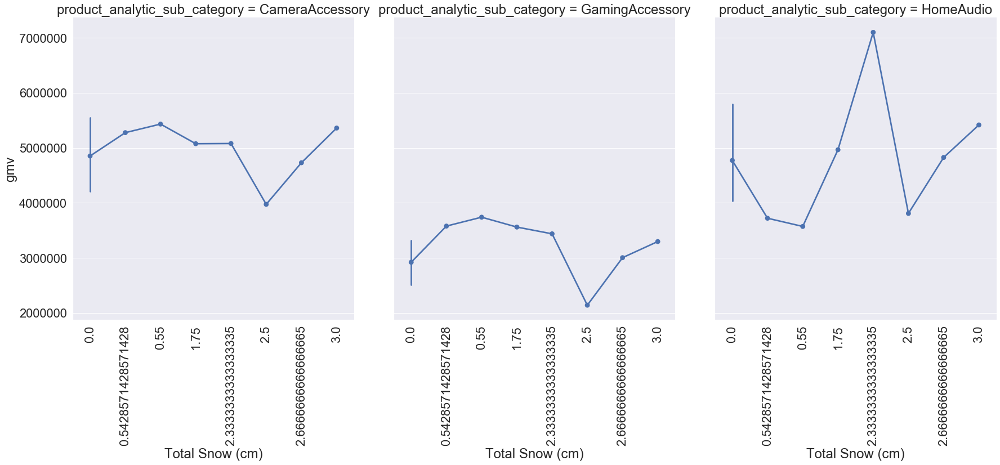

In [243]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Total Snow (cm)"].max(),2)
#min_col=round(data_week["Total Snow (cm)"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Snow (cm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.7)
#ax = ax.set_xticklabels(  rotation=90)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set(xlim=(min_col, max_col))
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Total Snow (cm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

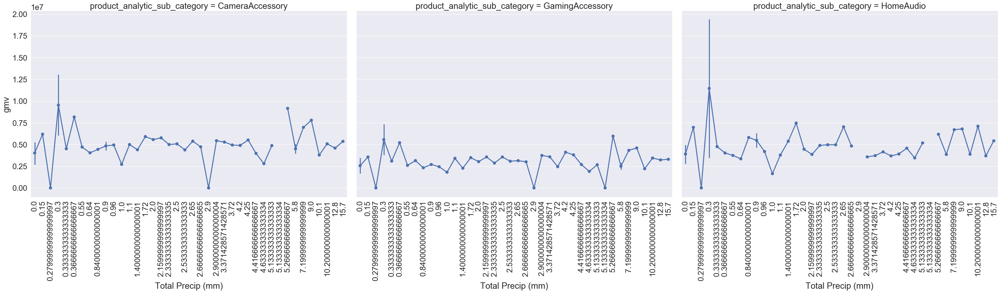

In [244]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=round(data_week["Total Precip (mm)"].max(),2)
#min_col=round(data_week["Total Precip (mm)"].min(),2)
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Total Precip (mm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=1.1)
#ax = ax.set_xticklabels(  rotation=90)
ax = ax.set_xticklabels(rotation=90)
#ax=ax.set(xlim=(min_col,max_col))
plt.xlim
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Total Precip (mm) for each of the product sub category

<Figure size 1500x800 with 0 Axes>

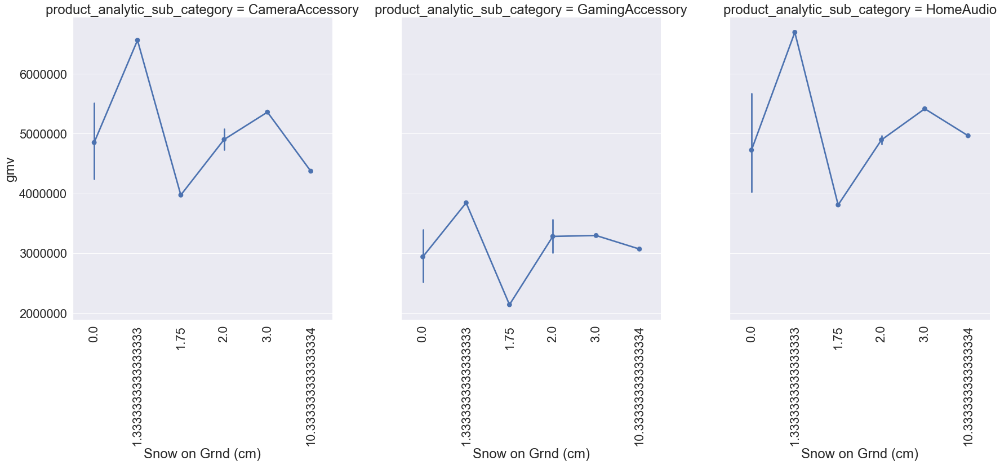

In [245]:
plt.figure(figsize=(15, 8),dpi=100, facecolor='w', edgecolor='k', frameon='True')
#max_col=(data_week["Snow on Grnd (cm)"].max())
#min_col=(data_week["Snow on Grnd (cm)"].min())
sns.set_style("white")
sns.set_context("paper")
sns.set(font_scale = 2)
ax = sns.catplot(y="gmv", x="Snow on Grnd (cm)",col="product_analytic_sub_category",
            data=data_week ,
            kind="point",
            height=12, aspect=.7)
ax = ax.set_xticklabels(rotation=90)
#ax = ax.set_xticklabels( ['{:.2f}'.format(float(t.get_text())) for t in ax.get_xticklabels()])
plt.tight_layout()

plt.show()

####  Point plot to see spread of GMV and Snow on Grnd (cm) for each of the product sub category

In [246]:
# Creating dataframe to store Luxury % and Mass Market % for each product sub-category
prod_cat_seg = pd.DataFrame(pd.pivot_table(data, values='Week', index = ['product_analytic_sub_category'],
                    columns=['product_segment'], aggfunc='count', fill_value=0))
#prod_cat_seg.columns = ['Mass Market', 'Luxury']
prod_cat_seg.rename(columns={0 : 'Mass Market', 1 : 'Luxury'}, inplace = True)
prod_cat_seg['Total'] = prod_cat_seg['Mass Market'] + prod_cat_seg['Luxury']
prod_cat_seg['product_analytic_sub_category'] = prod_cat_seg.index
prod_cat_seg.reset_index(drop = True, inplace = True)
prod_cat_seg['Mass Market %'] = round((prod_cat_seg['Mass Market']/prod_cat_seg['Total'])*100,2)
prod_cat_seg['Luxury %'] = round((prod_cat_seg['Luxury']/prod_cat_seg['Total'])*100,2)
prod_cat_seg

product_segment,Mass Market,Luxury,Total,product_analytic_sub_category,Mass Market %,Luxury %
0,180957,34976,215933,CameraAccessory,83.80,16.20
1,154978,30929,185907,GamingAccessory,83.36,16.64
2,47910,63192,111102,HomeAudio,43.12,56.88


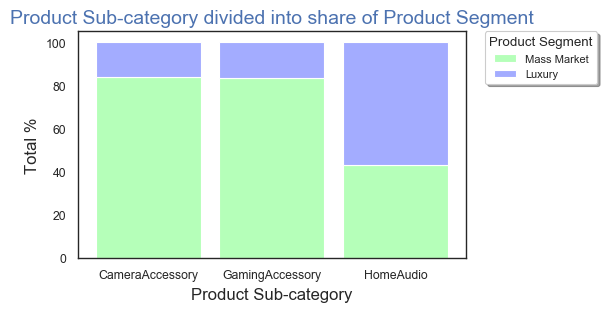

In [385]:
plt.figure(figsize=(5, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
barWidth = 0.85
#Create y axis labels
names = prod_cat_seg['product_analytic_sub_category']
# Create Mass Market base green color
plt.bar([0,1,2], prod_cat_seg['Mass Market %'], color='#b5ffb9', edgecolor='white', width=barWidth)
# Create Luxury top purple color
plt.bar([0,1,2], prod_cat_seg['Luxury %'], bottom=[i for i in prod_cat_seg['Mass Market %']], color='#a3acff', edgecolor='white', width=barWidth)
 
# Custom x axis names
plt.xticks([0,1,2], names)
plt.xlabel("Product Sub-category", fontsize = 12)
plt.ylabel("Total %", fontsize = 12)
plt.legend(['Mass Market','Luxury'],frameon=True, fontsize='small', shadow='True', title='Product Segment', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Product Sub-category divided into share of Product Segment", fontsize = 14, color = 'b')

plt.show()

#### percentage distribution of Product segments for each of the product sub categories

In [248]:
bin_points = [0,10,20,30,40,50,60,70,80,90,100]
label_discount = ["Below 10%","Between 10-20%","Between 20-30%","Between 30-40%","Between 40-50%","Between 50-60%", \
              "Between 60-70%","Between 70-80%","Between 80-90%","Between 90-100%"]

df_discount = data.copy()
column_index = df_discount.columns.get_loc('discount%') + 1
df_discount.insert(loc=column_index,column='Discount Bins',value=pd.cut(df_discount['discount%'],bin_points,labels=label_discount, include_lowest=True))

df_discount = pd.DataFrame(pd.pivot_table(df_discount, values='Week', index = ['Discount Bins'],
                    columns=['product_segment'], aggfunc='count', fill_value=0))
#prod_cat_seg.columns = ['Mass Market', 'Luxury']
df_discount.rename(columns={0 : 'Mass Market', 1 : 'Luxury'}, inplace = True)
df_discount['Total'] = df_discount['Mass Market'] + df_discount['Luxury']
df_discount['Discount Bins'] = df_discount.index
df_discount.reset_index(drop = True, inplace = True)

df_discount['Mass Market %'] = round((df_discount['Mass Market']/df_discount['Total'])*100,2)
df_discount['Luxury %'] = round((df_discount['Luxury']/df_discount['Total'])*100,2)

df_discount

product_segment,Mass Market,Luxury,Total,Discount Bins,Mass Market %,Luxury %
0,34564,8912,43476,Below 10%,79.50,20.50
1,29693,16899,46592,Between 10-20%,63.73,36.27
2,44600,14401,59001,Between 20-30%,75.59,24.41
3,50471,14393,64864,Between 30-40%,77.81,22.19
4,50291,14810,65101,Between 40-50%,77.25,22.75
5,57762,29392,87154,Between 50-60%,66.28,33.72
6,40473,15892,56365,Between 60-70%,71.81,28.19
7,38104,3757,41861,Between 70-80%,91.03,8.97
8,32610,7225,39835,Between 80-90%,81.86,18.14
9,5277,3416,8693,Between 90-100%,60.70,39.30


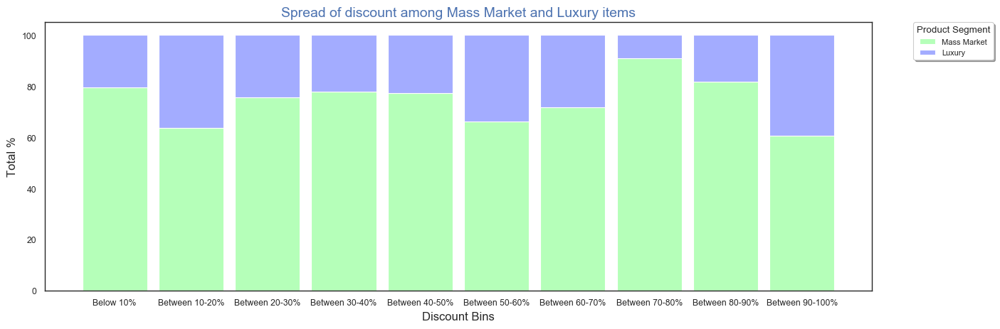

In [386]:
plt.figure(figsize=(15, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')

barWidth = 0.85
#Create y axis labels
names = df_discount['Discount Bins']
cnt = range(0,len(df_discount))
# Create Mass Market base green color
plt.bar(cnt, df_discount['Mass Market %'], color='#b5ffb9', edgecolor='white', width=barWidth)
# Create Luxury top purple color
plt.bar(cnt, df_discount['Luxury %'], bottom=[i for i in df_discount['Mass Market %']], color='#a3acff', edgecolor='white', width=barWidth)
 
# Custom x axis names
plt.xticks(cnt, names)
plt.xlabel("Discount Bins", fontsize = 12)
plt.ylabel("Total %", fontsize = 12)
plt.legend(['Mass Market','Luxury'],frameon=True, fontsize='small', shadow='True', title='Product Segment', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Spread of discount among Mass Market and Luxury items", fontsize = 14, color = 'b')

 

plt.show()

####  percentage distribution of Product segments for different discount% bins

<Figure size 1200x800 with 0 Axes>

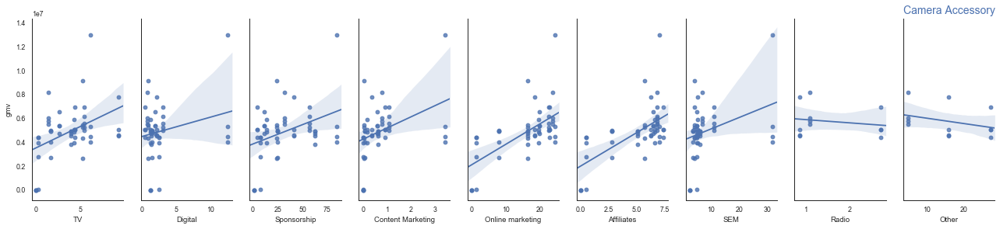

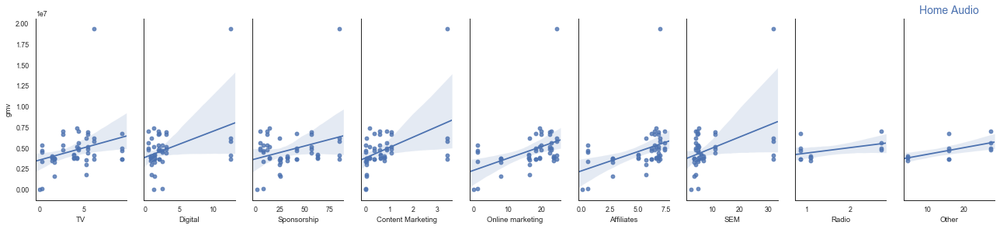

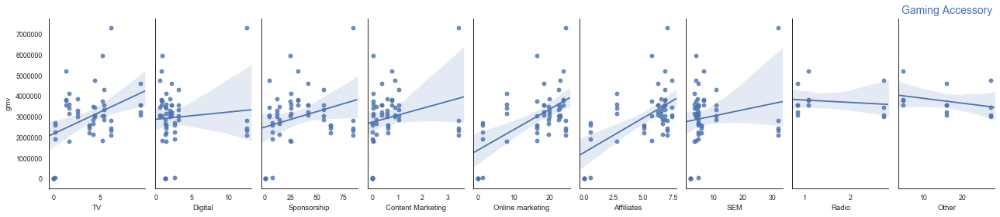

In [250]:
# Relationship between revenue and advertisement spend
plt.figure(figsize=(12,8), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white")
sns.set_context("paper")
# camera accessory revenue vs marketing spend
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'CameraAccessory'], x_vars=['TV', 'Digital', \
             'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Camera Accessory', fontsize = 14, color='b')
# home audio revenue vs marketing spend
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'HomeAudio'], x_vars=['TV', 'Digital', \
             'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Home Audio', fontsize = 14, color='b')
# gaming accessory revenue vs marketing spend
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'GamingAccessory'], x_vars=['TV', 'Digital', \
             'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Gaming Accessory', fontsize = 14, color='b')
plt.tight_layout()
plt.show()

#### Pairplot  between revenue and advertisement spends for each of the product category

<Figure size 1200x800 with 0 Axes>

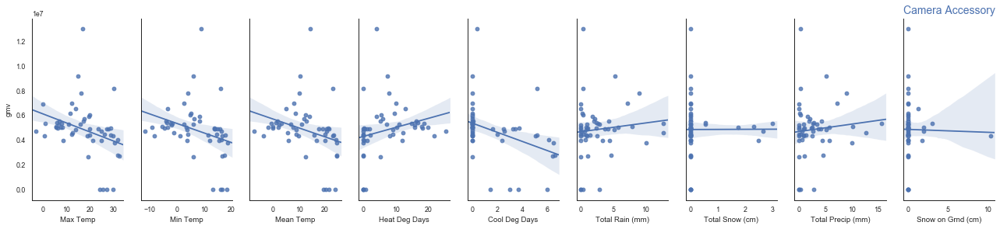

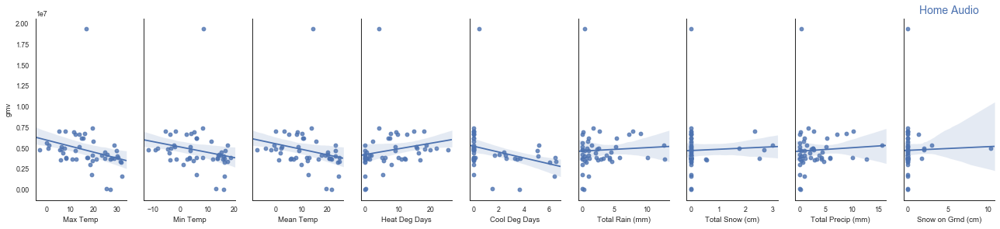

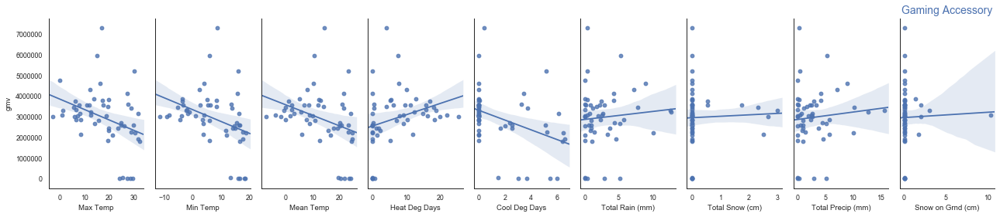

In [251]:
# Relationship between revenue and climate
plt.figure(figsize=(12,8), dpi=100, facecolor='w', edgecolor='k', frameon='True')

sns.set_style("white")
sns.set_context("paper")
# camera accessory revenue vs climate
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'CameraAccessory'], x_vars=['Max Temp', \
       'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', \
       'Total Precip (mm)', 'Snow on Grnd (cm)'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Camera Accessory', fontsize = 14, color='b')

# home audio revenue vs climate
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'HomeAudio'], x_vars=['Max Temp', \
       'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', \
       'Total Precip (mm)', 'Snow on Grnd (cm)'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Home Audio', fontsize = 14, color='b')

# gaming accessory revenue vs climate
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'GamingAccessory'], x_vars=['Max Temp', \
       'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', \
       'Total Precip (mm)', 'Snow on Grnd (cm)'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Gaming Accessory', fontsize = 14, color='b')
plt.tight_layout()
plt.show()

#### Pairplot  between revenue and Climate data for each of the product category

<Figure size 1200x800 with 0 Axes>

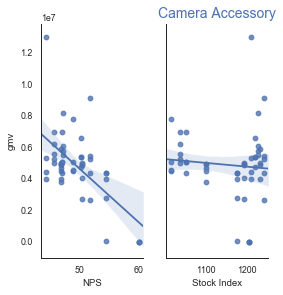

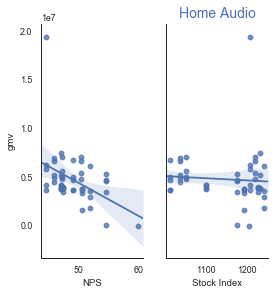

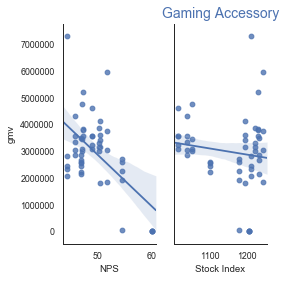

In [252]:
# Relationship between revenue and NPS & Stock Index
plt.figure(figsize=(12,8), dpi=100, facecolor='w', edgecolor='k', frameon='True')

 

sns.set_style("white")
sns.set_context("paper")

 

# camera accessory NPS & Stock Index
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'CameraAccessory'], x_vars=['NPS', 'Stock Index'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Camera Accessory', fontsize = 14, color='b')

 

# home audio revenue vs NPS & Stock Index
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'HomeAudio'], x_vars=['NPS', 'Stock Index'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Home Audio', fontsize = 14, color='b')

 

# gaming accessory revenue vs NPS & Stock Index
sns.pairplot(data_week[data_week.product_analytic_sub_category == 'GamingAccessory'], x_vars=['NPS', 'Stock Index'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('Gaming Accessory', fontsize = 14, color='b')

 

plt.tight_layout()

 

plt.show()

#### Pairplot  between revenue and NPS and Stock Index columns for each of the product category

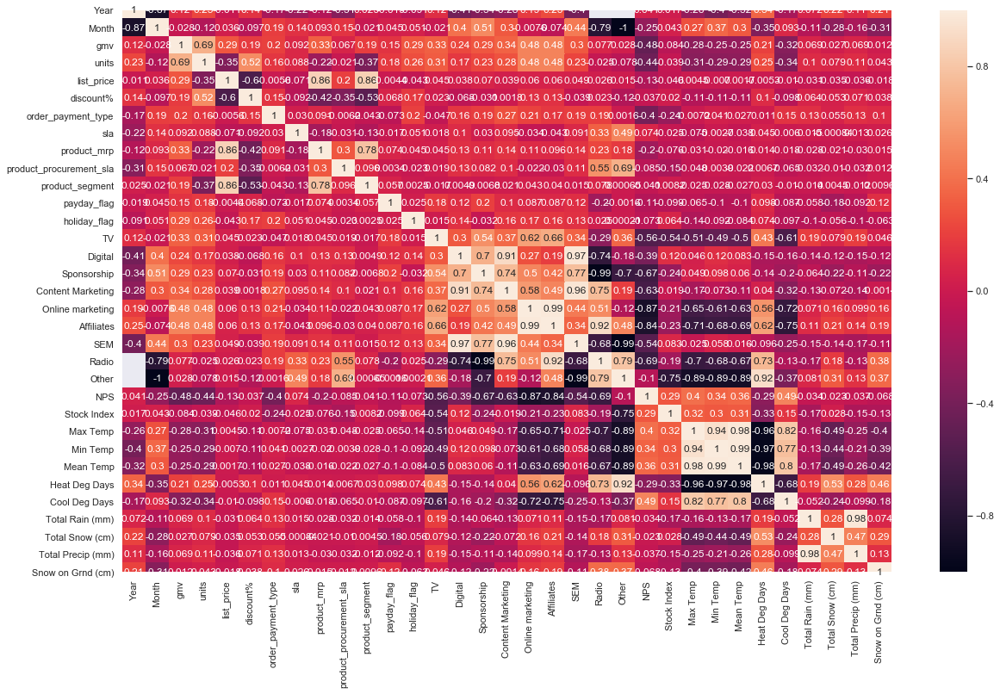

In [253]:
plt.figure(figsize=(20,12))
sns.set(font_scale = 1)
sns.heatmap(data_week.corr(),annot=True)
plt.show()

#### Heat map for correlation between columns of data_week

## Dividing dataset into three datasets
    1. Camera Accessory
    2. Home Audio
    3. Gaming accessory

In [254]:
# Camera Accessory
cam_acc = data_week[data_week['product_analytic_sub_category'] == 'CameraAccessory']

# Home Audio
home_aud = data_week[data_week['product_analytic_sub_category'] == 'HomeAudio']

# Gaming Accessory
game_acc = data_week[data_week['product_analytic_sub_category'] == 'GamingAccessory']

### Features for modelling
##### Our analysis is around how revenue is impacted by different marketing KPIs, hence we will drop features 'Week', 'product_analytic_sub_category', 'Year', 'Month'.
##### We will also drop list_price and units, since GMV = list_price x units

In [255]:
# dropping columns Week, product_analytic_sub_category, Year, Month which won't be part of modeling
cam_acc.drop(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'list_price', 'units'], axis=1, inplace = True)
home_aud.drop(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'list_price', 'units'], axis=1, inplace = True)
game_acc.drop(['Week', 'product_analytic_sub_category', 'Year', 'Month', 'list_price', 'units'], axis=1, inplace = True)

In [256]:
print("Shape of Camera Accessory : ", cam_acc.shape)
print("Shape of Home Audio : ", home_aud.shape)
print("Shape of Gaming Accessory : ", game_acc.shape)

Shape of Camera Accessory :  (52, 29)
Shape of Home Audio :  (50, 29)
Shape of Gaming Accessory :  (53, 29)


In [257]:
# Replacing NULL values with 0
cam_acc.fillna(0, inplace=True)
home_aud.fillna(0, inplace=True)
game_acc.fillna(0, inplace=True)

## Building Models
    We have already selected all the features based on business requirement, hence we won't be performing feature selection.
    Since we will be using Linear Regression model extensively through out all modelling, we will create a function which will avoid duplicate effort of writing same code again and again

### Create Linear Regression function

In [258]:
def fx_linear_regression(df, target_col, random_state_var): 
    
    # train test split
    # importing required library
    from sklearn.model_selection import train_test_split

    # splitting train and test 70:30 ratio
    train, test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = random_state_var)

    # Rescaling Feature using standard scaling
    # importing library
    from sklearn.preprocessing import StandardScaler

    scaler = StandardScaler()
    train.iloc[:,:] = scaler.fit_transform(train)
    test.iloc[:,:] = scaler.transform(test)
    
    # X and y split for model building
    
    y_train = train.pop(target_col)
    X_train = train
    
    y_test = test.pop(target_col)
    X_test = test
    
    # Building linear regression model 
    from sklearn.linear_model import LinearRegression
    from sklearn.metrics import r2_score
    from sklearn.metrics import mean_squared_error

    # linear regression model building
    lr_model = LinearRegression().fit(X_train, y_train)

    # predicting y test
    y_test_pred = lr_model.predict(X_test)

    # R2 score on test
    R2_Score = format(r2_score(y_test, y_test_pred))
    
    # Mean Squared Error on test
    Mean_Squared_Error = format(mean_squared_error(y_test, y_test_pred))
    
    # Features paert of this model
    features = X_test.columns
    
    # returning model, R2 score, MSE and features on which model is built
    return lr_model, R2_Score, Mean_Squared_Error, features, y_test, y_test_pred

### Create Feature Importance function

In [259]:
def fx_feature_importance(sub_product, lr_model, features, lag_col = 0): 
    
    print(sub_product," Feature Importance")
    
    # feature importance based on coefficients from the model
    lr_model_parameters = list(lr_model.coef_)
    lr_model_parameters.insert(0, lr_model.intercept_)
    lr_model_parameters = [round(x, 4) for x in lr_model_parameters]
    cols = features
    cols = cols.insert(0, "constant")
    lr_coef = list(zip(cols, lr_model_parameters))
    
    # print(lr_coef)
    
    # converting features along with coefficient into dataframe
    lr_coef_df = pd.DataFrame(lr_coef)
    lr_coef_df = lr_coef_df.rename(columns= {0:'Features',1: 'Coefficients'})
    lr_coef_df = lr_coef_df.iloc[1:,:]
    lr_coef_df = lr_coef_df.loc[lr_coef_df['Coefficients']!=0.0]
    lr_coef_df = lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
    # print(lr_coef_df)
    
    # checking if it is Koyck Model than we need to consider carry over effect of advertising which is β1 * µ/(1-µ)
    # current effect of Koyck Model is β1, hence total effect will be,
    # total effect = β1 + (β1 * µ/(1-µ)) = β1/(1-µ)
    if lag_col != 0:        
        var_u = lr_coef_df.loc[lr_coef_df['Features'] == lag_col].Coefficients
        # print(var_u)
        # print(var_u.dtype)
        
        # Updating coefficients to account for carry over effect in case of Koyck Model
        lr_coef_df['Coefficients'] = lr_coef_df['Coefficients'].apply(lambda x : x/(1-var_u))

    # to display dataframe in better formatting
    from IPython.display import display, HTML
    display(HTML(lr_coef_df.to_html()))
    
    # visualization
    plt.figure(figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k', frameon='True')
    ax = sns.barplot(y='Features', x='Coefficients', palette='hls', data=lr_coef_df, estimator=np.sum)

    ax.set_title('Feature Importance', fontsize=14, color = 'b')
    plt.xlabel('Coefficients', fontsize=12)
    plt.ylabel('Features', fontsize=12)

    plt.tight_layout()
    plt.show() 
    
    # visualize top 5 and bottom 5
    plt.figure(figsize=(15, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')
    ax = plt.subplot(1,2,1)
    ax = sns.barplot(y='Features', x='Coefficients', palette='hls', data=lr_coef_df.head(5), estimator=np.sum)
    ax.set_title('Top 5 Feature', fontsize=14, color='b')
    plt.xlabel('Coefficients', fontsize=12)
    plt.ylabel('Features', fontsize=12) 
    
    ax = plt.subplot(1,2,2)
    ax = sns.barplot(y='Features', x='Coefficients', palette='hls', data=lr_coef_df.tail(5), estimator=np.sum)
    ax.set_title('Bottom 5 Feature', fontsize=14, color='b')
    plt.xlabel('Coefficients', fontsize=12)
    plt.ylabel('Features', fontsize=12)

    plt.tight_layout(pad = 2.0)
    plt.show() 
    
    # returning dataframe with features and coefficient which will be consumed while evaluating models
    return lr_coef_df

### Creating Error Terms and Visualisation function
    This function will help in visualising predicted values against actual values and also error terms

In [260]:
def fx_model_eval(actual, predicted):
    
    plt.figure(figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
    sns.set_style("white")
    sns.set_context("paper")
    
    # Plotting line plot of y_test and y_pred
    plt.subplot(3, 2, 1)
    axis_cnt = [i for i in range(1,len(actual)+1,1)]
    plt.plot(axis_cnt, actual, color="blue", linewidth=2, linestyle="-")
    plt.plot(axis_cnt, predicted, color="red",  linewidth=2, linestyle="-")
    plt.title('Actual vs Predicted', fontsize=14, color = 'b')
    plt.xlabel('Index', fontsize=12)                               
    plt.ylabel('Views', fontsize=12) 

    # Plotting scatter plot of y_test vs y_pred
    plt.subplot(3, 2, 2)
    plt.scatter(actual, predicted)
    plt.title('y_actual vs y_predicted', fontsize=14, color = 'b')
    plt.xlabel('y_actual', fontsize=12)
    plt.ylabel('y_pred', fontsize=12) 
    
    # Plotting error terms
    plt.subplot(3, 2, 3)
    axis_cnt = [i for i in range(1,len(actual)+1,1)]
    plt.scatter(axis_cnt, actual - predicted)
    plt.title('Error Terms Scatter Plot', fontsize=14, color = 'b')
    plt.xlabel('Index', fontsize=12)
    plt.ylabel('y_act - y_pred', fontsize=12) 

    # Plotting histogram of error terms to understand spread
    plt.subplot(3, 2, 4)
    sns.distplot((actual - predicted), bins = 20)
    plt.title('Error Terms Histogram', fontsize = 14, color = 'b')
    plt.xlabel('Errors', fontsize = 12) 
    
    # Plotting best fitted line between y_actual vs y_pred
    plt.subplot(3, 2, 5)
    sns.regplot(actual, predicted)
    plt.title('Best Fitted Line', fontsize=14, color = 'b')
    plt.xlabel('y_actual', fontsize=12)
    plt.ylabel('y_pred', fontsize=12) 
    
    # Spacing between subplots
    plt.tight_layout(pad=2.0)
    
    plt.show()

### Creating lag variable function
    Objective of this function is to create lag variables, this will take dataframe, column names on which lag needs to be created, number of weeks for lag. this will return dataframe including lag variable

In [261]:
def fx_lag_variable(df, col_name_list, week_n):
    # to bring consistency lets add the lag variable just after the col on which it is lagging
    for col_name in col_name_list:
        col_loc = df.columns.get_loc(col_name) + 1
        df.insert(loc = col_loc, column= col_name + '_lag_' + np.str(week_n), value = df[col_name].shift(week_n))
    
    #replacing NULL value with 0, since initial columns will have NULL value as they don't have preceding weeks
    df.fillna(value=0, inplace=True)
    
    # returning dataframe with lag variable
    return df

## Camera Accessory - Modelling
Creating dataframe to compare different models

In [262]:
# Creating dataframe to compare different models
cam_acc_model_eval = pd.DataFrame(columns=['Model', 'R2 Score', 'Mean Squared Error', \
                                'Top Feature 1', 'Top Feature 2', 'Top Feature 3', 'Top Feature 4', 'Top Feature 5', \
                               'Bottom Feature 1', 'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', \
                               'Bottom Feature 5'])

In [263]:
cam_acc_model_eval.shape

(0, 13)

### Linear Model for Camera Accessory

In [264]:
# Creating copy of dataset
ca_lm = cam_acc.copy()

In [265]:
# using linear regression model function extract model, R2 score, MSE and features
# ca_lm_model, ca_lm_R2_Score, ca_lm_Mean_Squared_Error, ca_lm_features = fx_linear_regression(ca_lm,'gmv',56)
ca_lm_model, ca_lm_R2_Score, ca_lm_Mean_Squared_Error, ca_lm_features, ca_lm_actual, ca_lm_pred = fx_linear_regression(ca_lm,'gmv',56)

In [266]:
print("R2 Score : ", round(pd.to_numeric(ca_lm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ca_lm_Mean_Squared_Error),4))
print("Features : ", ca_lm_features)

R2 Score :  0.4165
Mean Squared Error :  0.4663
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Camera Accessory - Simple Linear Regression
#### R2 Score : 0.4165
#### Mean Squared Error : 0.4663

#### Feature importance for Camera Accessory using Simple Linear Regression - Calculation & Visualization

Camera Accessory  Feature Importance


,Features,Coefficients
16,Radio,263.7512
10,Digital,181.2889
12,Content Marketing,174.9470
13,Online marketing,165.9658
9,TV,162.7304
22,Mean Temp,2.0657
1,discount%,1.5981
5,product_procurement_sla,1.2066
3,sla,0.8769
4,product_mrp,0.3359


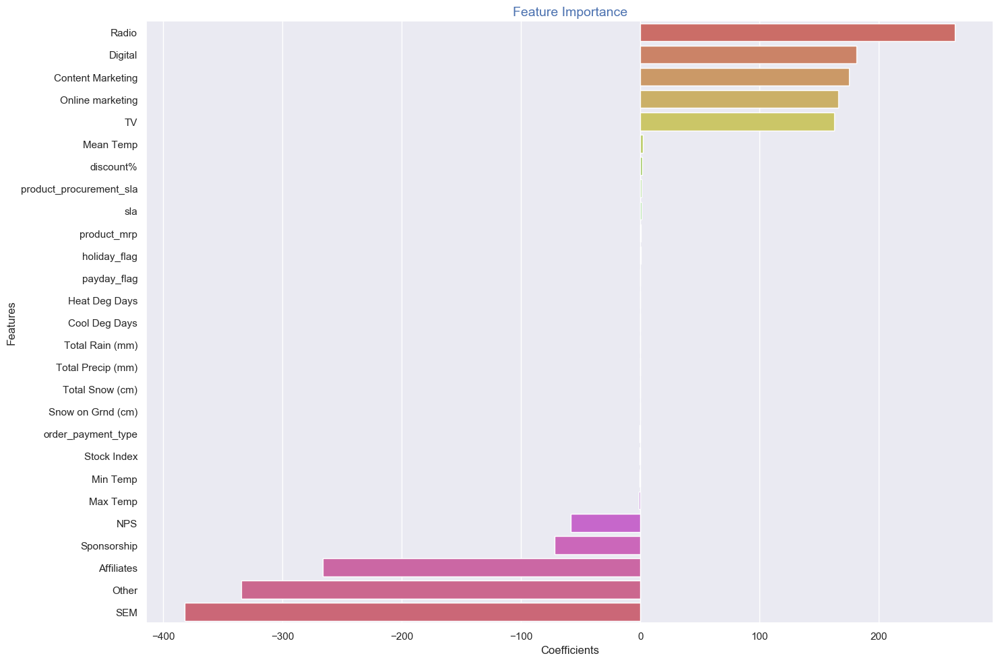

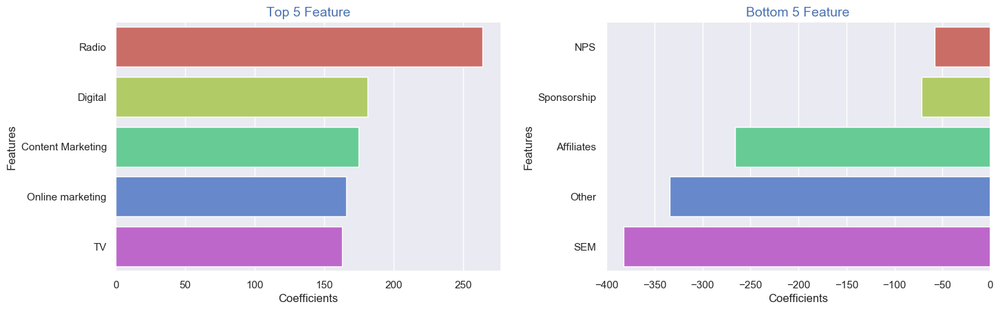

In [267]:
#fx_feature_importance("Camera Accessory", ca_lm_model, ca_lm_features)
ca_lm_features = fx_feature_importance("Camera Accessory", ca_lm_model, ca_lm_features)

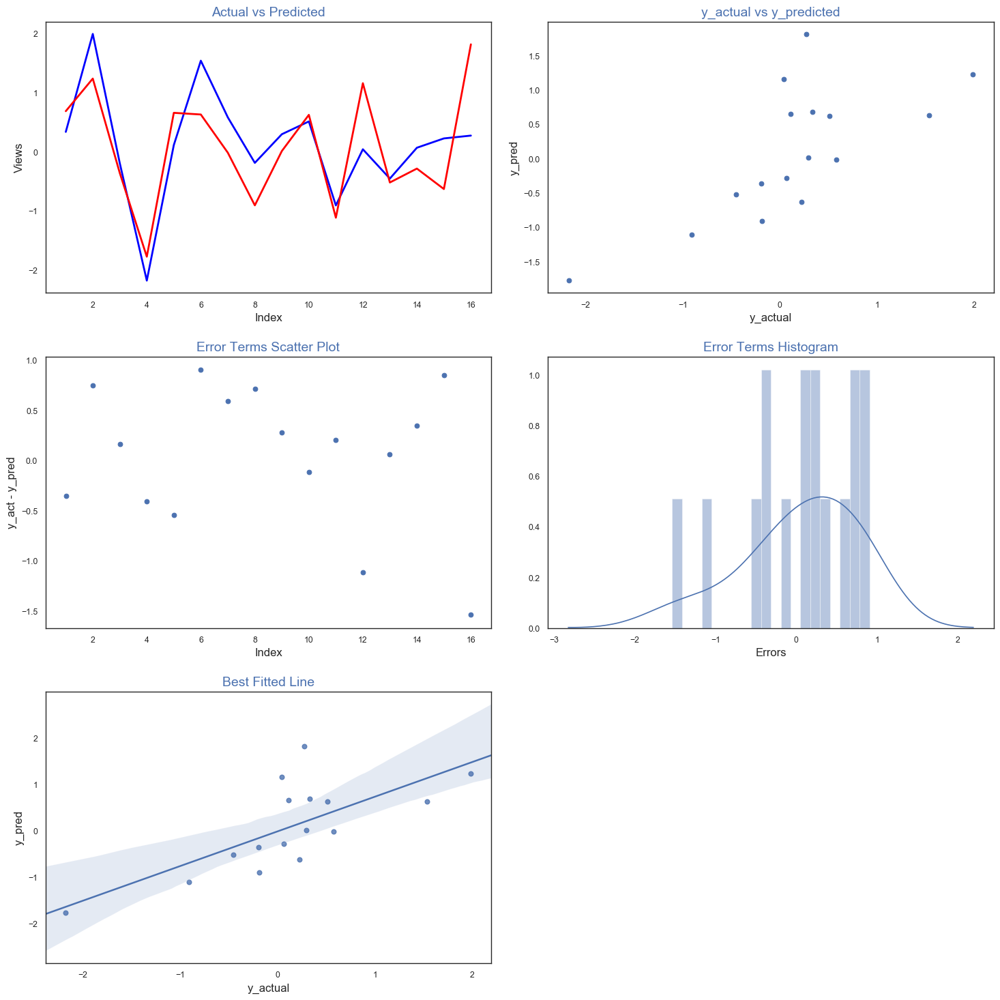

In [268]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ca_lm_actual, ca_lm_pred)

In [269]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Simple Linear Model',round(pd.to_numeric(ca_lm_R2_Score),4), round(pd.to_numeric(ca_lm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ca_lm_features[:5].Features) + list(ca_lm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.4165,0.4663,Radio,Digital,Content Marketing,Online marketing,TV,NPS,Sponsorship,Affiliates,Other,SEM


In [270]:
# appending row to the dataframe
cam_acc_model_eval = cam_acc_model_eval.append(df_row, ignore_index = True)
cam_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.4165,0.4663,Radio,Digital,Content Marketing,Online marketing,TV,NPS,Sponsorship,Affiliates,Other,SEM


### Koyck Model for Camera Accessory

In [271]:
# Creating copy of dataset
ca_km = cam_acc.copy()

#### Creating a new variable which is lag of target variable, here in this scenario it will be GMV value of 1 week earlier

In [272]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ca_km = fx_lag_variable(ca_km, ['gmv'], 1)

In [273]:
ca_km.head()

,gmv,gmv_lag_1,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
78,15731.0,0.0,50.620769,0,2.230769,1414.500000,2.884615,0,0,0,...,1177.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
81,3975505.0,15731.0,43.971082,1,7.067365,2448.181152,2.780803,0,0,0,...,1177.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
84,4390316.0,3975505.0,44.334867,1,6.436647,2464.249838,2.812865,0,1,1,...,1177.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
87,4368719.0,4390316.0,43.608101,1,6.437069,2495.293789,2.865922,0,0,0,...,1177.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
90,2790458.0,4368719.0,42.999613,1,6.394240,2372.951341,2.823237,0,0,0,...,1177.0,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [274]:
# using linear regression model function extract model, R2 score, MSE and features
ca_km_model, ca_km_R2_Score, ca_km_Mean_Squared_Error, ca_km_features, ca_km_actual, ca_km_pred = fx_linear_regression(ca_km,'gmv',41)

In [275]:
print("R2 Score : ", round(pd.to_numeric(ca_km_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ca_km_Mean_Squared_Error),4))
print("Features : ",ca_km_features)

R2 Score :  0.3329
Mean Squared Error :  1.066
Features :  Index(['gmv_lag_1', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Camera Accessory - Koyck Model
#### R2 Score : 0.3329
#### Mean Squared Error : 1.066

#### Feature importance for Camera Accessory using Koyck Model - Calculation & Visualization

Camera Accessory  Feature Importance


,Features,Coefficients
17,Radio,179.266640
14,Online marketing,116.503580
10,TV,104.762734
11,Digital,95.454516
13,Content Marketing,88.681692
2,discount%,1.190643
4,sla,0.950854
6,product_procurement_sla,0.619528
25,Cool Deg Days,0.278519
23,Mean Temp,0.270708


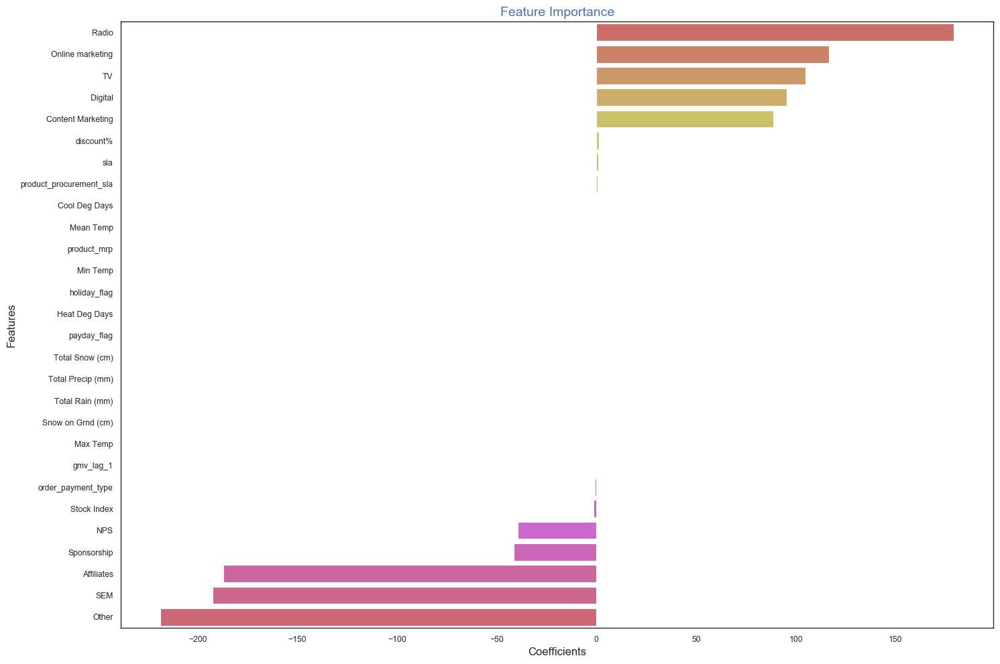

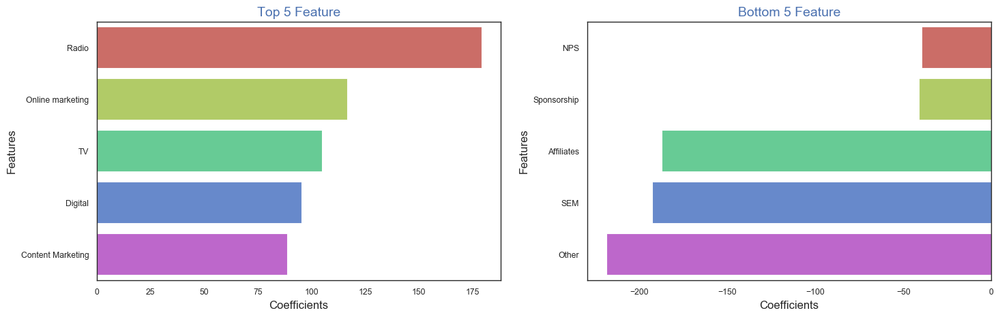

In [276]:
ca_km_features = fx_feature_importance("Camera Accessory", ca_km_model, ca_km_features, 'gmv_lag_1')

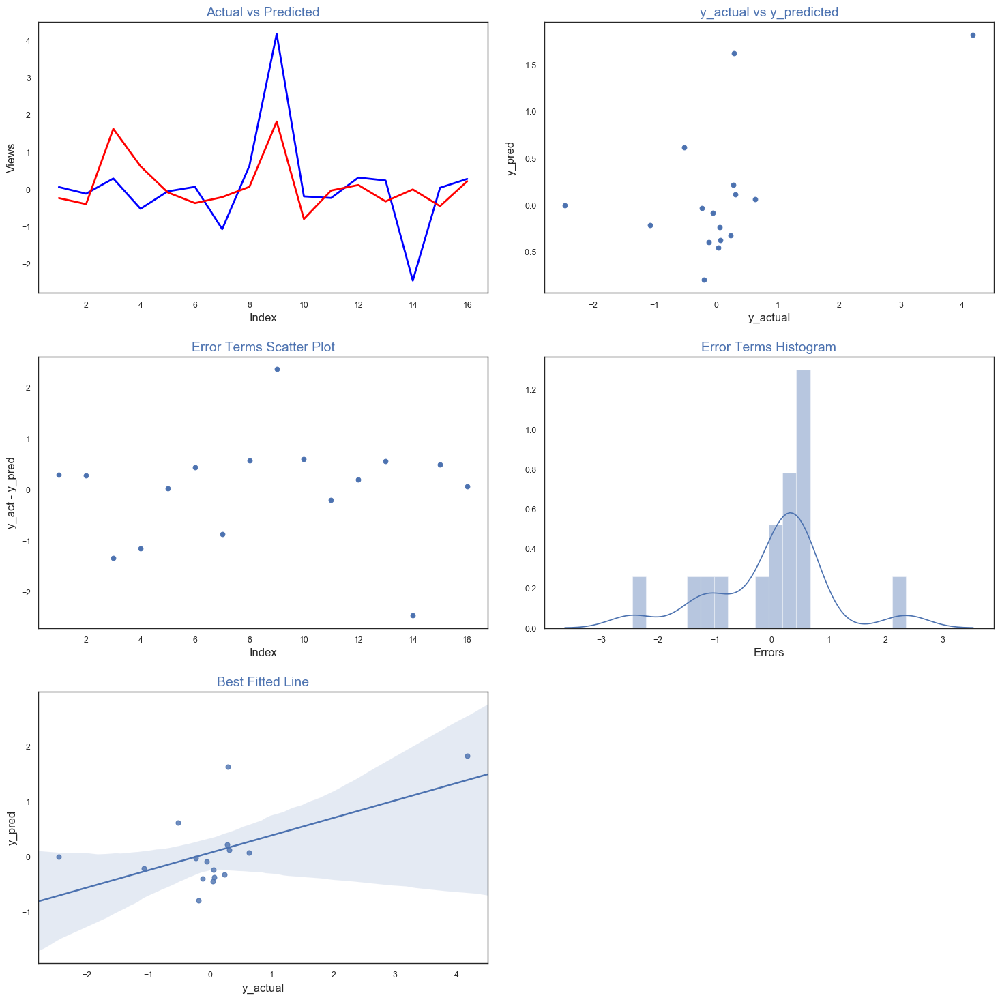

In [277]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ca_km_actual, ca_km_pred)

In [278]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Koyck Model', round(pd.to_numeric(ca_km_R2_Score),4), round(pd.to_numeric(ca_km_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ca_km_features[:5].Features) + list(ca_km_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Koyck Model,0.3329,1.066,Radio,Online marketing,TV,Digital,Content Marketing,NPS,Sponsorship,Affiliates,SEM,Other


In [279]:
# appending row to the dataframe
cam_acc_model_eval = cam_acc_model_eval.append(df_row, ignore_index = True)
cam_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.4165,0.4663,Radio,Digital,Content Marketing,Online marketing,TV,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3329,1.066,Radio,Online marketing,TV,Digital,Content Marketing,NPS,Sponsorship,Affiliates,SEM,Other


### Distributed Lag Model for Camera Accessory

In [280]:
# Creating copy of dataset
ca_dlm = cam_acc.copy()

In [281]:
col_names = ca_dlm.columns
col_names

Index(['gmv', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

#### Creating 3 week lag on all variables

In [282]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ca_dlm = fx_lag_variable(ca_dlm, col_names, 3)

In [283]:
ca_dlm.head()

,gmv,gmv_lag_3,discount%,discount%_lag_3,order_payment_type,order_payment_type_lag_3,sla,sla_lag_3,product_mrp,product_mrp_lag_3,...,Cool Deg Days,Cool Deg Days_lag_3,Total Rain (mm),Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_3
78,15731.0,0.0,50.620769,0.000000,0,0.0,2.230769,0.000000,1414.500000,0.000000,...,1.460000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0
81,3975505.0,0.0,43.971082,0.000000,1,0.0,7.067365,0.000000,2448.181152,0.000000,...,2.383333,0.000000,4.416667,0.000000,0.0,0.0,4.416667,0.000000,0.0,0.0
84,4390316.0,0.0,44.334867,0.000000,1,0.0,6.436647,0.000000,2464.249838,0.000000,...,5.183333,0.000000,1.400000,0.000000,0.0,0.0,1.400000,0.000000,0.0,0.0
87,4368719.0,15731.0,43.608101,50.620769,1,0.0,6.437069,2.230769,2495.293789,1414.500000,...,5.060000,1.460000,0.900000,0.000000,0.0,0.0,0.900000,0.000000,0.0,0.0
90,2790458.0,3975505.0,42.999613,43.971082,1,1.0,6.394240,7.067365,2372.951341,2448.181152,...,6.566667,2.383333,4.633333,4.416667,0.0,0.0,4.633333,4.416667,0.0,0.0


#### Creating 2 week lag on all variables

In [284]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ca_dlm = fx_lag_variable(ca_dlm, col_names, 2)

In [285]:
ca_dlm.head()

,gmv,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_2,order_payment_type_lag_3,sla,...,Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
78,15731.0,0.0,0.0,50.620769,0.000000,0.000000,0,0.0,0.0,2.230769,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0
81,3975505.0,0.0,0.0,43.971082,0.000000,0.000000,1,0.0,0.0,7.067365,...,0.000000,0.0,0.0,0.0,4.416667,0.000000,0.000000,0.0,0.0,0.0
84,4390316.0,15731.0,0.0,44.334867,50.620769,0.000000,1,0.0,0.0,6.436647,...,0.000000,0.0,0.0,0.0,1.400000,0.000000,0.000000,0.0,0.0,0.0
87,4368719.0,3975505.0,15731.0,43.608101,43.971082,50.620769,1,1.0,0.0,6.437069,...,0.000000,0.0,0.0,0.0,0.900000,4.416667,0.000000,0.0,0.0,0.0
90,2790458.0,4390316.0,3975505.0,42.999613,44.334867,43.971082,1,1.0,1.0,6.394240,...,4.416667,0.0,0.0,0.0,4.633333,1.400000,4.416667,0.0,0.0,0.0


#### Creating 1 week lag on all variables

In [286]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ca_dlm = fx_lag_variable(ca_dlm, col_names, 1)

In [287]:
ca_dlm.head()

,gmv,gmv_lag_1,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_1,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_1,...,Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_1,Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_1,Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
78,15731.0,0.0,0.0,0.0,50.620769,0.000000,0.000000,0.000000,0,0.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
81,3975505.0,15731.0,0.0,0.0,43.971082,50.620769,0.000000,0.000000,1,0.0,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
84,4390316.0,3975505.0,15731.0,0.0,44.334867,43.971082,50.620769,0.000000,1,1.0,...,0.0,0.0,1.400000,4.416667,0.000000,0.000000,0.0,0.0,0.0,0.0
87,4368719.0,4390316.0,3975505.0,15731.0,43.608101,44.334867,43.971082,50.620769,1,1.0,...,0.0,0.0,0.900000,1.400000,4.416667,0.000000,0.0,0.0,0.0,0.0
90,2790458.0,4368719.0,4390316.0,3975505.0,42.999613,43.608101,44.334867,43.971082,1,1.0,...,0.0,0.0,4.633333,0.900000,1.400000,4.416667,0.0,0.0,0.0,0.0


In [288]:
# using linear regression model function extract model, R2 score, MSE and features
ca_dlm_model, ca_dlm_R2_Score, ca_dlm_Mean_Squared_Error, ca_dlm_features, ca_dlm_actual, ca_dlm_pred = fx_linear_regression(ca_dlm,'gmv',51)

In [289]:
print("R2 Score : ", round(pd.to_numeric(ca_dlm_R2_Score),4))
print("Mean Squared Error : ",round(pd.to_numeric(ca_dlm_Mean_Squared_Error),4))
print("Features : ",ca_dlm_features)

R2 Score :  0.4764
Mean Squared Error :  0.9837
Features :  Index(['gmv_lag_1', 'gmv_lag_2', 'gmv_lag_3', 'discount%', 'discount%_lag_1',
       'discount%_lag_2', 'discount%_lag_3', 'order_payment_type',
       'order_payment_type_lag_1', 'order_payment_type_lag_2',
       ...
       'Total Snow (cm)_lag_2', 'Total Snow (cm)_lag_3', 'Total Precip (mm)',
       'Total Precip (mm)_lag_1', 'Total Precip (mm)_lag_2',
       'Total Precip (mm)_lag_3', 'Snow on Grnd (cm)',
       'Snow on Grnd (cm)_lag_1', 'Snow on Grnd (cm)_lag_2',
       'Snow on Grnd (cm)_lag_3'],
      dtype='object', length=115)


### Camera Accessory - Distributed Lag Model
#### R2 Score : 0.4764
#### Mean Squared Error : 0.9837

#### Feature importance for Camera Accessory using Distributed Lag Model - Calculation & Visualization

Camera Accessory  Feature Importance


,Features,Coefficients
12,sla,0.3414
28,payday_flag,0.2588
95,Heat Deg Days_lag_3,0.2438
20,product_procurement_sla,0.2299
29,payday_flag_lag_1,0.2277
82,Max Temp_lag_2,0.2223
16,product_mrp,0.2221
44,Sponsorship,0.2118
7,discount%_lag_3,0.2086
6,discount%_lag_2,0.1994


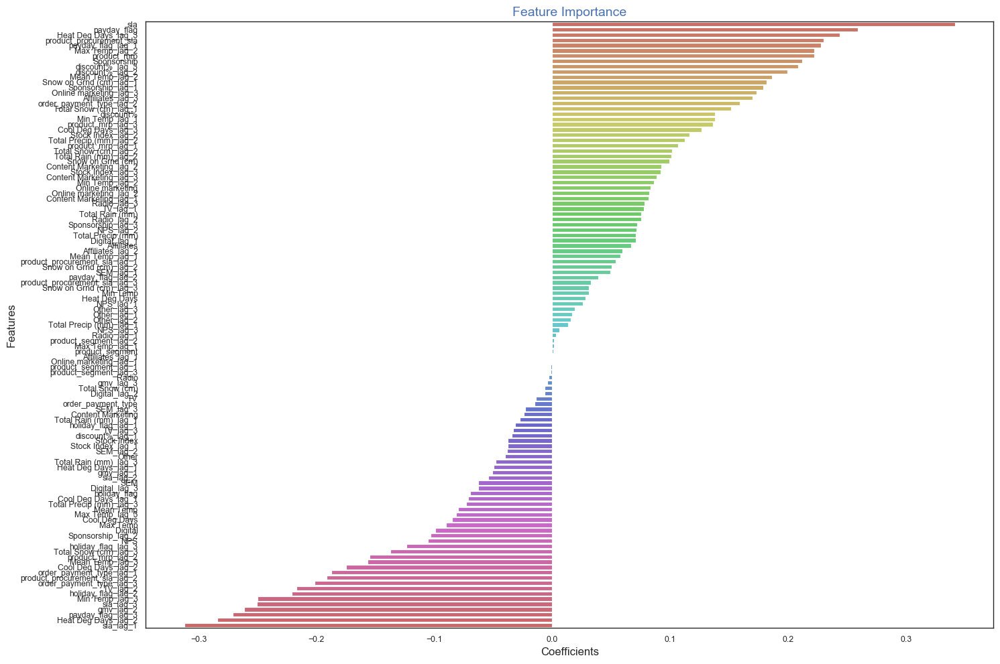

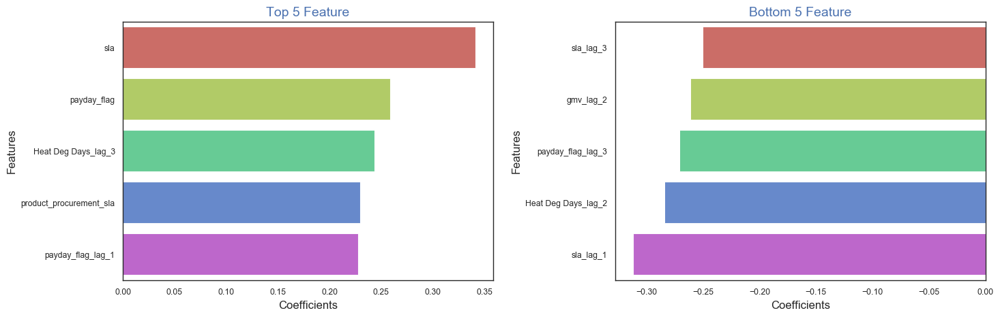

In [290]:
ca_dlm_features = fx_feature_importance("Camera Accessory", ca_dlm_model, ca_dlm_features)

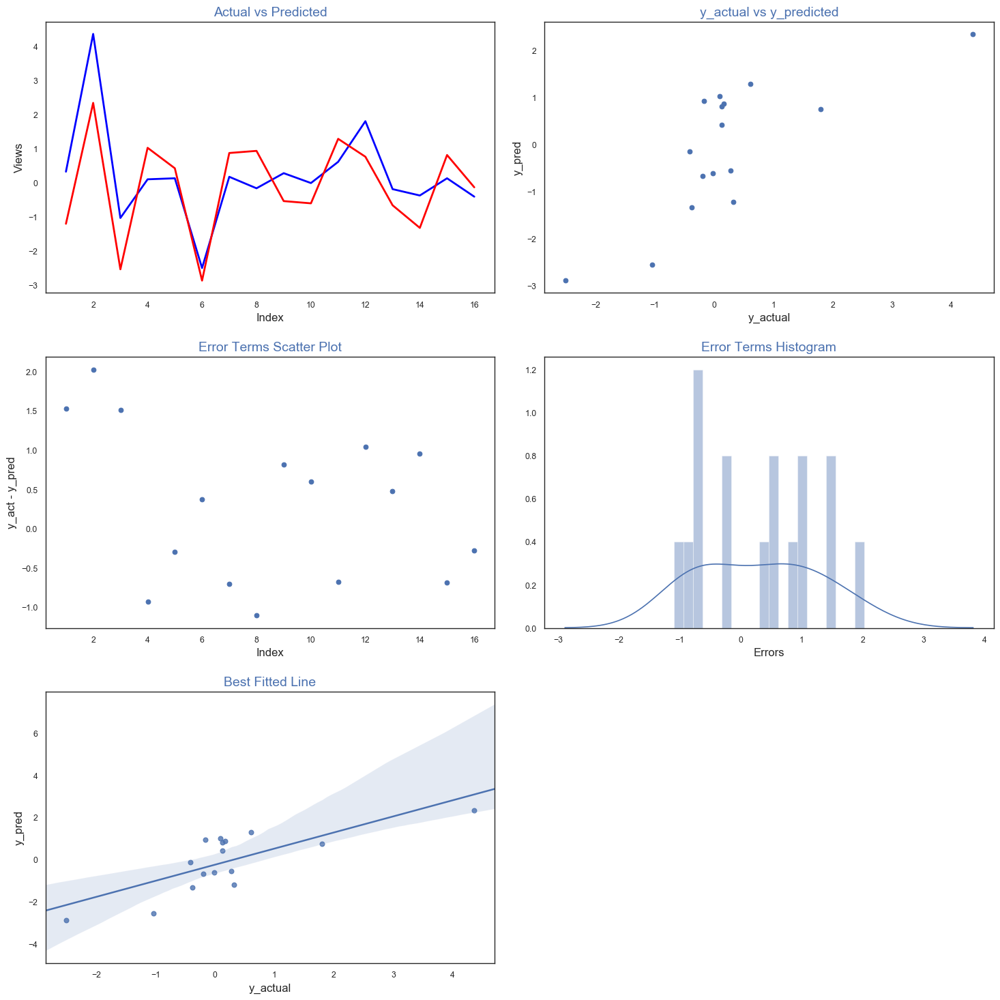

In [291]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ca_dlm_actual, ca_dlm_pred)

In [292]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Distributed Lag Model', round(pd.to_numeric(ca_dlm_R2_Score),4), round(pd.to_numeric(ca_dlm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ca_dlm_features[:5].Features) + list(ca_dlm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Distributed Lag Model,0.4764,0.9837,sla,payday_flag,Heat Deg Days_lag_3,product_procurement_sla,payday_flag_lag_1,sla_lag_3,gmv_lag_2,payday_flag_lag_3,Heat Deg Days_lag_2,sla_lag_1


In [293]:
# appending row to the dataframe
cam_acc_model_eval = cam_acc_model_eval.append(df_row, ignore_index = True)
cam_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.4165,0.4663,Radio,Digital,Content Marketing,Online marketing,TV,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3329,1.066,Radio,Online marketing,TV,Digital,Content Marketing,NPS,Sponsorship,Affiliates,SEM,Other
2,Distributed Lag Model,0.4764,0.9837,sla,payday_flag,Heat Deg Days_lag_3,product_procurement_sla,payday_flag_lag_1,sla_lag_3,gmv_lag_2,payday_flag_lag_3,Heat Deg Days_lag_2,sla_lag_1


### Multiplicative Model for Camera Accessory

In [294]:
# Creating copy of dataset
ca_mm = cam_acc.copy()

#### For multiplicative model we need to take log of both dependent and independent variables

In [295]:
ca_mm = ca_mm.applymap(lambda x: np.log(x))
ca_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
78,9.663389,3.924362,-inf,0.802346,7.254531,1.059392,-inf,-inf,-inf,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,-inf,-inf,-inf,-inf
81,15.195662,3.783532,0.0,1.955488,7.803101,1.022740,-inf,-inf,-inf,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,-inf,1.485385,-inf
84,15.294912,3.791771,0.0,1.862008,7.809643,1.034204,-inf,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,-inf,1.645448,0.336472,-inf,0.336472,-inf
87,15.289980,3.775243,0.0,1.862073,7.822162,1.052890,-inf,-inf,-inf,-1.535583,...,7.070724,3.392829,2.809403,3.138100,-inf,1.621366,-0.105361,-inf,-0.105361,-inf
90,14.841716,3.761191,0.0,1.855398,7.771890,1.037884,-inf,-inf,-inf,-1.535583,...,7.070724,3.452630,2.862201,3.201391,-inf,1.882006,1.533277,-inf,1.533277,-inf


In [296]:
# replacing inf, -inf and NULL values with 0
ca_mm = ca_mm.replace([np.inf, -np.inf, np.nan], 0)
ca_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
78,9.663389,3.924362,0.0,0.802346,7.254531,1.059392,0.0,0.0,0.0,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
81,15.195662,3.783532,0.0,1.955488,7.803101,1.022740,0.0,0.0,0.0,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
84,15.294912,3.791771,0.0,1.862008,7.809643,1.034204,0.0,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
87,15.289980,3.775243,0.0,1.862073,7.822162,1.052890,0.0,0.0,0.0,-1.535583,...,7.070724,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
90,14.841716,3.761191,0.0,1.855398,7.771890,1.037884,0.0,0.0,0.0,-1.535583,...,7.070724,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


In [297]:
# using linear regression model function extract model, R2 score, MSE and features
ca_mm_model, ca_mm_R2_Score, ca_mm_Mean_Squared_Error, ca_mm_features, ca_mm_actual, ca_mm_pred = fx_linear_regression(ca_mm,'gmv',41)

In [298]:
print("R2 Score : ", round(pd.to_numeric(ca_mm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ca_mm_Mean_Squared_Error),4))
print("Features : ",ca_mm_features)

R2 Score :  0.9305
Mean Squared Error :  0.0595
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Camera Accessory - Multiplicative Model
#### R2 Score : 0.9305
#### Mean Squared Error : 0.0595

#### Feature importance for Camera Accessory using Multiplicative Model - Calculation & Visualization

Camera Accessory  Feature Importance


,Features,Coefficients
13,Online marketing,36.2494
9,TV,1.3294
10,Digital,0.6402
3,sla,0.4486
1,discount%,0.2078
5,product_procurement_sla,0.2008
17,Other,0.1103
18,NPS,0.1034
21,Min Temp,0.0959
27,Total Precip (mm),0.0771


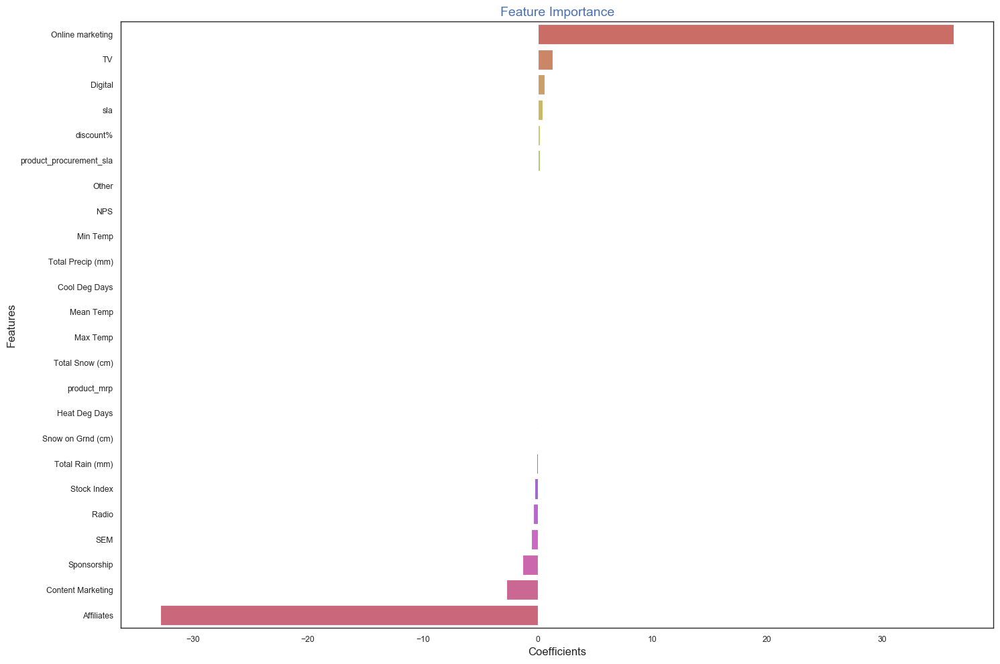

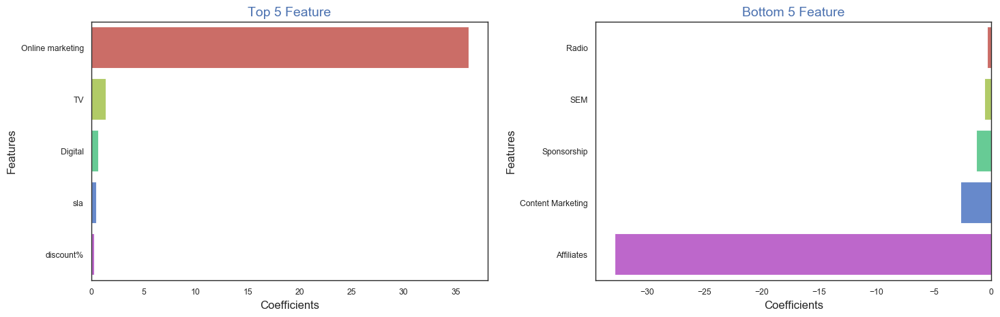

In [299]:
ca_mm_features = fx_feature_importance("Camera Accessory", ca_mm_model, ca_mm_features)

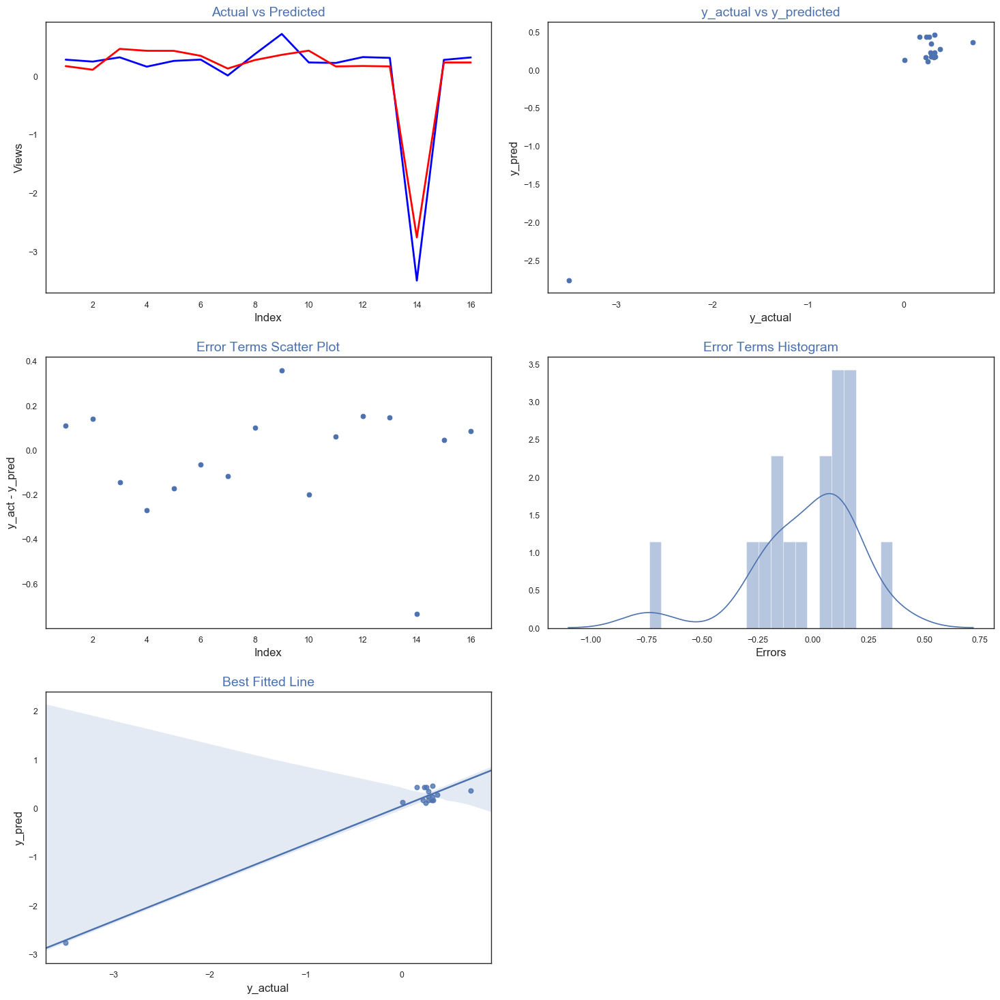

In [300]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ca_mm_actual, ca_mm_pred)

In [301]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Multiplicative Model', round(pd.to_numeric(ca_mm_R2_Score),4), round(pd.to_numeric(ca_mm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ca_mm_features[:5].Features) + list(ca_mm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Multiplicative Model,0.9305,0.0595,Online marketing,TV,Digital,sla,discount%,Radio,SEM,Sponsorship,Content Marketing,Affiliates


In [302]:
# appending row to the dataframe
cam_acc_model_eval = cam_acc_model_eval.append(df_row, ignore_index = True)
cam_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.4165,0.4663,Radio,Digital,Content Marketing,Online marketing,TV,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3329,1.066,Radio,Online marketing,TV,Digital,Content Marketing,NPS,Sponsorship,Affiliates,SEM,Other
2,Distributed Lag Model,0.4764,0.9837,sla,payday_flag,Heat Deg Days_lag_3,product_procurement_sla,payday_flag_lag_1,sla_lag_3,gmv_lag_2,payday_flag_lag_3,Heat Deg Days_lag_2,sla_lag_1
3,Multiplicative Model,0.9305,0.0595,Online marketing,TV,Digital,sla,discount%,Radio,SEM,Sponsorship,Content Marketing,Affiliates


## <font color = red>Camera Accessory Model Observation</font>
#### Based on R2 Score the model which is best suited for Camera Accessory is Multiplicative Model with R2 Score of 0.9305.
#### Based on this to boost revenue from camera accessory marketing spend must be done on Online Marketing, TV, Digital and Discount% and should be avoided from Radio, SEM, Sponsorship, Content Marketing and Affiliates.
--------------------------------------------------------------------------------------------------------------------

## Home Audio - Modelling
Creating dataframe to compare different models

In [303]:
# Creating dataframe to compare different models
home_aud_model_eval = pd.DataFrame(columns=['Model', 'R2 Score', 'Mean Squared Error', \
                                'Top Feature 1', 'Top Feature 2', 'Top Feature 3', 'Top Feature 4', 'Top Feature 5', \
                               'Bottom Feature 1', 'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', \
                               'Bottom Feature 5'])

In [304]:
home_aud_model_eval.shape

(0, 13)

### Linear Model for Home Audio

In [305]:
# Creating copy of dataset
ha_lm = home_aud.copy()

In [306]:
# using linear regression model function extract model, R2 score, MSE and features
ha_lm_model, ha_lm_R2_Score, ha_lm_Mean_Squared_Error, ha_lm_features, ha_lm_actual, ha_lm_pred = fx_linear_regression(ha_lm,'gmv',34)

In [307]:
print("R2 Score : ", round(pd.to_numeric(ha_lm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ha_lm_Mean_Squared_Error),4))
print("Features : ",ha_lm_features)

R2 Score :  0.6881
Mean Squared Error :  2.4515
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Home Audio - Simple Linear Regression
#### R2 Score : 0.6881
#### Mean Squared Error : 2.4515

#### Feature importance for Home Audio using Simple Linear Regression - Calculation & Visualization

Home Audio  Feature Importance


,Features,Coefficients
16,Radio,57.5503
10,Digital,43.9971
9,TV,30.1075
12,Content Marketing,28.0902
13,Online marketing,20.4122
21,Min Temp,1.3423
4,product_mrp,0.9121
23,Heat Deg Days,0.7445
1,discount%,0.6915
3,sla,0.5920


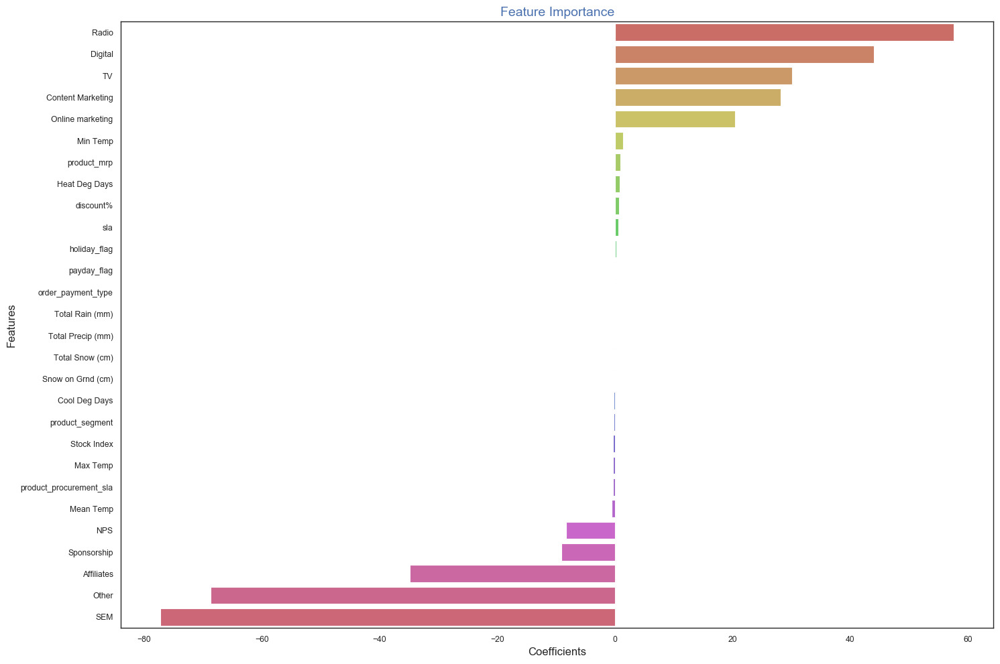

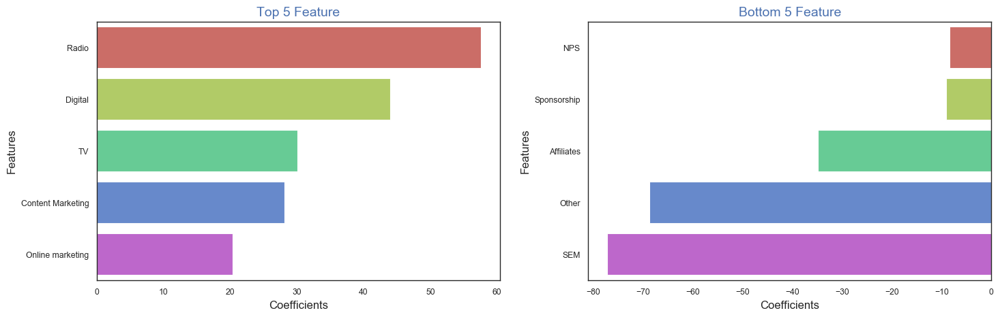

In [308]:
#fx_feature_importance("Home Audio", ha_lm_model, ha_lm_features)
ha_lm_features = fx_feature_importance("Home Audio", ha_lm_model, ha_lm_features)

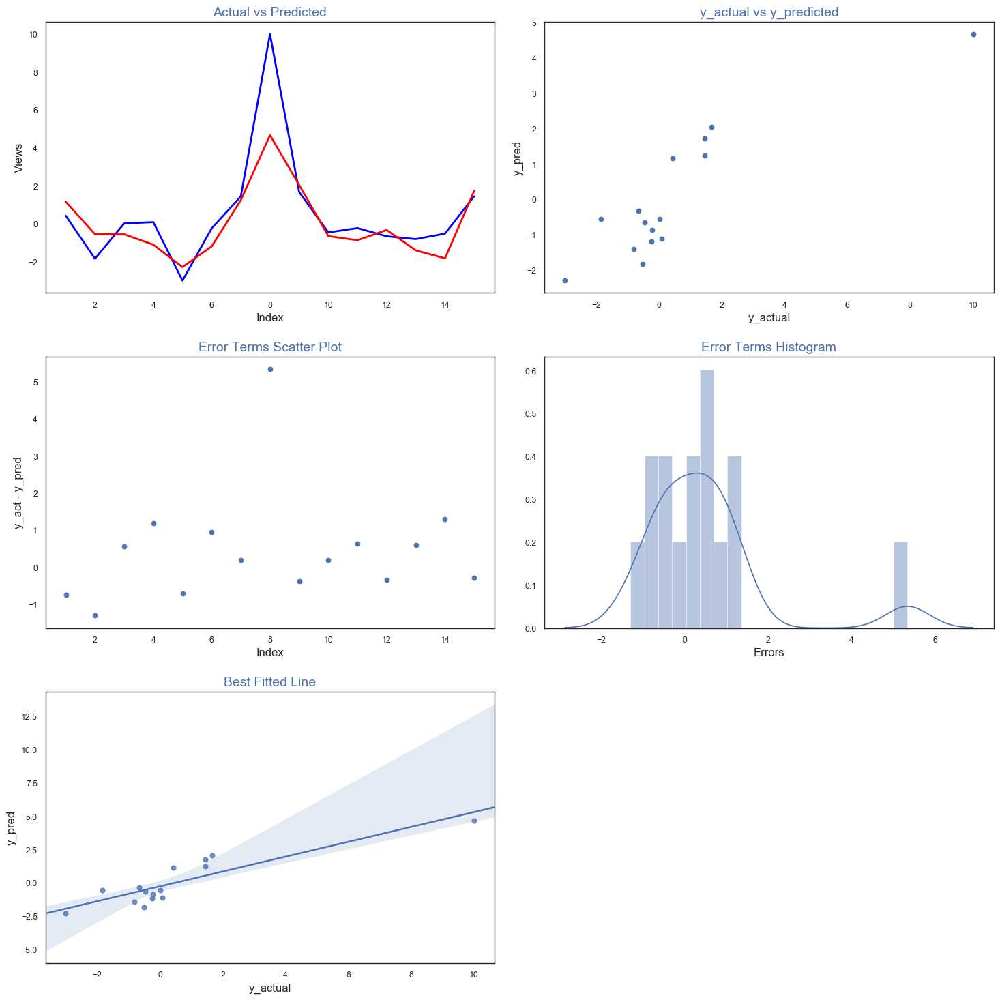

In [309]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ha_lm_actual, ha_lm_pred)

In [310]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Simple Linear Model', round(pd.to_numeric(ha_lm_R2_Score),4), round(pd.to_numeric(ha_lm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ha_lm_features[:5].Features) + list(ha_lm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.6881,2.4515,Radio,Digital,TV,Content Marketing,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM


In [311]:
# appending row to the dataframe
home_aud_model_eval = home_aud_model_eval.append(df_row, ignore_index = True)
home_aud_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.6881,2.4515,Radio,Digital,TV,Content Marketing,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM


### Koyck Model for Home Audio

In [312]:
# Creating copy of dataset
ha_km = home_aud.copy()

#### Creating a new variable which is lag of target variable, here in this scenario it will be GMV value of 1 week earlier

In [313]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ha_km = fx_lag_variable(ha_km, ['gmv'], 1)

In [314]:
ha_km.head()

,gmv,gmv_lag_1,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
80,1.067560e+05,0.000000e+00,35.559474,0,2.789474,4642.473684,3.605263,1,1,0,...,1177.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
83,4.573783e+06,1.067560e+05,31.450813,1,7.574366,3397.586322,2.863223,1,0,0,...,1177.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
86,5.371525e+06,4.573783e+06,32.966657,1,7.094517,3536.949264,2.746318,1,1,1,...,1177.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
89,4.679828e+06,5.371525e+06,32.357350,1,7.142601,3444.375336,2.860538,1,0,0,...,1177.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
92,3.451151e+06,4.679828e+06,32.207530,1,7.297686,3497.925578,2.734834,1,0,0,...,1177.0,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [315]:
# using linear regression model function extract model, R2 score, MSE and features
ha_km_model, ha_km_R2_Score, ha_km_Mean_Squared_Error, ha_km_features, ha_km_actual, ha_km_pred = fx_linear_regression(ha_km,'gmv',34)

In [316]:
print("R2 Score : ", round(pd.to_numeric(ha_km_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ha_km_Mean_Squared_Error),4))
print("Features : ",ha_km_features)

R2 Score :  0.7131
Mean Squared Error :  2.2546
Features :  Index(['gmv_lag_1', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Home Audio - Koyck Model
#### R2 Score : 0.7131
#### Mean Squared Error : 2.2546

#### Feature importance for Home Audio using Koyck Model - Calculation & Visualization

Home Audio  Feature Importance


,Features,Coefficients
15,Affiliates,17.145947
11,Digital,6.892918
12,Sponsorship,6.411363
16,SEM,5.414774
18,Other,5.199174
19,NPS,2.579032
22,Min Temp,1.320797
5,product_mrp,1.014541
24,Heat Deg Days,0.710439
4,sla,0.566107


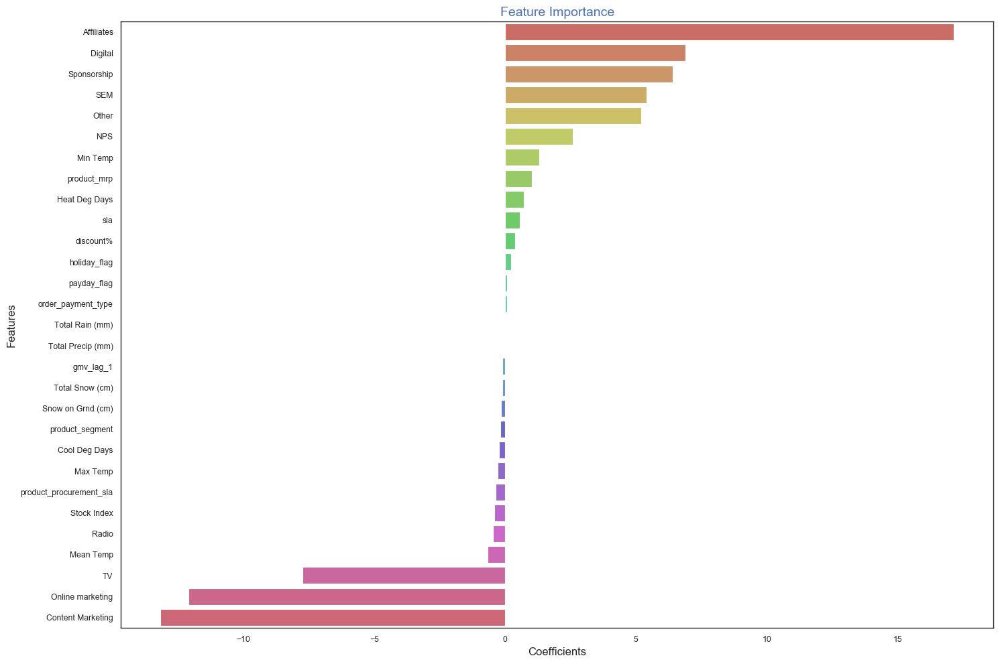

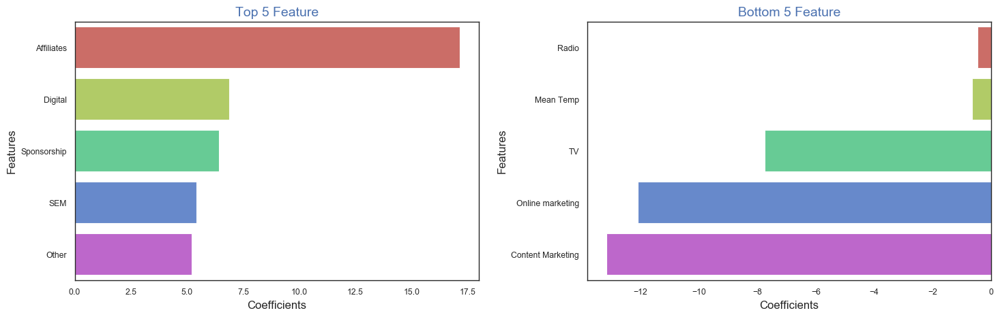

In [317]:
ha_km_features = fx_feature_importance("Home Audio", ha_km_model, ha_km_features, 'gmv_lag_1')

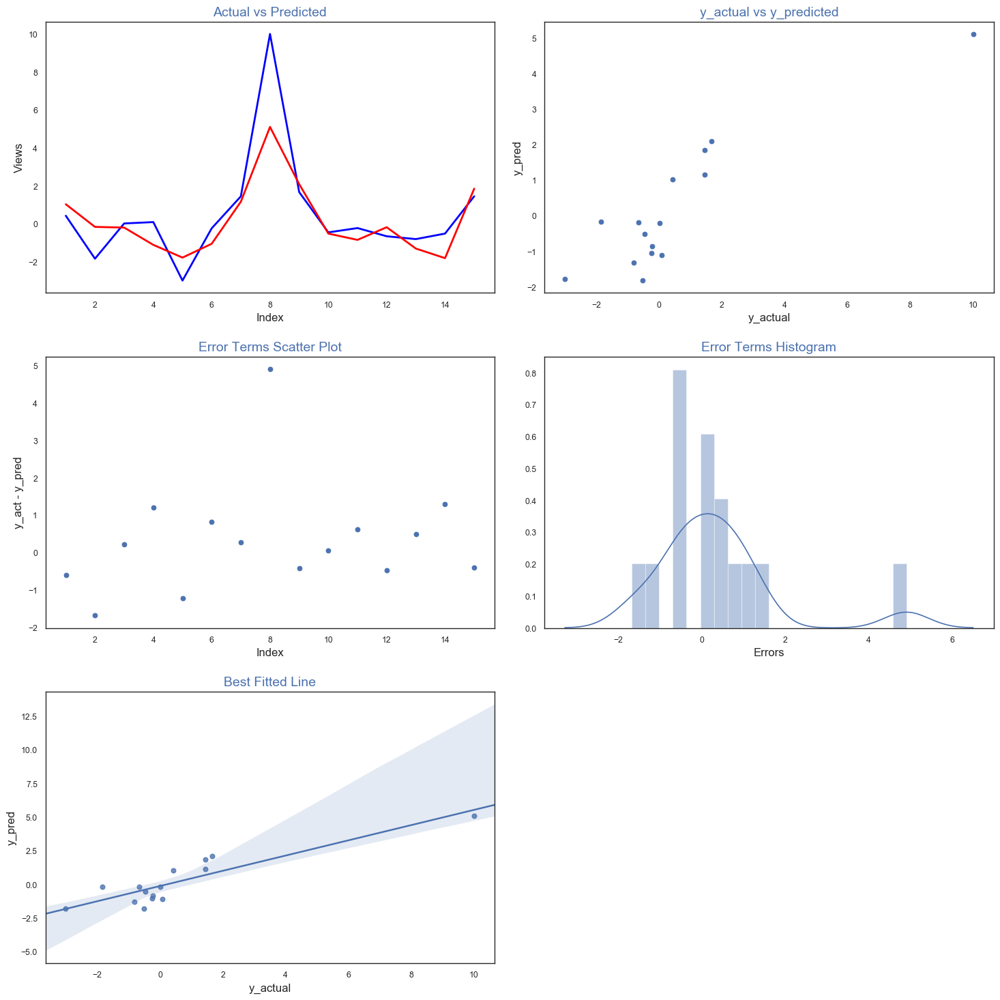

In [318]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ha_km_actual, ha_km_pred)

In [319]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Koyck Model', round(pd.to_numeric(ha_km_R2_Score),4), round(pd.to_numeric(ha_km_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ha_km_features[:5].Features) + list(ha_km_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Koyck Model,0.7131,2.2546,Affiliates,Digital,Sponsorship,SEM,Other,Radio,Mean Temp,TV,Online marketing,Content Marketing


In [320]:
# appending row to the dataframe
home_aud_model_eval = home_aud_model_eval.append(df_row, ignore_index = True)
home_aud_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.6881,2.4515,Radio,Digital,TV,Content Marketing,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.7131,2.2546,Affiliates,Digital,Sponsorship,SEM,Other,Radio,Mean Temp,TV,Online marketing,Content Marketing


### Distributed Lag Model for Home Audio

In [321]:
# Creating copy of dataset
ha_dlm = home_aud.copy()

In [322]:
col_names = ha_dlm.columns
col_names

Index(['gmv', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

#### Creating 3 week lag on all variables

In [323]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ha_dlm = fx_lag_variable(ha_dlm, col_names, 3)

In [324]:
ha_dlm.head()

,gmv,gmv_lag_3,discount%,discount%_lag_3,order_payment_type,order_payment_type_lag_3,sla,sla_lag_3,product_mrp,product_mrp_lag_3,...,Cool Deg Days,Cool Deg Days_lag_3,Total Rain (mm),Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_3
80,1.067560e+05,0.000000e+00,35.559474,0.000000,0,0.0,2.789474,0.000000,4642.473684,0.000000,...,1.460000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0
83,4.573783e+06,0.000000e+00,31.450813,0.000000,1,0.0,7.574366,0.000000,3397.586322,0.000000,...,2.383333,0.000000,4.416667,0.000000,0.0,0.0,4.416667,0.000000,0.0,0.0
86,5.371525e+06,0.000000e+00,32.966657,0.000000,1,0.0,7.094517,0.000000,3536.949264,0.000000,...,5.183333,0.000000,1.400000,0.000000,0.0,0.0,1.400000,0.000000,0.0,0.0
89,4.679828e+06,1.067560e+05,32.357350,35.559474,1,0.0,7.142601,2.789474,3444.375336,4642.473684,...,5.060000,1.460000,0.900000,0.000000,0.0,0.0,0.900000,0.000000,0.0,0.0
92,3.451151e+06,4.573783e+06,32.207530,31.450813,1,1.0,7.297686,7.574366,3497.925578,3397.586322,...,6.566667,2.383333,4.633333,4.416667,0.0,0.0,4.633333,4.416667,0.0,0.0


#### Creating 2 week lag on all variables

In [325]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ha_dlm = fx_lag_variable(ha_dlm, col_names, 2)

In [326]:
ha_dlm.head()

,gmv,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_2,order_payment_type_lag_3,sla,...,Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
80,1.067560e+05,0.000000e+00,0.000000e+00,35.559474,0.000000,0.000000,0,0.0,0.0,2.789474,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0
83,4.573783e+06,0.000000e+00,0.000000e+00,31.450813,0.000000,0.000000,1,0.0,0.0,7.574366,...,0.000000,0.0,0.0,0.0,4.416667,0.000000,0.000000,0.0,0.0,0.0
86,5.371525e+06,1.067560e+05,0.000000e+00,32.966657,35.559474,0.000000,1,0.0,0.0,7.094517,...,0.000000,0.0,0.0,0.0,1.400000,0.000000,0.000000,0.0,0.0,0.0
89,4.679828e+06,4.573783e+06,1.067560e+05,32.357350,31.450813,35.559474,1,1.0,0.0,7.142601,...,0.000000,0.0,0.0,0.0,0.900000,4.416667,0.000000,0.0,0.0,0.0
92,3.451151e+06,5.371525e+06,4.573783e+06,32.207530,32.966657,31.450813,1,1.0,1.0,7.297686,...,4.416667,0.0,0.0,0.0,4.633333,1.400000,4.416667,0.0,0.0,0.0


#### Creating 1 week lag on all variables

In [327]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ha_dlm = fx_lag_variable(ha_dlm, col_names, 1)

In [328]:
ha_dlm.head()

,gmv,gmv_lag_1,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_1,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_1,...,Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_1,Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_1,Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
80,1.067560e+05,0.000000e+00,0.000000e+00,0.000000e+00,35.559474,0.000000,0.000000,0.000000,0,0.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
83,4.573783e+06,1.067560e+05,0.000000e+00,0.000000e+00,31.450813,35.559474,0.000000,0.000000,1,0.0,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
86,5.371525e+06,4.573783e+06,1.067560e+05,0.000000e+00,32.966657,31.450813,35.559474,0.000000,1,1.0,...,0.0,0.0,1.400000,4.416667,0.000000,0.000000,0.0,0.0,0.0,0.0
89,4.679828e+06,5.371525e+06,4.573783e+06,1.067560e+05,32.357350,32.966657,31.450813,35.559474,1,1.0,...,0.0,0.0,0.900000,1.400000,4.416667,0.000000,0.0,0.0,0.0,0.0
92,3.451151e+06,4.679828e+06,5.371525e+06,4.573783e+06,32.207530,32.357350,32.966657,31.450813,1,1.0,...,0.0,0.0,4.633333,0.900000,1.400000,4.416667,0.0,0.0,0.0,0.0


In [329]:
# using linear regression model function extract model, R2 score, MSE and features
ha_dlm_model, ha_dlm_R2_Score, ha_dlm_Mean_Squared_Error, ha_dlm_features, ha_dlm_actual, ha_dlm_pred = fx_linear_regression(ha_dlm,'gmv',3)

In [330]:
print("R2 Score : ", round(pd.to_numeric(ha_dlm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ha_dlm_Mean_Squared_Error),4))
print("Features : ",ha_dlm_features)

R2 Score :  0.2323
Mean Squared Error :  4.2151
Features :  Index(['gmv_lag_1', 'gmv_lag_2', 'gmv_lag_3', 'discount%', 'discount%_lag_1',
       'discount%_lag_2', 'discount%_lag_3', 'order_payment_type',
       'order_payment_type_lag_1', 'order_payment_type_lag_2',
       ...
       'Total Snow (cm)_lag_2', 'Total Snow (cm)_lag_3', 'Total Precip (mm)',
       'Total Precip (mm)_lag_1', 'Total Precip (mm)_lag_2',
       'Total Precip (mm)_lag_3', 'Snow on Grnd (cm)',
       'Snow on Grnd (cm)_lag_1', 'Snow on Grnd (cm)_lag_2',
       'Snow on Grnd (cm)_lag_3'],
      dtype='object', length=115)


### Home Audio - Distributed Lag Model
#### R2 Score : 0.2323
#### Mean Squared Error : 4.2151

#### Feature importance for Home Audio using Distributed Lag Model - Calculation & Visualization

Home Audio  Feature Importance


,Features,Coefficients
4,discount%,0.2780
27,product_segment_lag_3,0.1915
20,product_procurement_sla,0.1775
21,product_procurement_sla_lag_1,0.1499
29,payday_flag_lag_1,0.1338
16,product_mrp,0.1244
17,product_mrp_lag_1,0.1137
95,Heat Deg Days_lag_3,0.1092
73,NPS_lag_1,0.1054
24,product_segment,0.1001


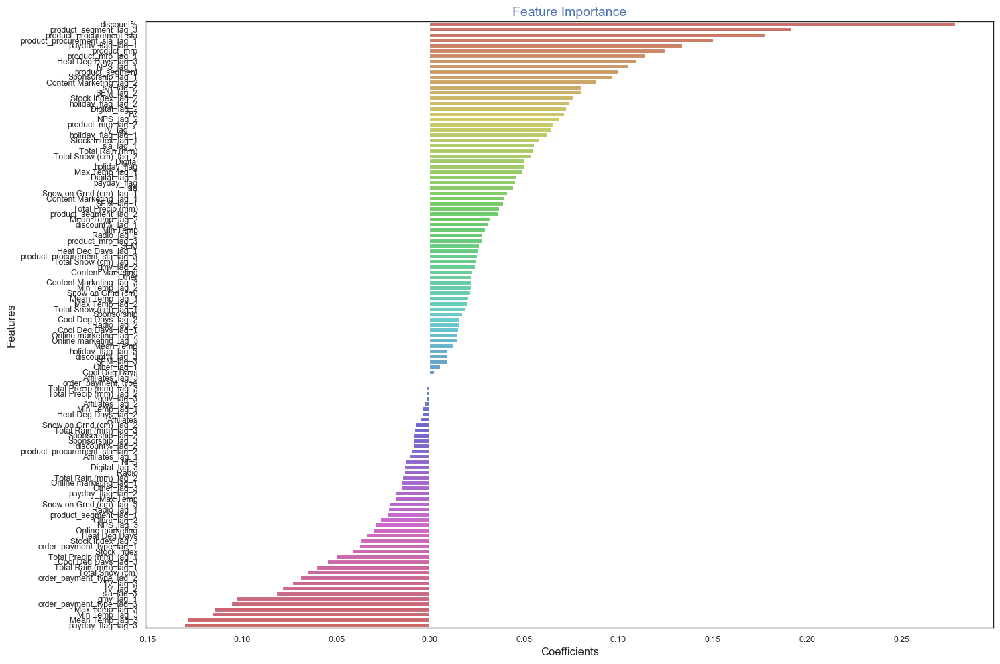

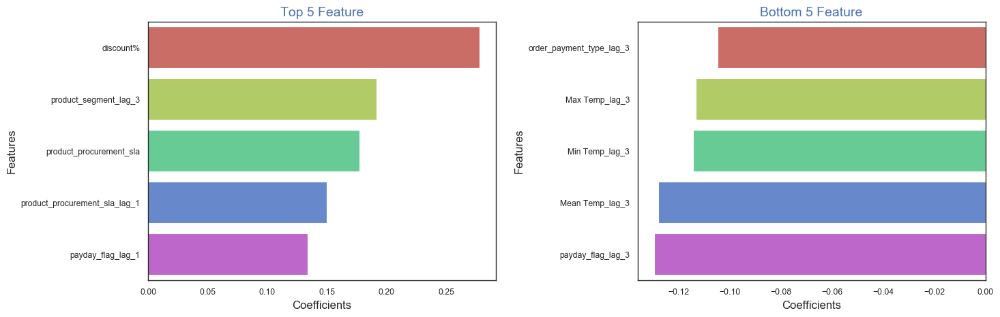

In [331]:
ha_dlm_features = fx_feature_importance("Home Audio", ha_dlm_model, ha_dlm_features)

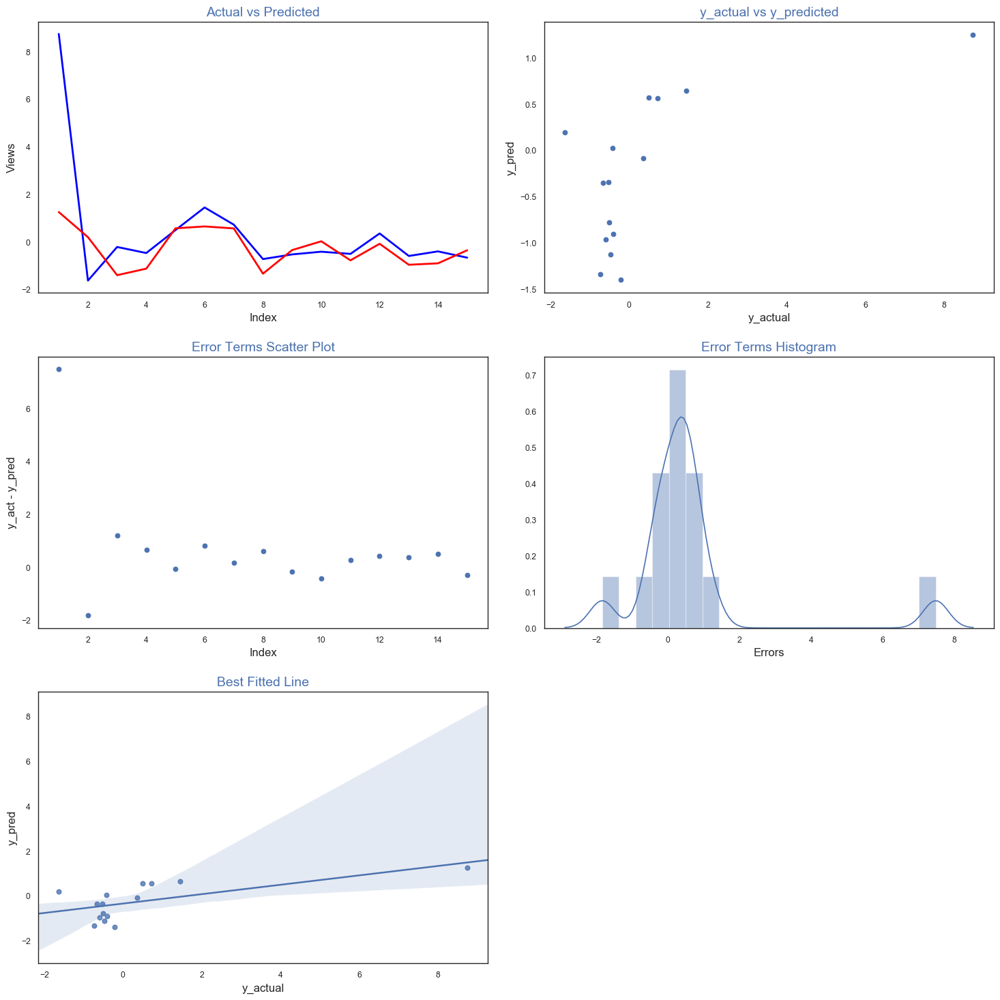

In [332]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ha_dlm_actual, ha_dlm_pred)

In [333]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Distributed Lag Model', round(pd.to_numeric(ha_dlm_R2_Score),4), round(pd.to_numeric(ha_dlm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ha_dlm_features[:5].Features) + list(ha_dlm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Distributed Lag Model,0.2323,4.2151,discount%,product_segment_lag_3,product_procurement_sla,product_procurement_sla_lag_1,payday_flag_lag_1,order_payment_type_lag_3,Max Temp_lag_3,Min Temp_lag_3,Mean Temp_lag_3,payday_flag_lag_3


In [334]:
# appending row to the dataframe
home_aud_model_eval = home_aud_model_eval.append(df_row, ignore_index = True)
home_aud_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.6881,2.4515,Radio,Digital,TV,Content Marketing,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.7131,2.2546,Affiliates,Digital,Sponsorship,SEM,Other,Radio,Mean Temp,TV,Online marketing,Content Marketing
2,Distributed Lag Model,0.2323,4.2151,discount%,product_segment_lag_3,product_procurement_sla,product_procurement_sla_lag_1,payday_flag_lag_1,order_payment_type_lag_3,Max Temp_lag_3,Min Temp_lag_3,Mean Temp_lag_3,payday_flag_lag_3


### Multiplicative Model for Home Audio

In [335]:
# Creating copy of dataset
ha_mm = home_aud.copy()

#### For multiplicative model we need to take log of both dependent and independent variables

In [336]:
ha_mm = ha_mm.applymap(lambda x: np.log(x))
ha_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
80,11.578301,3.571207,-inf,1.025853,8.443003,1.282395,0.0,0.0,-inf,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,-inf,-inf,-inf,-inf
83,15.335851,3.448425,0.0,2.024770,8.130821,1.051948,0.0,-inf,-inf,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,-inf,1.485385,-inf
86,15.496622,3.495497,0.0,1.959322,8.171020,1.010261,0.0,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,-inf,1.645448,0.336472,-inf,0.336472,-inf
89,15.358772,3.476841,0.0,1.966077,8.144498,1.051010,0.0,-inf,-inf,-1.535583,...,7.070724,3.392829,2.809403,3.138100,-inf,1.621366,-0.105361,-inf,-0.105361,-inf
92,15.054218,3.472200,0.0,1.987557,8.159925,1.006071,0.0,-inf,-inf,-1.535583,...,7.070724,3.452630,2.862201,3.201391,-inf,1.882006,1.533277,-inf,1.533277,-inf


In [337]:
# replacing inf, -inf and NULL values with 0
ha_mm = ha_mm.replace([np.inf, -np.inf, np.nan], 0)
ha_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
80,11.578301,3.571207,0.0,1.025853,8.443003,1.282395,0.0,0.0,0.0,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
83,15.335851,3.448425,0.0,2.024770,8.130821,1.051948,0.0,0.0,0.0,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
86,15.496622,3.495497,0.0,1.959322,8.171020,1.010261,0.0,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
89,15.358772,3.476841,0.0,1.966077,8.144498,1.051010,0.0,0.0,0.0,-1.535583,...,7.070724,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
92,15.054218,3.472200,0.0,1.987557,8.159925,1.006071,0.0,0.0,0.0,-1.535583,...,7.070724,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


In [338]:
# using linear regression model function extract model, R2 score, MSE and features
ha_mm_model, ha_mm_R2_Score, ha_mm_Mean_Squared_Error, ha_mm_features, ha_mm_actual, ha_mm_pred = fx_linear_regression(ha_mm,'gmv',34)

In [339]:
print("R2 Score : ", round(pd.to_numeric(ha_mm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ha_mm_Mean_Squared_Error),4))
print("Features : ",ha_mm_features)

R2 Score :  0.8499
Mean Squared Error :  0.1057
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Home Audio - Multiplicative Model
#### R2 Score : 0.8499
#### Mean Squared Error : 0.1057

#### Feature importance for Home Audio using Multiplicative Model - Calculation & Visualization

Home Audio  Feature Importance


,Features,Coefficients
13,Online marketing,40.1684
9,TV,1.5657
10,Digital,1.5593
1,discount%,0.5223
3,sla,0.2815
17,Other,0.2330
21,Min Temp,0.1565
20,Max Temp,0.1193
28,Snow on Grnd (cm),0.0806
27,Total Precip (mm),0.0717


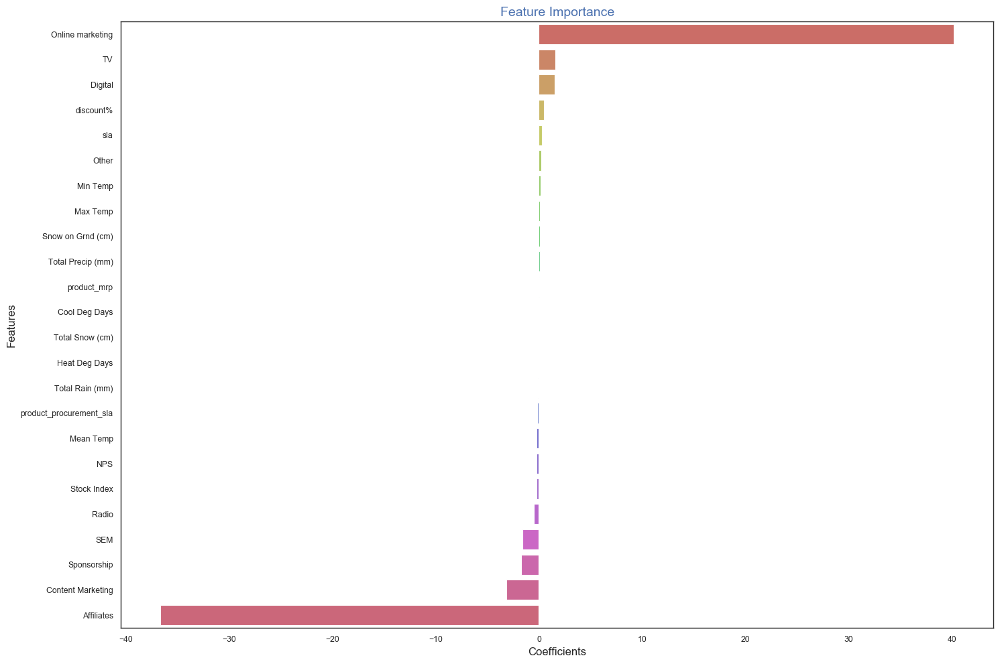

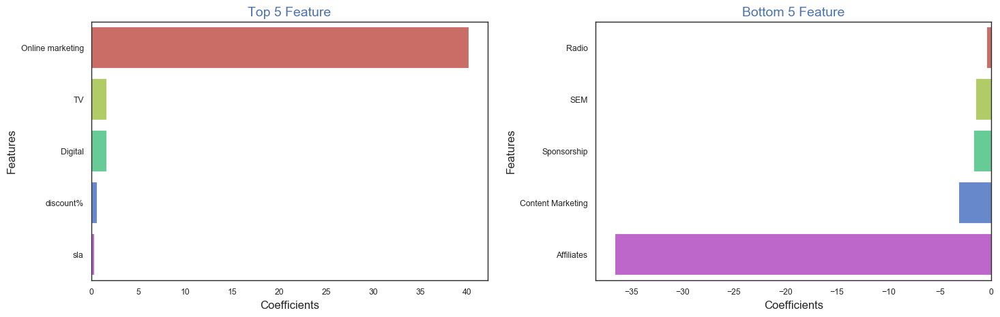

In [340]:
ha_mm_features = fx_feature_importance("Home Audio", ha_mm_model, ha_mm_features)

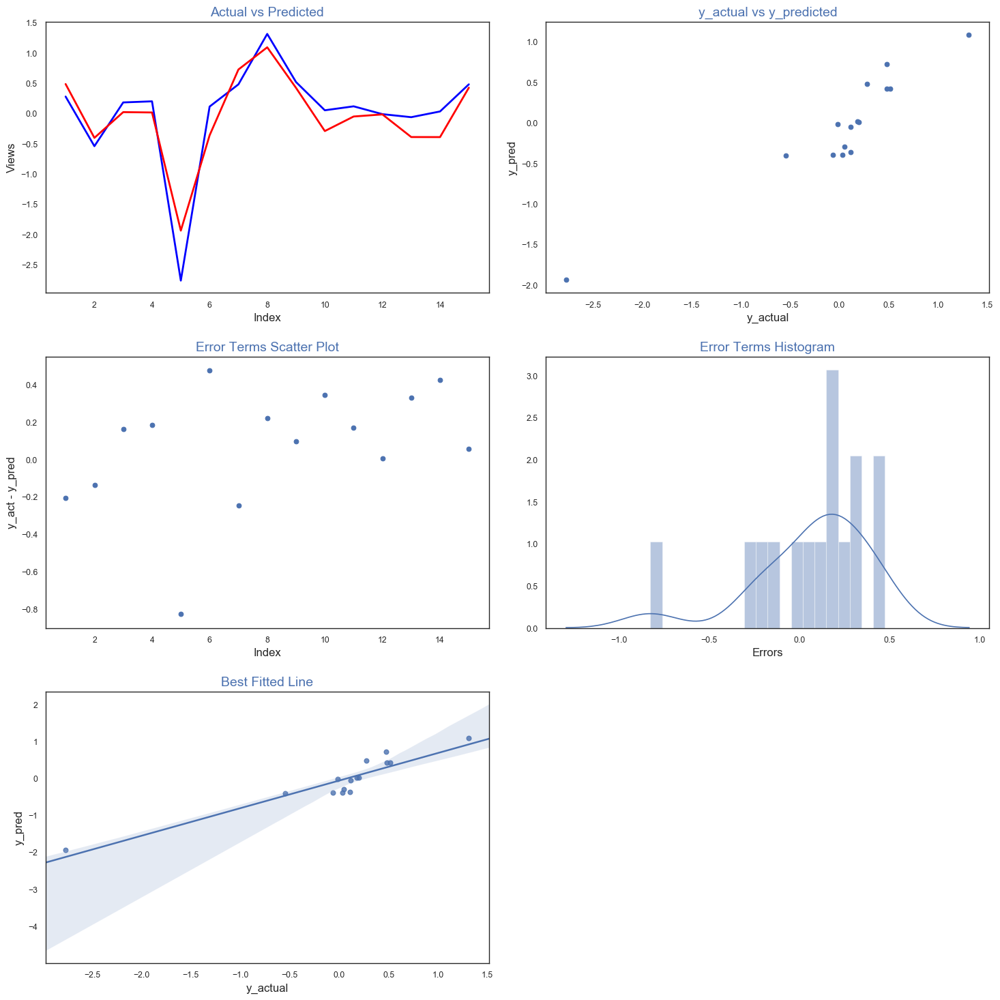

In [341]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ha_mm_actual, ha_mm_pred)

In [342]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Multiplicative Model', round(pd.to_numeric(ha_mm_R2_Score),4), round(pd.to_numeric(ha_mm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ha_mm_features[:5].Features) + list(ha_mm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Multiplicative Model,0.8499,0.1057,Online marketing,TV,Digital,discount%,sla,Radio,SEM,Sponsorship,Content Marketing,Affiliates


In [343]:
# appending row to the dataframe
home_aud_model_eval = home_aud_model_eval.append(df_row, ignore_index = True)
home_aud_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.6881,2.4515,Radio,Digital,TV,Content Marketing,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.7131,2.2546,Affiliates,Digital,Sponsorship,SEM,Other,Radio,Mean Temp,TV,Online marketing,Content Marketing
2,Distributed Lag Model,0.2323,4.2151,discount%,product_segment_lag_3,product_procurement_sla,product_procurement_sla_lag_1,payday_flag_lag_1,order_payment_type_lag_3,Max Temp_lag_3,Min Temp_lag_3,Mean Temp_lag_3,payday_flag_lag_3
3,Multiplicative Model,0.8499,0.1057,Online marketing,TV,Digital,discount%,sla,Radio,SEM,Sponsorship,Content Marketing,Affiliates


## <font color = red>Home Audio Model Observation</font>
#### Based on R2 Score the model which is best suited for Home Audio is Multiplicative Model with R2 Score of 0.8499.
#### Based on this to boost revenue from Home Audio marketing spend must be done on Online Marketing, TV, Digital and Discount% and should be avoided from Radio, SEM, Sponsorship, Content Marketing and Affiliates.
--------------------------------------------------------------------------------------------------------------------

## Gaming Accessory - Modelling
Creating dataframe to compare different models

In [344]:
# Creating dataframe to compare different models
game_acc_model_eval = pd.DataFrame(columns=['Model', 'R2 Score', 'Mean Squared Error', \
                                'Top Feature 1', 'Top Feature 2', 'Top Feature 3', 'Top Feature 4', 'Top Feature 5', \
                               'Bottom Feature 1', 'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', \
                               'Bottom Feature 5'])

In [345]:
game_acc_model_eval.shape

(0, 13)

### Linear Model for Gaming Accessory

In [346]:
# Creating copy of dataset
ga_lm = game_acc.copy()

In [347]:
# using linear regression model function extract model, R2 score, MSE and features
ga_lm_model, ga_lm_R2_Score, ga_lm_Mean_Squared_Error, ga_lm_features, ga_lm_actual, ga_lm_pred = fx_linear_regression(ga_lm,'gmv',57)

In [348]:
print("R2 Score : ", round(pd.to_numeric(ga_lm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ga_lm_Mean_Squared_Error),4))
print("Features : ",ga_lm_features)

R2 Score :  0.5032
Mean Squared Error :  0.3116
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Gaming Accessory - Simple Linear Regression
#### R2 Score : 0.5032
#### Mean Squared Error : 0.3116

#### Feature importance for Gaming Accessory using Simple Linear Regression - Calculation & Visualization

Gaming Accessory  Feature Importance


,Features,Coefficients
16,Radio,83.4892
10,Digital,71.8990
12,Content Marketing,61.3843
9,TV,61.0741
13,Online marketing,56.3807
1,discount%,0.4140
21,Min Temp,0.3921
24,Cool Deg Days,0.2079
5,product_procurement_sla,0.1766
22,Mean Temp,0.1613


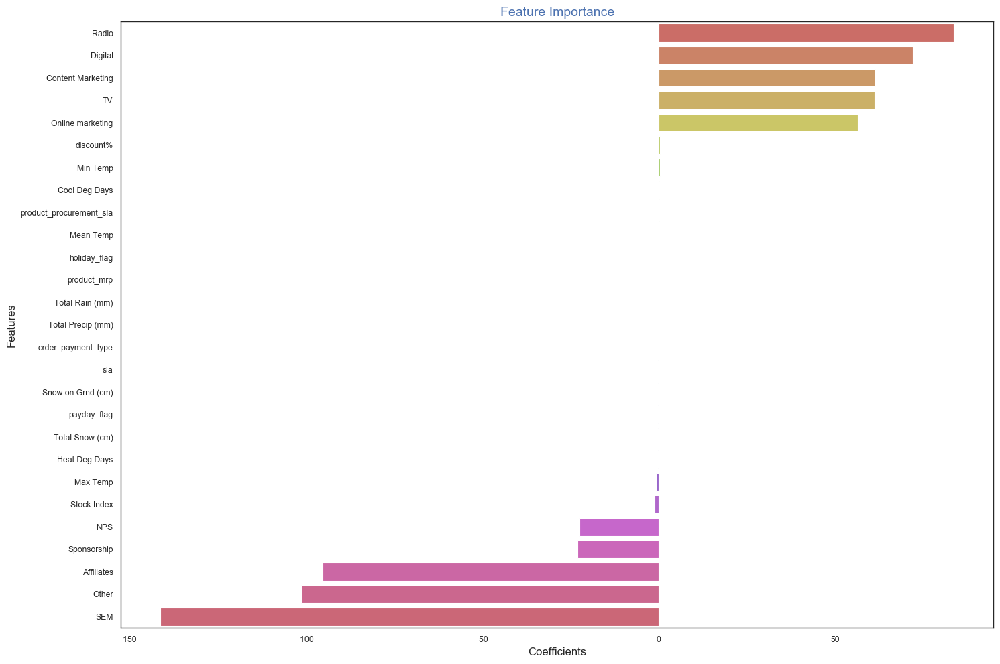

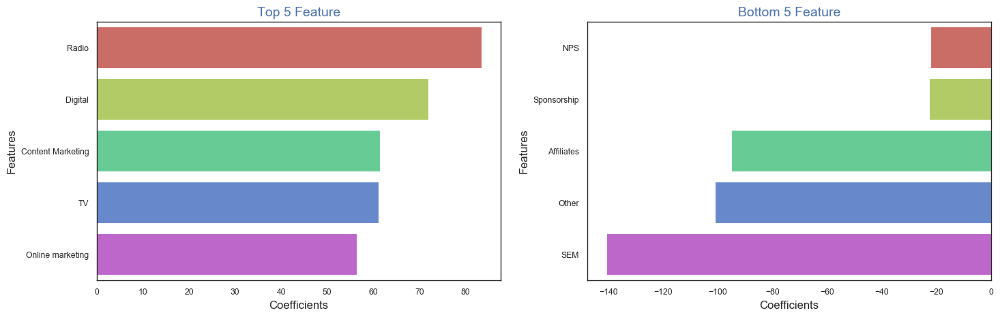

In [349]:
#fx_feature_importance("Gaming Accessory", ga_lm_model, ga_lm_features)
ga_lm_features = fx_feature_importance("Gaming Accessory", ga_lm_model, ga_lm_features)

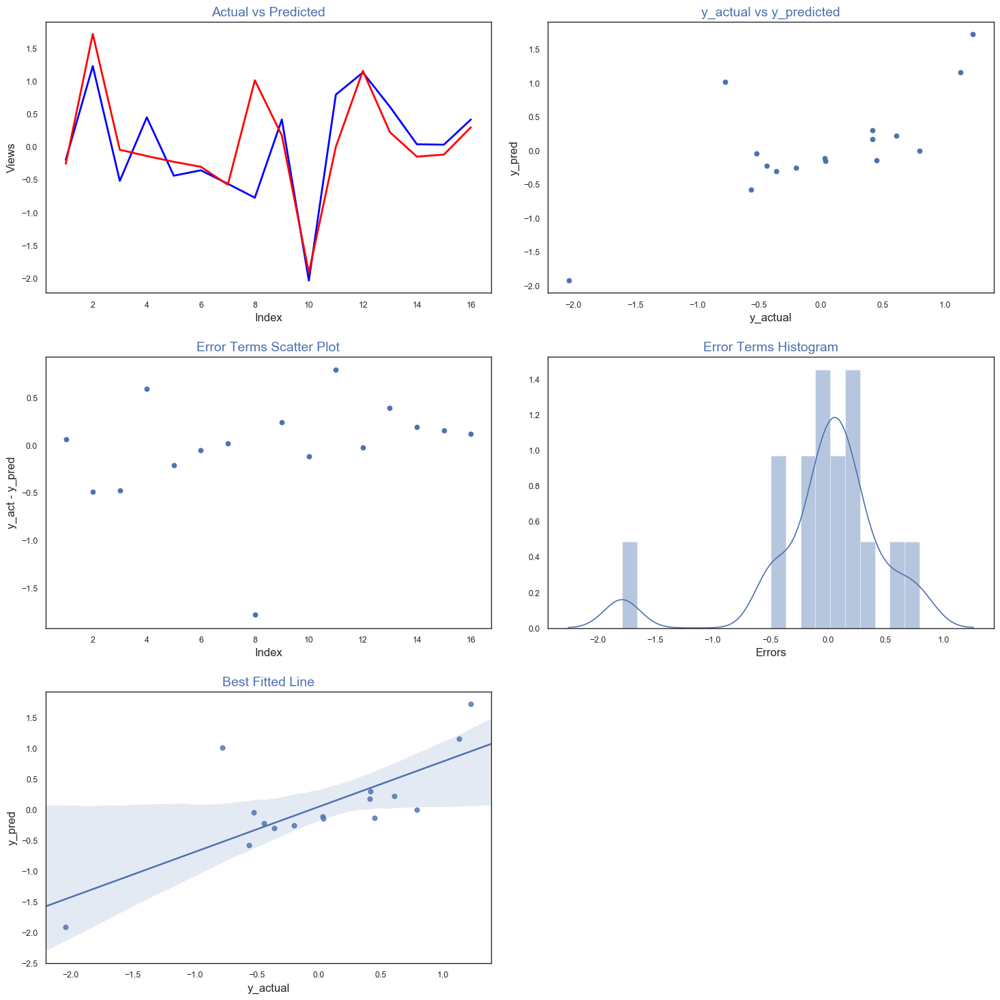

In [350]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ga_lm_actual, ga_lm_pred)

In [351]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Simple Linear Model', round(pd.to_numeric(ga_lm_R2_Score),4), round(pd.to_numeric(ga_lm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ga_lm_features[:5].Features) + list(ga_lm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.5032,0.3116,Radio,Digital,Content Marketing,TV,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM


In [352]:
# appending row to the dataframe
game_acc_model_eval = game_acc_model_eval.append(df_row, ignore_index = True)
game_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.5032,0.3116,Radio,Digital,Content Marketing,TV,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM


### Koyck Model for Gaming Accessory

In [353]:
# Creating copy of dataset
ga_km = game_acc.copy()

#### Creating a new variable which is lag of target variable, here in this scenario it will be GMV value of 1 week earlier

In [354]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ga_km = fx_lag_variable(ga_km, ['gmv'], 1)

In [355]:
ga_km.head()

,gmv,gmv_lag_1,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
79,3.788700e+04,0.000000e+00,27.514667,0,2.933333,3457.800000,2.966667,0,1,0,...,1177.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
82,2.688958e+06,3.788700e+04,40.174910,1,5.460737,1884.486449,3.213343,0,0,0,...,1177.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
85,2.270363e+06,2.688958e+06,42.688931,1,5.335189,1827.610987,2.721232,0,1,1,...,1177.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
88,2.588844e+06,2.270363e+06,37.110373,1,5.429508,2345.636475,2.603279,0,0,0,...,1177.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
91,1.900937e+06,2.588844e+06,42.873608,1,5.685535,5126.751858,3.188679,0,1,0,...,1177.0,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [356]:
# using linear regression model function extract model, R2 score, MSE and features
ga_km_model, ga_km_R2_Score, ga_km_Mean_Squared_Error, ga_km_features, ga_km_actual, ga_km_pred = fx_linear_regression(ga_km,'gmv',98)

In [357]:
print("R2 Score : ", round(pd.to_numeric(ga_km_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ga_km_Mean_Squared_Error),4))
print("Features : ",ga_km_features)

R2 Score :  0.3703
Mean Squared Error :  0.4461
Features :  Index(['gmv_lag_1', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Gaming Accessory - Koyck Model
#### R2 Score : 0.3703
#### Mean Squared Error : 0.4461

#### Feature importance for Gaming Accessory using Koyck Model - Calculation & Visualization

Gaming Accessory  Feature Importance


,Features,Coefficients
17,Radio,131.299985
14,Online marketing,85.473966
10,TV,85.058911
11,Digital,74.252083
13,Content Marketing,72.204999
23,Mean Temp,0.612392
22,Min Temp,0.238099
2,discount%,0.208123
5,product_mrp,0.171080
9,holiday_flag,0.161038


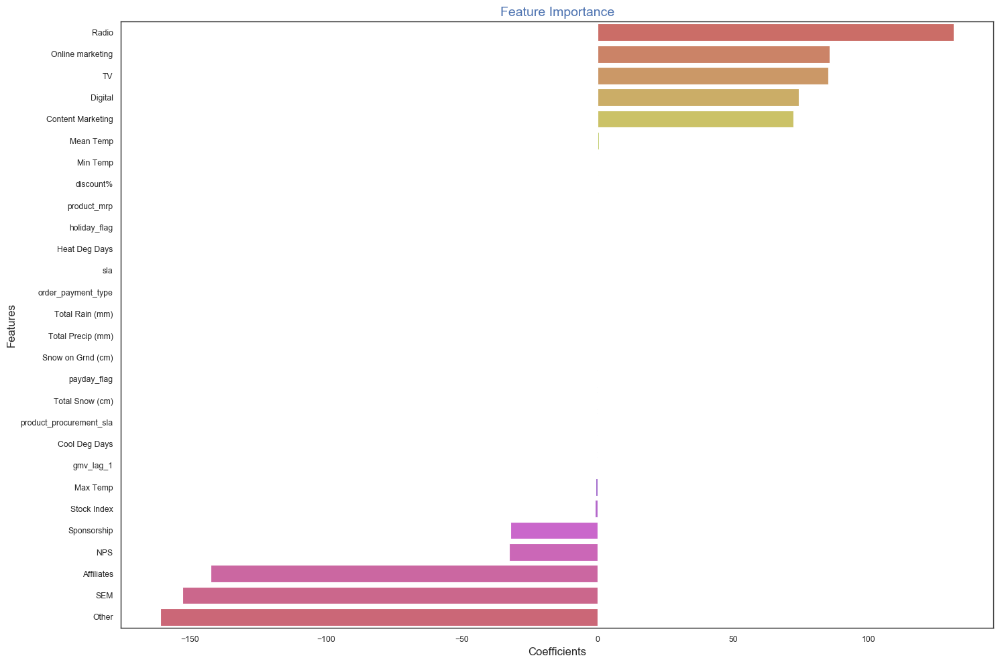

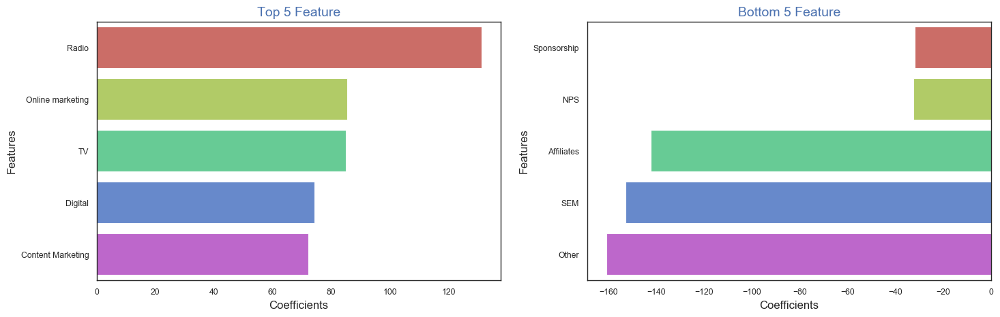

In [358]:
ga_km_features = fx_feature_importance("Gaming Accessory", ga_km_model, ga_km_features, 'gmv_lag_1')

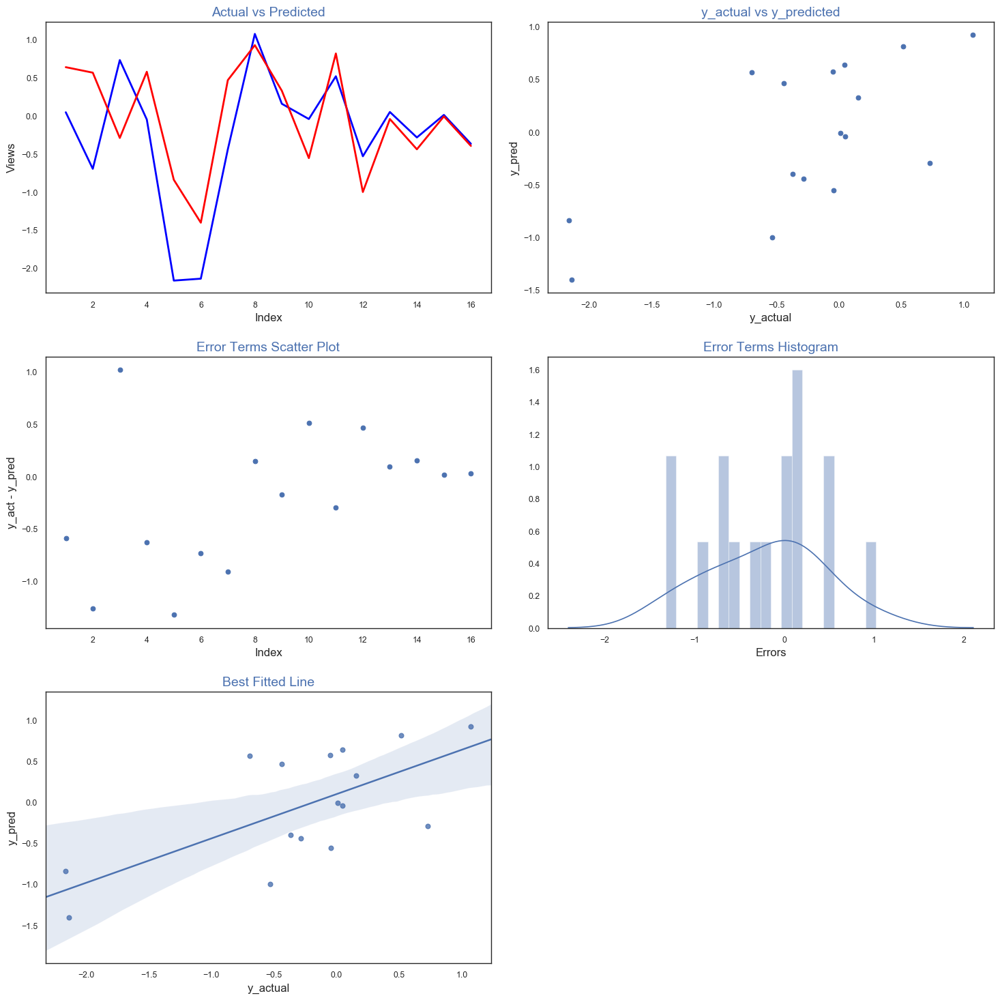

In [359]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ga_km_actual, ga_km_pred)

In [360]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Koyck Model', round(pd.to_numeric(ga_km_R2_Score),4), round(pd.to_numeric(ga_km_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ga_km_features[:5].Features) + list(ga_km_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Koyck Model,0.3703,0.4461,Radio,Online marketing,TV,Digital,Content Marketing,Sponsorship,NPS,Affiliates,SEM,Other


In [361]:
# appending row to the dataframe
game_acc_model_eval = game_acc_model_eval.append(df_row, ignore_index = True)
game_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.5032,0.3116,Radio,Digital,Content Marketing,TV,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3703,0.4461,Radio,Online marketing,TV,Digital,Content Marketing,Sponsorship,NPS,Affiliates,SEM,Other


### Distributed Lag Model for Gaming Accessory

In [362]:
# Creating copy of dataset
ga_dlm = game_acc.copy()

In [363]:
col_names = ga_dlm.columns
col_names

Index(['gmv', 'discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')

#### Creating 3 week lag on all variables

In [364]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ga_dlm = fx_lag_variable(ga_dlm, col_names, 3)

In [365]:
ga_dlm.head()

,gmv,gmv_lag_3,discount%,discount%_lag_3,order_payment_type,order_payment_type_lag_3,sla,sla_lag_3,product_mrp,product_mrp_lag_3,...,Cool Deg Days,Cool Deg Days_lag_3,Total Rain (mm),Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_3
79,3.788700e+04,0.0,27.514667,0.000000,0,0.0,2.933333,0.000000,3457.800000,0.000000,...,1.460000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0
82,2.688958e+06,0.0,40.174910,0.000000,1,0.0,5.460737,0.000000,1884.486449,0.000000,...,2.383333,0.000000,4.416667,0.000000,0.0,0.0,4.416667,0.000000,0.0,0.0
85,2.270363e+06,0.0,42.688931,0.000000,1,0.0,5.335189,0.000000,1827.610987,0.000000,...,5.183333,0.000000,1.400000,0.000000,0.0,0.0,1.400000,0.000000,0.0,0.0
88,2.588844e+06,37887.0,37.110373,27.514667,1,0.0,5.429508,2.933333,2345.636475,3457.800000,...,5.060000,1.460000,0.900000,0.000000,0.0,0.0,0.900000,0.000000,0.0,0.0
91,1.900937e+06,2688958.0,42.873608,40.174910,1,1.0,5.685535,5.460737,5126.751858,1884.486449,...,6.566667,2.383333,4.633333,4.416667,0.0,0.0,4.633333,4.416667,0.0,0.0


#### Creating 2 week lag on all variables

In [366]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ga_dlm = fx_lag_variable(ga_dlm, col_names, 2)

In [367]:
ga_dlm.head()

,gmv,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_2,order_payment_type_lag_3,sla,...,Total Rain (mm)_lag_3,Total Snow (cm),Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
79,3.788700e+04,0.000000e+00,0.0,27.514667,0.000000,0.000000,0,0.0,0.0,2.933333,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0
82,2.688958e+06,0.000000e+00,0.0,40.174910,0.000000,0.000000,1,0.0,0.0,5.460737,...,0.000000,0.0,0.0,0.0,4.416667,0.000000,0.000000,0.0,0.0,0.0
85,2.270363e+06,3.788700e+04,0.0,42.688931,27.514667,0.000000,1,0.0,0.0,5.335189,...,0.000000,0.0,0.0,0.0,1.400000,0.000000,0.000000,0.0,0.0,0.0
88,2.588844e+06,2.688958e+06,37887.0,37.110373,40.174910,27.514667,1,1.0,0.0,5.429508,...,0.000000,0.0,0.0,0.0,0.900000,4.416667,0.000000,0.0,0.0,0.0
91,1.900937e+06,2.270363e+06,2688958.0,42.873608,42.688931,40.174910,1,1.0,1.0,5.685535,...,4.416667,0.0,0.0,0.0,4.633333,1.400000,4.416667,0.0,0.0,0.0


#### Creating 1 week lag on all variables

In [368]:
# input to function is dataframe, column on which lag needs to be created, and number of week for lag
ga_dlm = fx_lag_variable(ga_dlm, col_names, 1)

In [369]:
ga_dlm.head()

,gmv,gmv_lag_1,gmv_lag_2,gmv_lag_3,discount%,discount%_lag_1,discount%_lag_2,discount%_lag_3,order_payment_type,order_payment_type_lag_1,...,Total Snow (cm)_lag_2,Total Snow (cm)_lag_3,Total Precip (mm),Total Precip (mm)_lag_1,Total Precip (mm)_lag_2,Total Precip (mm)_lag_3,Snow on Grnd (cm),Snow on Grnd (cm)_lag_1,Snow on Grnd (cm)_lag_2,Snow on Grnd (cm)_lag_3
79,3.788700e+04,0.000000e+00,0.000000e+00,0.0,27.514667,0.000000,0.000000,0.000000,0,0.0,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
82,2.688958e+06,3.788700e+04,0.000000e+00,0.0,40.174910,27.514667,0.000000,0.000000,1,0.0,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
85,2.270363e+06,2.688958e+06,3.788700e+04,0.0,42.688931,40.174910,27.514667,0.000000,1,1.0,...,0.0,0.0,1.400000,4.416667,0.000000,0.000000,0.0,0.0,0.0,0.0
88,2.588844e+06,2.270363e+06,2.688958e+06,37887.0,37.110373,42.688931,40.174910,27.514667,1,1.0,...,0.0,0.0,0.900000,1.400000,4.416667,0.000000,0.0,0.0,0.0,0.0
91,1.900937e+06,2.588844e+06,2.270363e+06,2688958.0,42.873608,37.110373,42.688931,40.174910,1,1.0,...,0.0,0.0,4.633333,0.900000,1.400000,4.416667,0.0,0.0,0.0,0.0


In [370]:
# using linear regression model function extract model, R2 score, MSE and features
ga_dlm_model, ga_dlm_R2_Score, ga_dlm_Mean_Squared_Error, ga_dlm_features, ga_dlm_actual, ga_dlm_pred = fx_linear_regression(ga_dlm,'gmv',68)

In [371]:
print("R2 Score : ", round(pd.to_numeric(ga_dlm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ga_dlm_Mean_Squared_Error),4))
print("Features : ",ga_dlm_features)

R2 Score :  0.246
Mean Squared Error :  1.1439
Features :  Index(['gmv_lag_1', 'gmv_lag_2', 'gmv_lag_3', 'discount%', 'discount%_lag_1',
       'discount%_lag_2', 'discount%_lag_3', 'order_payment_type',
       'order_payment_type_lag_1', 'order_payment_type_lag_2',
       ...
       'Total Snow (cm)_lag_2', 'Total Snow (cm)_lag_3', 'Total Precip (mm)',
       'Total Precip (mm)_lag_1', 'Total Precip (mm)_lag_2',
       'Total Precip (mm)_lag_3', 'Snow on Grnd (cm)',
       'Snow on Grnd (cm)_lag_1', 'Snow on Grnd (cm)_lag_2',
       'Snow on Grnd (cm)_lag_3'],
      dtype='object', length=115)


### Gaming Accessory - Distributed Lag Model
#### R2 Score : 0.246
#### Mean Squared Error : 1.1439

#### Feature importance for Gaming Accessory using Distributed Lag Model - Calculation & Visualization

Gaming Accessory  Feature Importance


,Features,Coefficients
20,product_procurement_sla,0.2561
4,discount%,0.2306
1,gmv_lag_1,0.1827
42,Digital_lag_2,0.1783
73,NPS_lag_1,0.1754
44,Sponsorship,0.1689
50,Content Marketing_lag_2,0.1634
16,product_mrp,0.1623
104,Total Snow (cm),0.1613
77,Stock Index_lag_1,0.1532


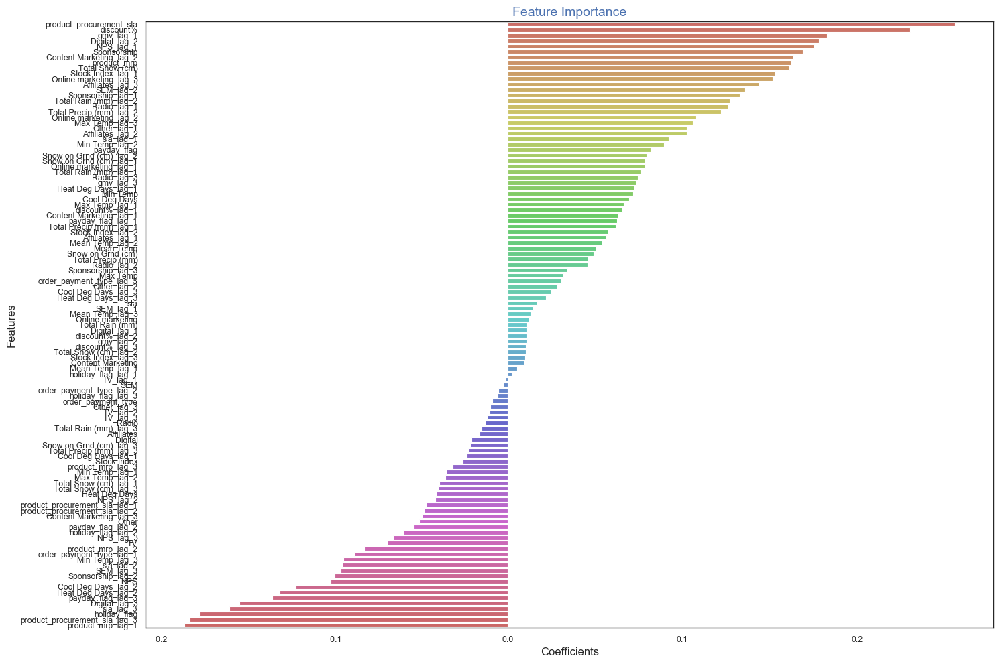

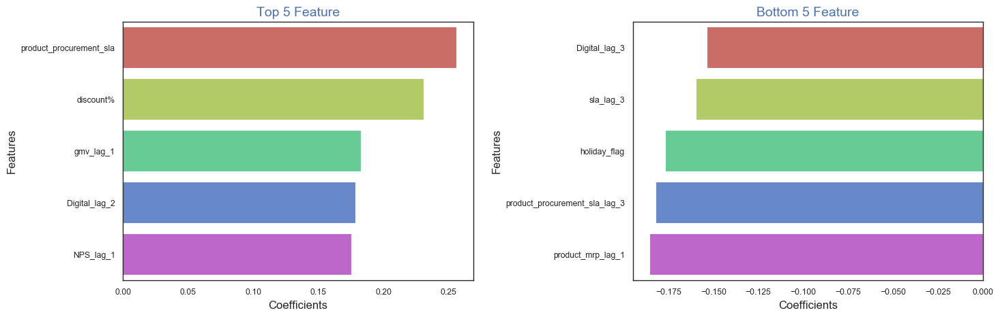

In [372]:
ga_dlm_features = fx_feature_importance("Gaming Accessory", ga_dlm_model, ga_dlm_features)

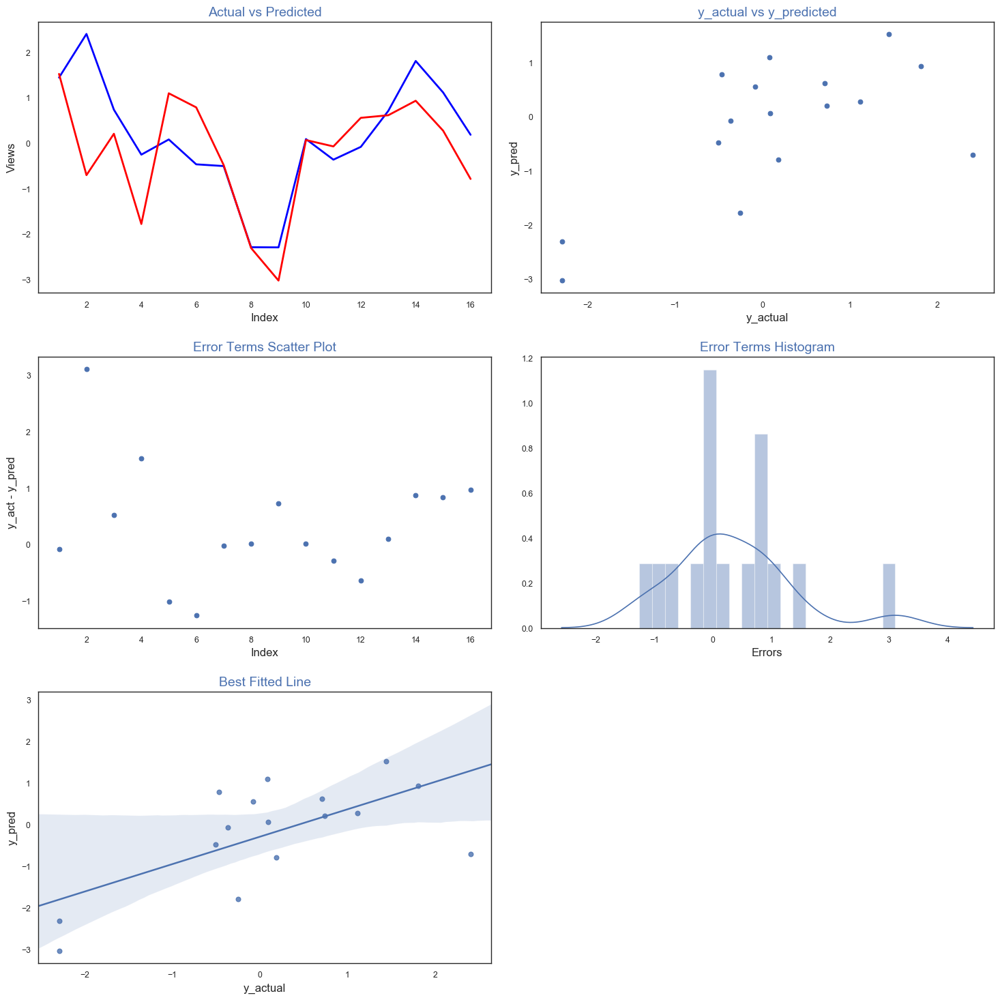

In [373]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ga_dlm_actual, ga_dlm_pred)

In [374]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Distributed Lag Model', round(pd.to_numeric(ga_dlm_R2_Score),4), round(pd.to_numeric(ga_dlm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ga_dlm_features[:5].Features) + list(ga_dlm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Distributed Lag Model,0.246,1.1439,product_procurement_sla,discount%,gmv_lag_1,Digital_lag_2,NPS_lag_1,Digital_lag_3,sla_lag_3,holiday_flag,product_procurement_sla_lag_3,product_mrp_lag_1


In [375]:
# appending row to the dataframe
game_acc_model_eval = game_acc_model_eval.append(df_row, ignore_index = True)
game_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.5032,0.3116,Radio,Digital,Content Marketing,TV,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3703,0.4461,Radio,Online marketing,TV,Digital,Content Marketing,Sponsorship,NPS,Affiliates,SEM,Other
2,Distributed Lag Model,0.246,1.1439,product_procurement_sla,discount%,gmv_lag_1,Digital_lag_2,NPS_lag_1,Digital_lag_3,sla_lag_3,holiday_flag,product_procurement_sla_lag_3,product_mrp_lag_1


### Multiplicative Model for Gaming Accessory

In [376]:
# Creating copy of dataset
ga_mm = game_acc.copy()

#### For multiplicative model we need to take log of both dependent and independent variables

In [377]:
ga_mm = ga_mm.applymap(lambda x: np.log(x))
ga_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
79,10.542363,3.314719,-inf,1.076139,8.148388,1.087439,-inf,0.0,-inf,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,-inf,-inf,-inf,-inf
82,14.804664,3.693243,0.0,1.697584,7.541411,1.167312,-inf,-inf,-inf,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,-inf,1.485385,-inf
85,14.635450,3.753940,0.0,1.674324,7.510765,1.001085,-inf,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,-inf,1.645448,0.336472,-inf,0.336472,-inf
88,14.766722,3.613897,0.0,1.691849,7.760312,0.956772,-inf,-inf,-inf,-1.535583,...,7.070724,3.392829,2.809403,3.138100,-inf,1.621366,-0.105361,-inf,-0.105361,-inf
91,14.457857,3.758256,0.0,1.737925,8.542228,1.159607,-inf,0.0,-inf,-1.535583,...,7.070724,3.452630,2.862201,3.201391,-inf,1.882006,1.533277,-inf,1.533277,-inf


In [378]:
# replacing inf, -inf and NULL values with 0
ga_mm = ga_mm.replace([np.inf, -np.inf, np.nan], 0)
ga_mm.head()

,gmv,discount%,order_payment_type,sla,product_mrp,product_procurement_sla,product_segment,payday_flag,holiday_flag,TV,...,Stock Index,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
79,10.542363,3.314719,0.0,1.076139,8.148388,1.087439,0.0,0.0,0.0,-1.535583,...,7.070724,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
82,14.804664,3.693243,0.0,1.697584,7.541411,1.167312,0.0,0.0,0.0,-1.535583,...,7.070724,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
85,14.635450,3.753940,0.0,1.674324,7.510765,1.001085,0.0,0.0,0.0,-1.535583,...,7.070724,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
88,14.766722,3.613897,0.0,1.691849,7.760312,0.956772,0.0,0.0,0.0,-1.535583,...,7.070724,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
91,14.457857,3.758256,0.0,1.737925,8.542228,1.159607,0.0,0.0,0.0,-1.535583,...,7.070724,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


In [379]:
# using linear regression model function extract model, R2 score, MSE and features
ga_mm_model, ga_mm_R2_Score, ga_mm_Mean_Squared_Error, ga_mm_features, ga_mm_actual, ga_mm_pred = fx_linear_regression(ga_mm,'gmv',48)

In [380]:
print("R2 Score : ", round(pd.to_numeric(ga_mm_R2_Score),4))
print("Mean Squared Error : ", round(pd.to_numeric(ga_mm_Mean_Squared_Error),4))
print("Features : ",ga_mm_features)

R2 Score :  0.9593
Mean Squared Error :  0.0953
Features :  Index(['discount%', 'order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'product_segment', 'payday_flag',
       'holiday_flag', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS',
       'Stock Index', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days',
       'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)'],
      dtype='object')


### Gaming Accessory - Multiplicative Model
#### R2 Score : 0.9593
#### Mean Squared Error : 0.0953

#### Feature importance for Gaming Accessory using Multiplicative Model - Calculation & Visualization

Gaming Accessory  Feature Importance


,Features,Coefficients
13,Online marketing,31.7730
10,Digital,1.1991
9,TV,0.6825
27,Total Precip (mm),0.2248
5,product_procurement_sla,0.2099
17,Other,0.2045
3,sla,0.1865
23,Heat Deg Days,0.1500
1,discount%,0.1495
21,Min Temp,0.1252


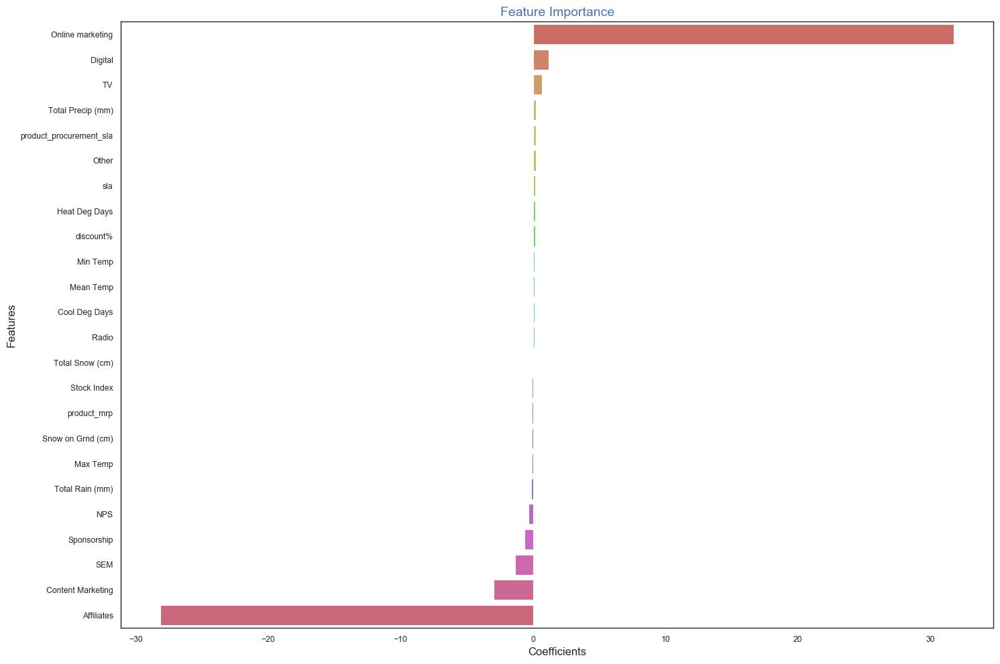

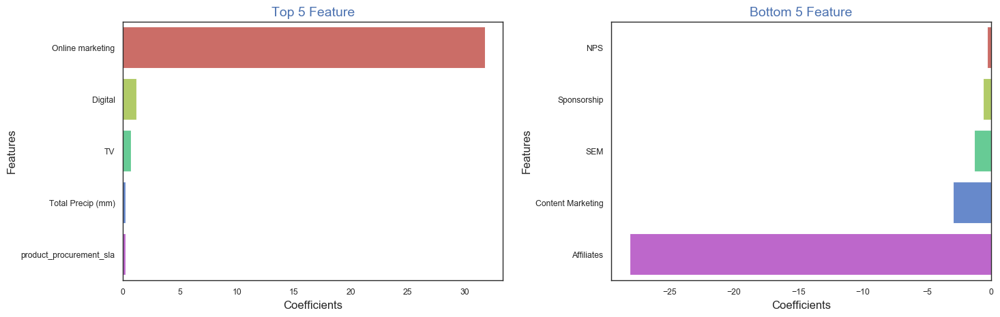

In [381]:
ga_mm_features = fx_feature_importance("Gaming Accessory", ga_mm_model, ga_mm_features)

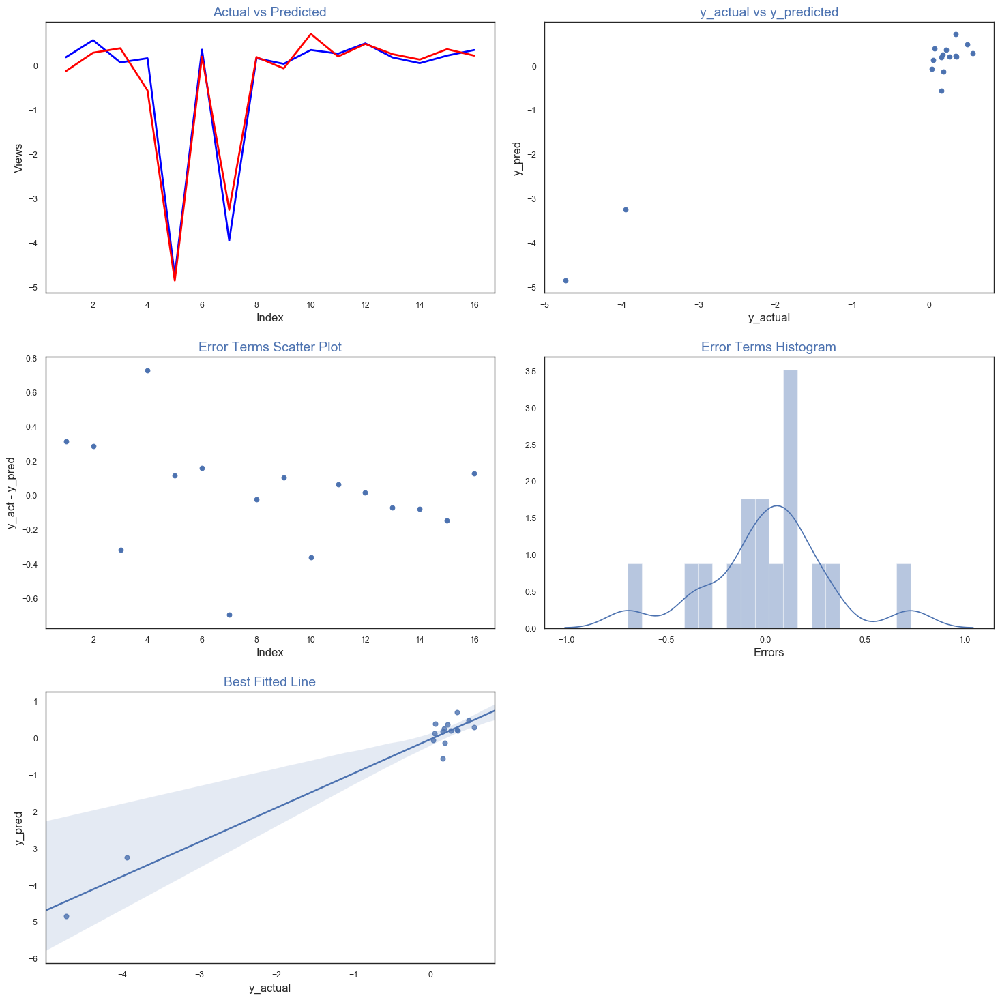

In [382]:
# Plotting y_test vs y_pred, error terms and best fitted line
fx_model_eval(ga_mm_actual, ga_mm_pred)

In [383]:
# Creating row to insert in model evaluation dataset
df_row = []
df_row = ['Multiplicative Model', round(pd.to_numeric(ga_mm_R2_Score),4), round(pd.to_numeric(ga_mm_Mean_Squared_Error),4)]
df_row = pd.DataFrame(df_row + list(ga_mm_features[:5].Features) + list(ga_mm_features[-5:].Features)).T
#df_row

df_row.columns = ['Model', 'R2 Score', 'Mean Squared Error', 'Top Feature 1', 'Top Feature 2', \
                  'Top Feature 3', 'Top Feature 4', 'Top Feature 5', 'Bottom Feature 1', \
                  'Bottom Feature 2', 'Bottom Feature 3', 'Bottom Feature 4', 'Bottom Feature 5']

df_row

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Multiplicative Model,0.9593,0.0953,Online marketing,Digital,TV,Total Precip (mm),product_procurement_sla,NPS,Sponsorship,SEM,Content Marketing,Affiliates


In [384]:
# appending row to the dataframe
game_acc_model_eval = game_acc_model_eval.append(df_row, ignore_index = True)
game_acc_model_eval

,Model,R2 Score,Mean Squared Error,Top Feature 1,Top Feature 2,Top Feature 3,Top Feature 4,Top Feature 5,Bottom Feature 1,Bottom Feature 2,Bottom Feature 3,Bottom Feature 4,Bottom Feature 5
0,Simple Linear Model,0.5032,0.3116,Radio,Digital,Content Marketing,TV,Online marketing,NPS,Sponsorship,Affiliates,Other,SEM
1,Koyck Model,0.3703,0.4461,Radio,Online marketing,TV,Digital,Content Marketing,Sponsorship,NPS,Affiliates,SEM,Other
2,Distributed Lag Model,0.246,1.1439,product_procurement_sla,discount%,gmv_lag_1,Digital_lag_2,NPS_lag_1,Digital_lag_3,sla_lag_3,holiday_flag,product_procurement_sla_lag_3,product_mrp_lag_1
3,Multiplicative Model,0.9593,0.0953,Online marketing,Digital,TV,Total Precip (mm),product_procurement_sla,NPS,Sponsorship,SEM,Content Marketing,Affiliates


## <font color = red>Gaming Accessory Model Observation</font>
#### Based on R2 Score the model which is best suited for Gaming Accessory is Multiplicative Model with R2 Score of 0.9593
#### Based on this to boost revenue from Gaming Accessory marketing spend must be done on Online Marketing, Digital and TV and should be avoided from NPS, Sponsorship, SEM, Content Marketing and Affiliates.
#### Total Precip (mm) seems to positively impact revenue from Gaming Accessory
--------------------------------------------------------------------------------------------------------------------